In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import seaborn as sns

# Mid-term project 1
• Midterm project: MIMIC-III data analysis (sensor data from human body)
-> finding relationship between features
- Goal of project: How to deal with Numeric data 
in clinic
- Read the following paper: https://www.nature.com/articles/s41598-023-37829-z

## Data Description
This dataset encompasses the outcomes of two distinct experiments, with each containing participants' correct/incorrect responses, accompanied by their response times, documented as 'n_back_responses'. Alongside these behavioral responses, the dataset incorporates physiological measurements collected from two Empatica devices, each affixed to either hand, as well as data obtained from a muse headband. 

To present the data in a structured manner, each participant's data is contained within a designated folder, numbered sequentially from A1 to A10 in Experiment 1, and B1 to B10 in Experiment 2. The dataset also includes the data from participants who were excluded for further analysis in [1]. Their folder names are named 'Excluded_ID_number' [1]. Their ID numbers are according to those presented in supplementary materials in [1]. The column “Start_time_unix” shows the initial time of the recording expressed as UNIX timestamp in UTC. 

The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

The Empatica data encompasses a range of physiological aspects, including participants' electrodermal activity (EDA), heart rate (HR), blood volume pulses (BVP), skin surface temperature, Photoplethysmography (PPG), and 3-axis accelerometer data. These data types are stored as separate CSV files: 'EDA.csv', 'TEMP.csv', 'ACC.csv', 'BVP.csv', 'HR.csv', 'IBI.csv', and 'tags.csv'. Data recorded by Empatica wristbands from Left and Right hands are each represented by their own distinct CSV files, encompassing the following attributes:
- 'Left_EDA.csv' and 'Right_EDA.csv'
- 'Left_TEMP.csv' and 'Right_TEMP.csv'
- 'Left_ACC.csv' and 'Right_ACC.csv'
- 'Left_BVP.csv' and 'Right_BVP.csv'
- 'Left_HR.csv' and 'Right_HR.csv'
- 'Left_IBI.csv' and 'Right_IBI.csv'
- 'Left_tags.csv' and 'Right_tags.csv'

For clarity, a concise summary of the contents of the different data files is provided below:

- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

- IBI: Time between individuals heart beats extracted from the BVP signal. The first column (IBI_time) shows the time (with respect to the initial time) of the detected inter-beat interval expressed in seconds (s). The second column (IBI_intervals) shows the duration in seconds (s) of the detected inter-beat interval (i.e., the distance in seconds from the previous beat). No sample rate is needed for this file.

- tags: Event mark times in each Empatica device. Each row corresponds to a physical button press on the device; at the same time as the status LED is first illuminated. The time is expressed as a UNIX timestamp in UTC, and it is synchronized with the initial time of the recordings indicated in the related data files from the corresponding session.
Due to the inadvertent receipt of certain tags during experiments, the correct and unified tags are also included as 'tags.csv'.

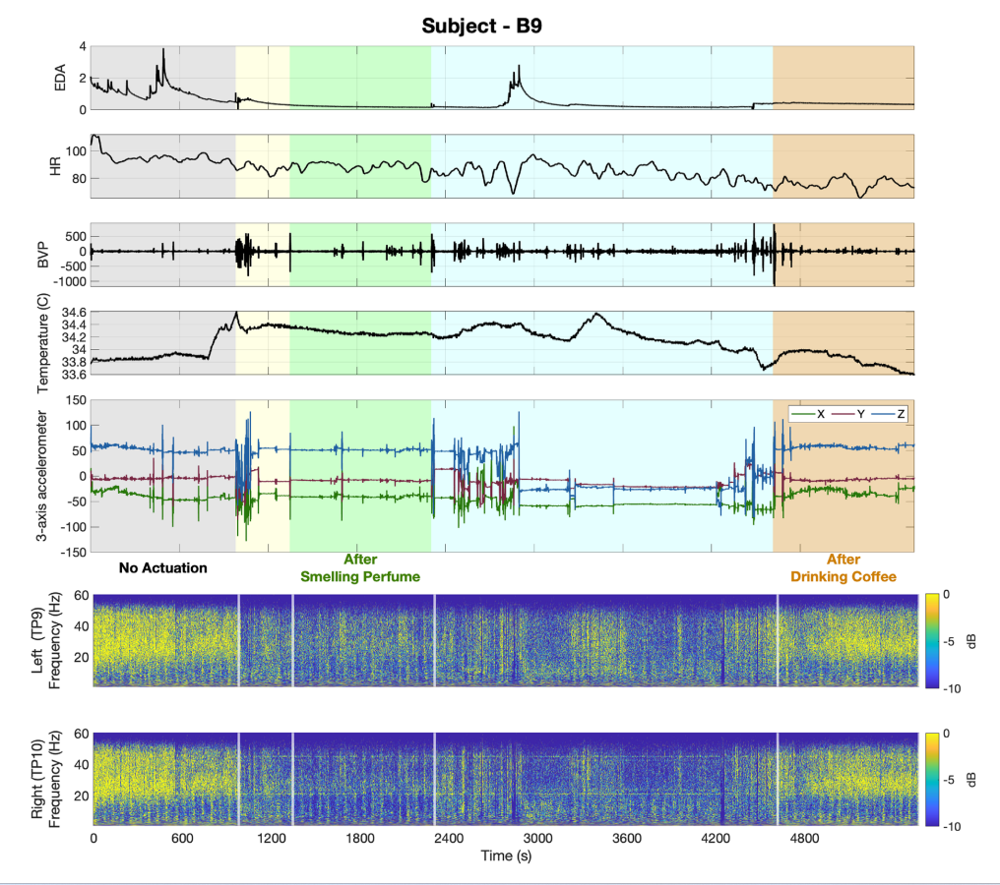

In [4]:
# Define the folder names
folders = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10']

# Define a dictionary to store the file paths for each type of data
file_paths = {}
#C:\Users\user\Desktop\Semester2\Health Data\regulation_of_brain\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\Experiment_2
# Loop over each folder
for folder in folders:
    # Construct the file paths for each type of data
    file_paths[folder] = {
        'EEG': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\EEG_recording.csv',
        'Left_ACC': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Left_ACC.csv',
        'Left_BVP': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Left_BVP.csv',
        'Left_EDA': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Left_EDA.csv',
        'Left_HR': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Left_HR.csv',
        'Left_IBI': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Left_IBI.csv',
        'Left_tags': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Left_tags.csv',
        'Left_TEMP': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Left_TEMP.csv',
        'n_back_responses': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\n_back_responses.csv',
        'Right_ACC': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Right_ACC.csv',
        'Right_BVP': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Right_BVP.csv',
        'Right_EDA': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Right_EDA.csv',
        'Right_HR': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Right_HR.csv',
        'Right_IBI': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Right_IBI.csv',
        'Right_tags': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Right_tags.csv',
        'Right_TEMP': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\Right_TEMP.csv',
        'tags': f'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\{folder}\\tags.csv',
    }

In [5]:
file_paths

{'B1': {'EEG': 'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\B1\\EEG_recording.csv',
  'Left_ACC': 'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\B1\\Left_ACC.csv',
  'Left_BVP': 'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\B1\\Left_BVP.csv',
  'Left_EDA': 'C:\\Users\\user\\Desktop\\Semester2\\Health Data\\regulation_of_brain\\regulation-of-brain-cognitive-states-through-auditory-gustatory-and-olfactory-stimulation-with-wearable-monitoring-1.0.0\\Experiment_2\\B1\\Left_EDA.csv',
  'Left_HR': 'C:\\Users\\user\

# Patient B1


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [6]:
n_backr_df = pd.read_csv(file_paths['B1']['n_back_responses'])

In [7]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [9]:
df_length=len(n_backr_df)

In [10]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [11]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [12]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [13]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [14]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [15]:
len(stimulus)

40

In [16]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [17]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [18]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,-2.0,44922.0,507.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,1.0,6.0,46935.0,506.0,NaN,0.0,0.0,PracticeSession
2,1.0,3.0,Chronos,1.0,7.0,48948.0,0.0,3.0,313.0,49261.0,PracticeSession
3,0.0,4.0,Chronos,1.0,20.0,50787.0,0.0,3.0,328.0,51115.0,PracticeSession
4,1.0,4.0,Chronos,2.0,19.0,52639.0,0.0,4.0,319.0,52958.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [19]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [20]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [21]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,2.0,19.0,5366129.0,0.0,3.0,420.0,5366549.0,CoffeeSession
1099,1.0,3.0,Chronos,2.0,19.0,5368075.0,0.0,3.0,392.0,5368467.0,CoffeeSession
1100,1.0,3.0,Chronos,1.0,20.0,5369995.0,0.0,3.0,369.0,5370364.0,CoffeeSession
1101,1.0,3.0,Chronos,3.0,19.0,5371900.0,0.0,3.0,410.0,5372310.0,CoffeeSession


### Fixation

In [22]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [23]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [24]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,1.0,3.0,Chronos,1.0,7.0,45429.0,0.0,3.0,308.0,45737.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,3.0,Chronos,2.0,6.0,47441.0,0.0,3.0,11.0,47452.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,3.0,Chronos,2.0,5.0,49267.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,4.0,Chronos,2.0,5.0,51120.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,4.0,Chronos,1.0,15.0,52973.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,1.0,7.0,5366556.0,0.0,NaN,0.0,0.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,8.0,5368475.0,0.0,NaN,0.0,0.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,17.0,5370381.0,0.0,NaN,0.0,0.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,1.0,17.0,5372327.0,0.0,NaN,0.0,0.0


#### Fixation table 100

In [25]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,1.0,3.0,Chronos,1.0,7.0,45429.0,0.0,3.0,308.0,45737.0,PracticeSession
1,1.0,3.0,Chronos,2.0,6.0,47441.0,0.0,3.0,11.0,47452.0,PracticeSession
2,0.0,3.0,Chronos,2.0,5.0,49267.0,0.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,2.0,5.0,51120.0,0.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,1.0,15.0,52973.0,0.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [26]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [27]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [28]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,1.0,7.0,5366556.0,0.0,NaN,0.0,0.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,8.0,5368475.0,0.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,2.0,17.0,5370381.0,0.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,1.0,17.0,5372327.0,0.0,NaN,0.0,0.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [29]:
left_eda_df=pd.read_csv(file_paths['B1']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624877e+09,4.0
1,0.361248,1.624877e+09,4.0
2,0.468854,1.624877e+09,4.0
3,0.466292,1.624877e+09,4.0
4,0.467573,1.624877e+09,4.0
...,...,...,...
22333,0.425299,1.624877e+09,4.0
22334,0.420175,1.624877e+09,4.0
22335,0.402241,1.624877e+09,4.0
22336,0.389431,1.624877e+09,4.0


In [30]:
right_eda_df=pd.read_csv(file_paths['B1']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624877e+09,4.0
1,0.180646,1.624877e+09,4.0
2,0.244705,1.624877e+09,4.0
3,0.238299,1.624877e+09,4.0
4,0.244705,1.624877e+09,4.0
...,...,...,...
22333,0.445850,1.624877e+09,4.0
22334,0.431757,1.624877e+09,4.0
22335,0.433038,1.624877e+09,4.0
22336,0.430475,1.624877e+09,4.0


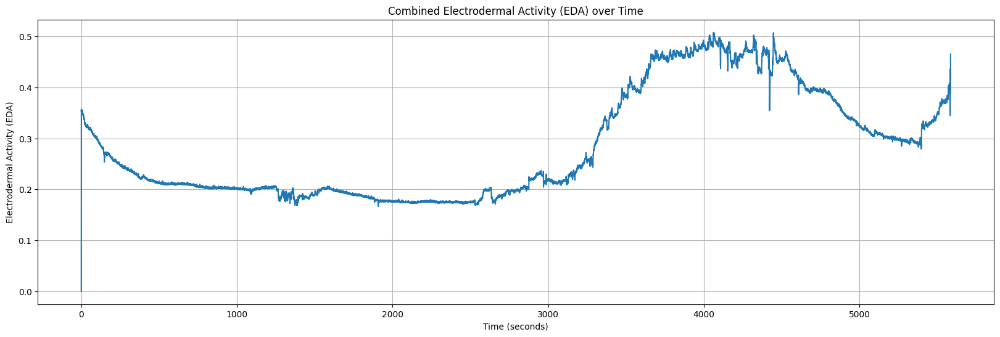

In [31]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

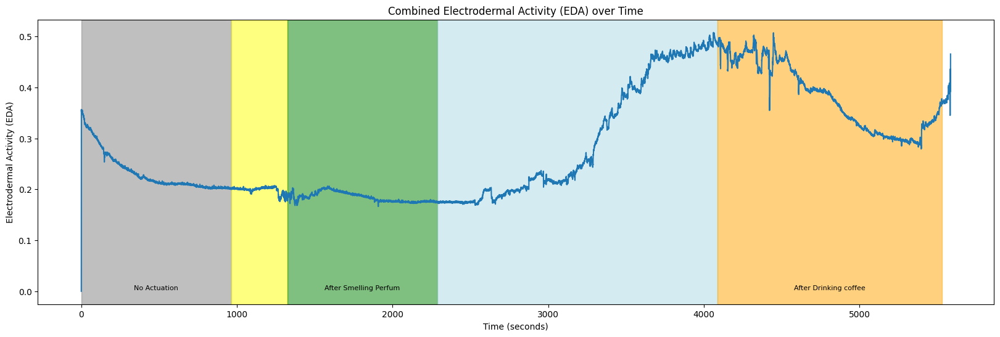

In [32]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [33]:
left_hr_df=pd.read_csv(file_paths['B1']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,85.00,1.624877e+09,1.0
1,85.00,1.624877e+09,1.0
2,80.33,1.624877e+09,1.0
3,77.00,1.624877e+09,1.0
4,81.20,1.624877e+09,1.0
...,...,...,...
5569,100.10,1.624877e+09,1.0
5570,100.17,1.624877e+09,1.0
5571,100.28,1.624877e+09,1.0
5572,100.42,1.624877e+09,1.0


In [34]:
right_hr_df=pd.read_csv(file_paths['B1']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,76.00,1.624877e+09,1.0
1,76.00,1.624877e+09,1.0
2,68.00,1.624877e+09,1.0
3,64.00,1.624877e+09,1.0
4,70.80,1.624877e+09,1.0
...,...,...,...
5569,96.72,1.624877e+09,1.0
5570,96.35,1.624877e+09,1.0
5571,96.02,1.624877e+09,1.0
5572,95.65,1.624877e+09,1.0


In [35]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624877e+09,4.0
1,0.361248,1.624877e+09,4.0
2,0.468854,1.624877e+09,4.0
3,0.466292,1.624877e+09,4.0
4,0.467573,1.624877e+09,4.0
...,...,...,...
22333,0.425299,1.624877e+09,4.0
22334,0.420175,1.624877e+09,4.0
22335,0.402241,1.624877e+09,4.0
22336,0.389431,1.624877e+09,4.0


In [36]:
main_df.index

RangeIndex(start=0, stop=22338, step=1)

In [37]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5582.0, 5582.25,  5582.5, 5582.75,  5583.0, 5583.25,  5583.5, 5583.75,
        5584.0, 5584.25],
      dtype='float64', length=22338)

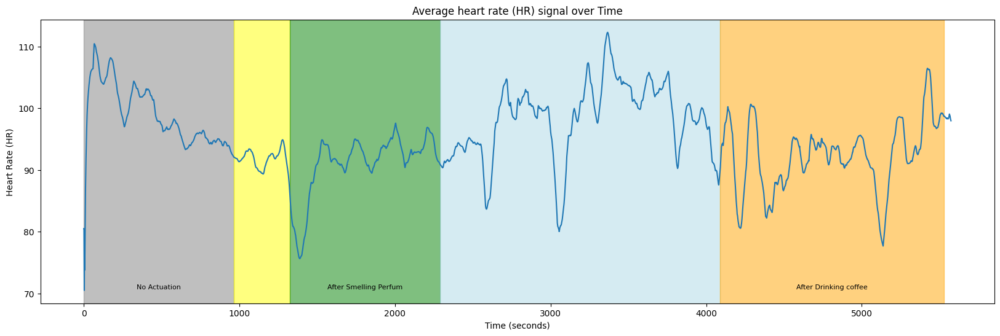

In [39]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [40]:
left_bvp_df=pd.read_csv(file_paths['B1']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624877e+09,64.0
1,-0.00,1.624877e+09,64.0
2,-0.00,1.624877e+09,64.0
3,-0.00,1.624877e+09,64.0
4,-0.00,1.624877e+09,64.0
...,...,...,...
357451,-22.33,1.624877e+09,64.0
357452,-3.17,1.624877e+09,64.0
357453,10.51,1.624877e+09,64.0
357454,12.44,1.624877e+09,64.0


In [41]:
right_bvp_df=pd.read_csv(file_paths['B1']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624877e+09,64.0
1,-0.00,1.624877e+09,64.0
2,-0.00,1.624877e+09,64.0
3,-0.00,1.624877e+09,64.0
4,-0.00,1.624877e+09,64.0
...,...,...,...
357451,0.67,1.624877e+09,64.0
357452,-26.73,1.624877e+09,64.0
357453,-47.90,1.624877e+09,64.0
357454,-61.13,1.624877e+09,64.0


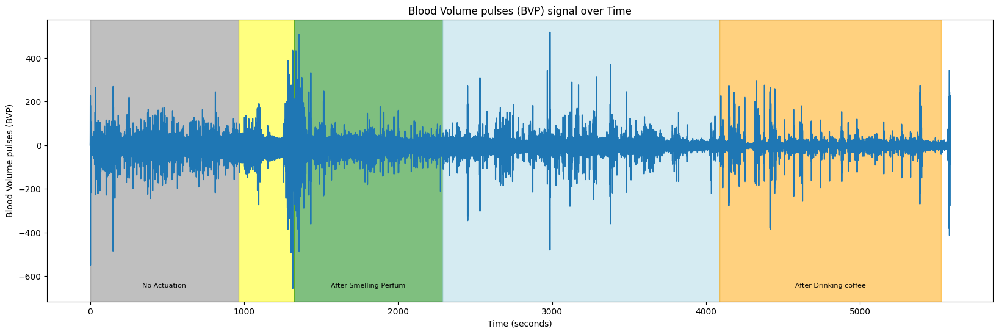

In [42]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [43]:
left_temp_df=pd.read_csv(file_paths['B1']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,32.11,1.624877e+09,4.0
1,32.11,1.624877e+09,4.0
2,32.11,1.624877e+09,4.0
3,32.11,1.624877e+09,4.0
4,32.11,1.624877e+09,4.0
...,...,...,...
22355,29.01,1.624877e+09,4.0
22356,28.99,1.624877e+09,4.0
22357,28.99,1.624877e+09,4.0
22358,28.99,1.624877e+09,4.0


In [44]:
right_temp_df=pd.read_csv(file_paths['B1']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,31.61,1.624877e+09,4.0
1,31.61,1.624877e+09,4.0
2,31.61,1.624877e+09,4.0
3,31.61,1.624877e+09,4.0
4,31.61,1.624877e+09,4.0
...,...,...,...
22355,28.81,1.624877e+09,4.0
22356,28.83,1.624877e+09,4.0
22357,28.83,1.624877e+09,4.0
22358,28.83,1.624877e+09,4.0


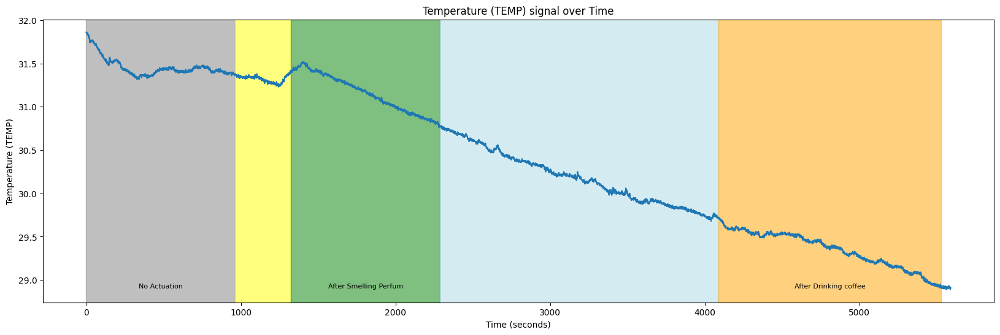

In [45]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [46]:
left_ACC_df=pd.read_csv(file_paths['B1']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-11,0,64,1.624877e+09,32.0
1,-14,1,61,1.624877e+09,32.0
2,-14,1,61,1.624877e+09,32.0
3,-14,0,62,1.624877e+09,32.0
4,-15,1,59,1.624877e+09,32.0
...,...,...,...,...,...
178681,12,-6,63,1.624877e+09,32.0
178682,12,-6,63,1.624877e+09,32.0
178683,11,-6,61,1.624877e+09,32.0
178684,11,-7,62,1.624877e+09,32.0


In [47]:
right_ACC_df=pd.read_csv(file_paths['B1']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-24,11,56,1.624877e+09,32.0
1,-21,9,60,1.624877e+09,32.0
2,-23,10,60,1.624877e+09,32.0
3,-23,10,60,1.624877e+09,32.0
4,-23,10,59,1.624877e+09,32.0
...,...,...,...,...,...
178675,-63,17,-9,1.624877e+09,32.0
178676,-63,16,-11,1.624877e+09,32.0
178677,-62,16,-10,1.624877e+09,32.0
178678,-63,16,-10,1.624877e+09,32.0


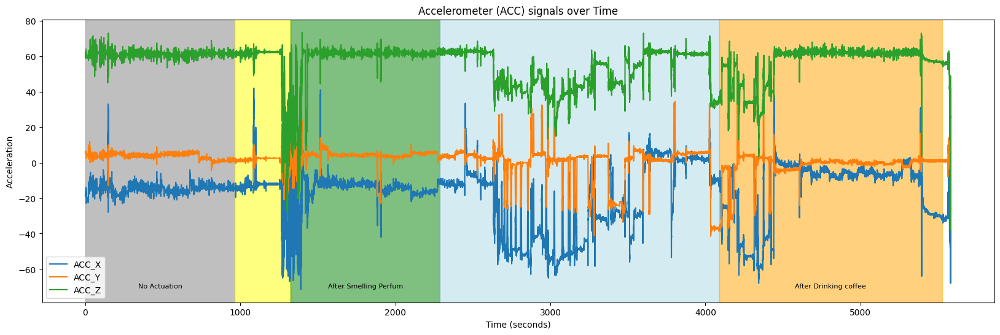

In [48]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [49]:
eeg_df=pd.read_csv(file_paths['B1']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.624877e+09,-6.836,217.285,-21.484,-9.277,-42.969
1,1.624877e+09,-5.371,151.367,-22.461,-19.531,-45.410
2,1.624877e+09,-11.719,271.484,-29.785,-22.461,2.441
3,1.624877e+09,-9.766,405.762,-23.438,-20.508,49.805
4,1.624877e+09,-21.973,398.438,-29.297,-39.062,108.887
...,...,...,...,...,...,...
1440655,1.624882e+09,74.219,-166.016,-44.434,19.531,71.289
1440656,1.624882e+09,146.484,57.617,-72.754,12.695,90.820
1440657,1.624882e+09,182.617,283.203,-67.871,35.645,55.664
1440658,1.624882e+09,129.883,193.359,-18.555,56.641,79.590


Text(0.5, 0, 'time (s)')

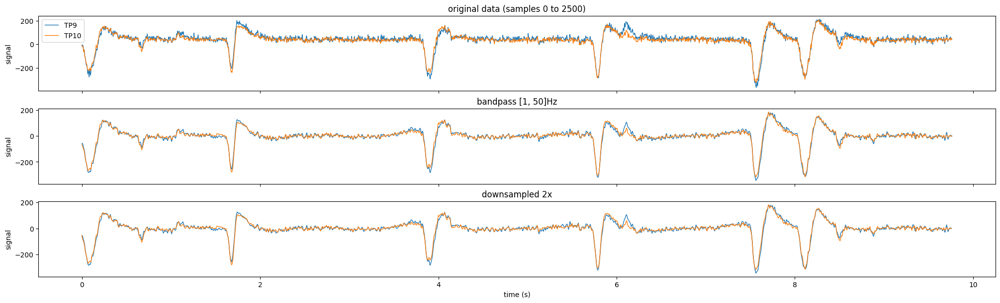

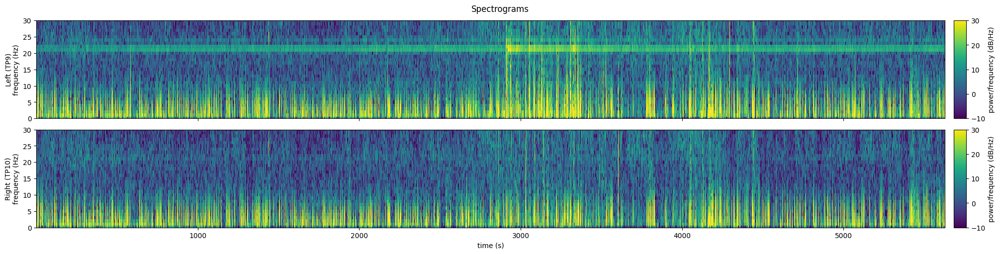

In [50]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [ ]:
n_backr_df = pd.read_csv(file_paths['B1']['n_back_responses'])

In [ ]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [ ]:
df_length=len(n_backr_df)

In [ ]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1624876815,2,2,Chronos,-999999,15,1269734,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [ ]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [ ]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [ ]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [ ]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [ ]:
len(stimulus)

40

In [ ]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [ ]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [ ]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,-2.0,44922.0,507.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,1.0,6.0,46935.0,506.0,NaN,0.0,0.0,PracticeSession
2,1.0,3.0,Chronos,1.0,7.0,48948.0,0.0,3.0,313.0,49261.0,PracticeSession
3,0.0,4.0,Chronos,1.0,20.0,50787.0,0.0,3.0,328.0,51115.0,PracticeSession
4,1.0,4.0,Chronos,2.0,19.0,52639.0,0.0,4.0,319.0,52958.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [ ]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [ ]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [ ]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,2.0,19.0,5366129.0,0.0,3.0,420.0,5366549.0,CoffeeSession
1099,1.0,3.0,Chronos,2.0,19.0,5368075.0,0.0,3.0,392.0,5368467.0,CoffeeSession
1100,1.0,3.0,Chronos,1.0,20.0,5369995.0,0.0,3.0,369.0,5370364.0,CoffeeSession
1101,1.0,3.0,Chronos,3.0,19.0,5371900.0,0.0,3.0,410.0,5372310.0,CoffeeSession


### Fixation

In [ ]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [ ]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [ ]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,1.0,3.0,Chronos,1.0,7.0,45429.0,0.0,3.0,308.0,45737.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,3.0,Chronos,2.0,6.0,47441.0,0.0,3.0,11.0,47452.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,3.0,Chronos,2.0,5.0,49267.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,4.0,Chronos,2.0,5.0,51120.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,4.0,Chronos,1.0,15.0,52973.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,1.0,7.0,5366556.0,0.0,NaN,0.0,0.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,8.0,5368475.0,0.0,NaN,0.0,0.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,17.0,5370381.0,0.0,NaN,0.0,0.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,1.0,17.0,5372327.0,0.0,NaN,0.0,0.0


#### Fixation table 100

In [ ]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,1.0,3.0,Chronos,1.0,7.0,45429.0,0.0,3.0,308.0,45737.0,PracticeSession
1,1.0,3.0,Chronos,2.0,6.0,47441.0,0.0,3.0,11.0,47452.0,PracticeSession
2,0.0,3.0,Chronos,2.0,5.0,49267.0,0.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,2.0,5.0,51120.0,0.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,1.0,15.0,52973.0,0.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [ ]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [ ]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [ ]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,1.0,7.0,5366556.0,0.0,NaN,0.0,0.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,8.0,5368475.0,0.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,2.0,17.0,5370381.0,0.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,1.0,17.0,5372327.0,0.0,NaN,0.0,0.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [ ]:
left_eda_df=pd.read_csv(file_paths['B1']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624877e+09,4.0
1,0.361248,1.624877e+09,4.0
2,0.468854,1.624877e+09,4.0
3,0.466292,1.624877e+09,4.0
4,0.467573,1.624877e+09,4.0
...,...,...,...
22333,0.425299,1.624877e+09,4.0
22334,0.420175,1.624877e+09,4.0
22335,0.402241,1.624877e+09,4.0
22336,0.389431,1.624877e+09,4.0


In [ ]:
right_eda_df=pd.read_csv(file_paths['B1']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624877e+09,4.0
1,0.180646,1.624877e+09,4.0
2,0.244705,1.624877e+09,4.0
3,0.238299,1.624877e+09,4.0
4,0.244705,1.624877e+09,4.0
...,...,...,...
22333,0.445850,1.624877e+09,4.0
22334,0.431757,1.624877e+09,4.0
22335,0.433038,1.624877e+09,4.0
22336,0.430475,1.624877e+09,4.0


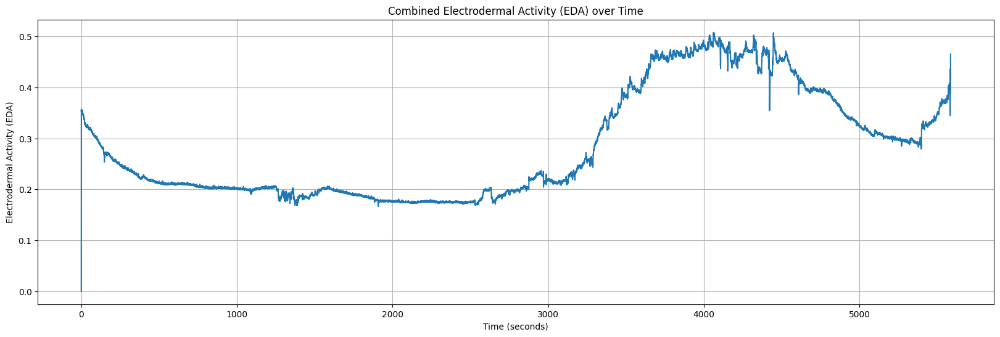

In [ ]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

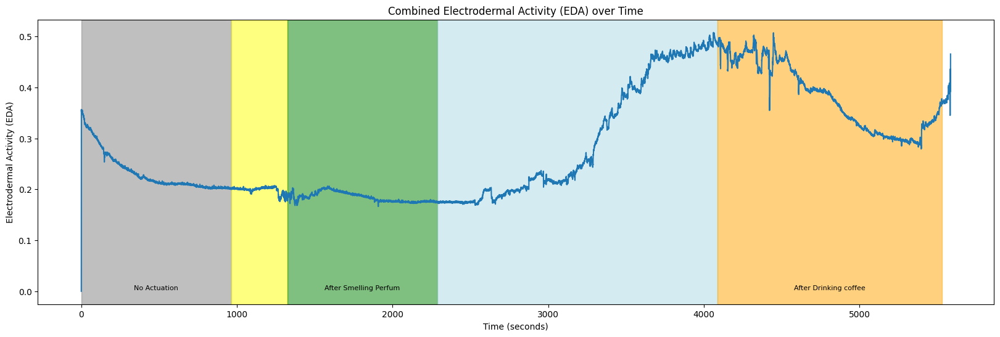

In [ ]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [ ]:
left_hr_df=pd.read_csv(file_paths['B1']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,85.00,1.624877e+09,1.0
1,85.00,1.624877e+09,1.0
2,80.33,1.624877e+09,1.0
3,77.00,1.624877e+09,1.0
4,81.20,1.624877e+09,1.0
...,...,...,...
5569,100.10,1.624877e+09,1.0
5570,100.17,1.624877e+09,1.0
5571,100.28,1.624877e+09,1.0
5572,100.42,1.624877e+09,1.0


In [ ]:
right_hr_df=pd.read_csv(file_paths['B1']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,76.00,1.624877e+09,1.0
1,76.00,1.624877e+09,1.0
2,68.00,1.624877e+09,1.0
3,64.00,1.624877e+09,1.0
4,70.80,1.624877e+09,1.0
...,...,...,...
5569,96.72,1.624877e+09,1.0
5570,96.35,1.624877e+09,1.0
5571,96.02,1.624877e+09,1.0
5572,95.65,1.624877e+09,1.0


In [ ]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624877e+09,4.0
1,0.361248,1.624877e+09,4.0
2,0.468854,1.624877e+09,4.0
3,0.466292,1.624877e+09,4.0
4,0.467573,1.624877e+09,4.0
...,...,...,...
22333,0.425299,1.624877e+09,4.0
22334,0.420175,1.624877e+09,4.0
22335,0.402241,1.624877e+09,4.0
22336,0.389431,1.624877e+09,4.0


In [ ]:
main_df.index

RangeIndex(start=0, stop=22338, step=1)

In [ ]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5582.0, 5582.25,  5582.5, 5582.75,  5583.0, 5583.25,  5583.5, 5583.75,
        5584.0, 5584.25],
      dtype='float64', length=22338)

In [ ]:
hr_main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624877e+09,4.0
1,0.361248,1.624877e+09,4.0
2,0.468854,1.624877e+09,4.0
3,0.466292,1.624877e+09,4.0
4,0.467573,1.624877e+09,4.0
...,...,...,...
22333,0.425299,1.624877e+09,4.0
22334,0.420175,1.624877e+09,4.0
22335,0.402241,1.624877e+09,4.0
22336,0.389431,1.624877e+09,4.0


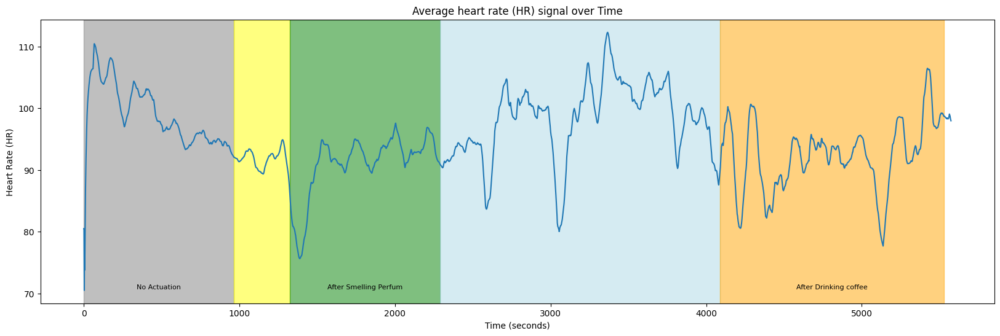

In [ ]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [ ]:
left_bvp_df=pd.read_csv(file_paths['B1']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624877e+09,64.0
1,-0.00,1.624877e+09,64.0
2,-0.00,1.624877e+09,64.0
3,-0.00,1.624877e+09,64.0
4,-0.00,1.624877e+09,64.0
...,...,...,...
357451,-22.33,1.624877e+09,64.0
357452,-3.17,1.624877e+09,64.0
357453,10.51,1.624877e+09,64.0
357454,12.44,1.624877e+09,64.0


In [ ]:
right_bvp_df=pd.read_csv(file_paths['B1']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624877e+09,64.0
1,-0.00,1.624877e+09,64.0
2,-0.00,1.624877e+09,64.0
3,-0.00,1.624877e+09,64.0
4,-0.00,1.624877e+09,64.0
...,...,...,...
357451,0.67,1.624877e+09,64.0
357452,-26.73,1.624877e+09,64.0
357453,-47.90,1.624877e+09,64.0
357454,-61.13,1.624877e+09,64.0


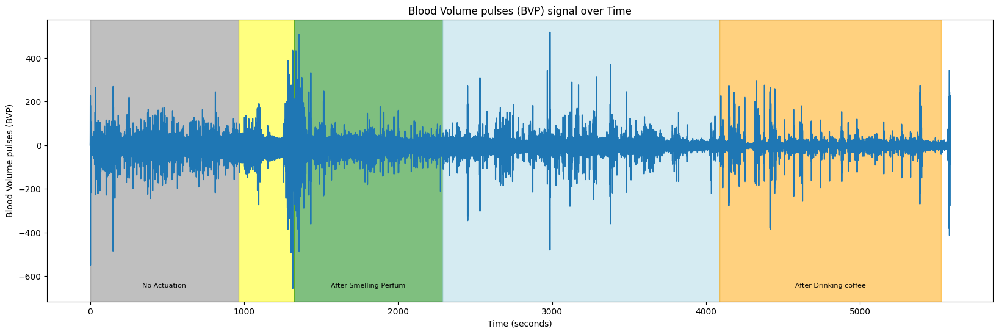

In [ ]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [ ]:
left_temp_df=pd.read_csv(file_paths['B1']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,32.11,1.624877e+09,4.0
1,32.11,1.624877e+09,4.0
2,32.11,1.624877e+09,4.0
3,32.11,1.624877e+09,4.0
4,32.11,1.624877e+09,4.0
...,...,...,...
22355,29.01,1.624877e+09,4.0
22356,28.99,1.624877e+09,4.0
22357,28.99,1.624877e+09,4.0
22358,28.99,1.624877e+09,4.0


In [ ]:
right_temp_df=pd.read_csv(file_paths['B1']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,31.61,1.624877e+09,4.0
1,31.61,1.624877e+09,4.0
2,31.61,1.624877e+09,4.0
3,31.61,1.624877e+09,4.0
4,31.61,1.624877e+09,4.0
...,...,...,...
22355,28.81,1.624877e+09,4.0
22356,28.83,1.624877e+09,4.0
22357,28.83,1.624877e+09,4.0
22358,28.83,1.624877e+09,4.0


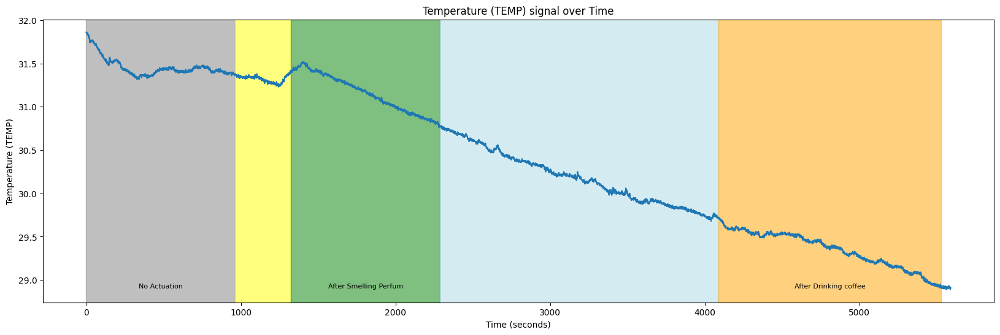

In [ ]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [ ]:
left_ACC_df=pd.read_csv(file_paths['B1']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-11,0,64,1.624877e+09,32.0
1,-14,1,61,1.624877e+09,32.0
2,-14,1,61,1.624877e+09,32.0
3,-14,0,62,1.624877e+09,32.0
4,-15,1,59,1.624877e+09,32.0
...,...,...,...,...,...
178681,12,-6,63,1.624877e+09,32.0
178682,12,-6,63,1.624877e+09,32.0
178683,11,-6,61,1.624877e+09,32.0
178684,11,-7,62,1.624877e+09,32.0


In [ ]:
right_ACC_df=pd.read_csv(file_paths['B1']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-24,11,56,1.624877e+09,32.0
1,-21,9,60,1.624877e+09,32.0
2,-23,10,60,1.624877e+09,32.0
3,-23,10,60,1.624877e+09,32.0
4,-23,10,59,1.624877e+09,32.0
...,...,...,...,...,...
178675,-63,17,-9,1.624877e+09,32.0
178676,-63,16,-11,1.624877e+09,32.0
178677,-62,16,-10,1.624877e+09,32.0
178678,-63,16,-10,1.624877e+09,32.0


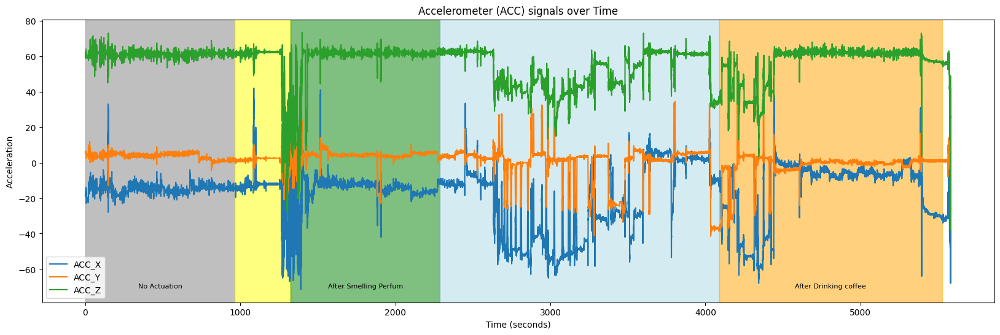

In [ ]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [51]:
eeg_df=pd.read_csv(file_paths['B1']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.624877e+09,-6.836,217.285,-21.484,-9.277,-42.969
1,1.624877e+09,-5.371,151.367,-22.461,-19.531,-45.410
2,1.624877e+09,-11.719,271.484,-29.785,-22.461,2.441
3,1.624877e+09,-9.766,405.762,-23.438,-20.508,49.805
4,1.624877e+09,-21.973,398.438,-29.297,-39.062,108.887
...,...,...,...,...,...,...
1440655,1.624882e+09,74.219,-166.016,-44.434,19.531,71.289
1440656,1.624882e+09,146.484,57.617,-72.754,12.695,90.820
1440657,1.624882e+09,182.617,283.203,-67.871,35.645,55.664
1440658,1.624882e+09,129.883,193.359,-18.555,56.641,79.590


Text(0.5, 0, 'time (s)')

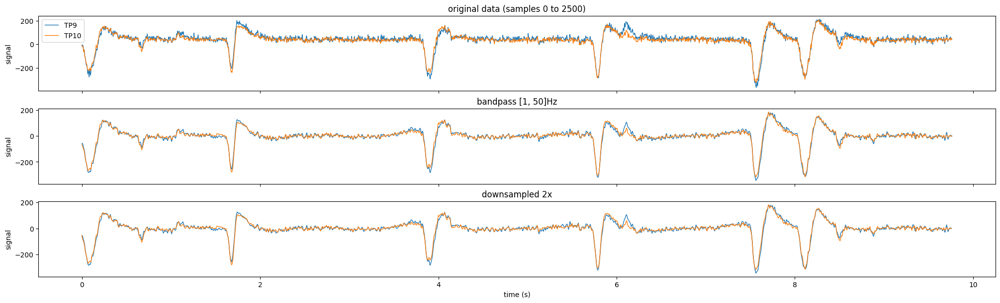

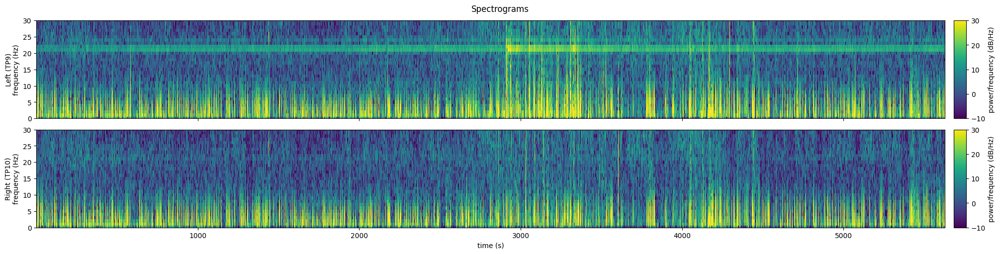

In [52]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


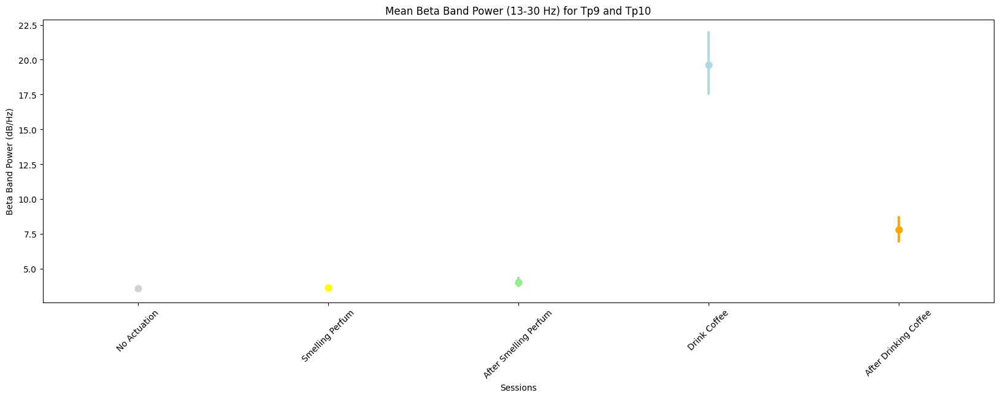

In [53]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


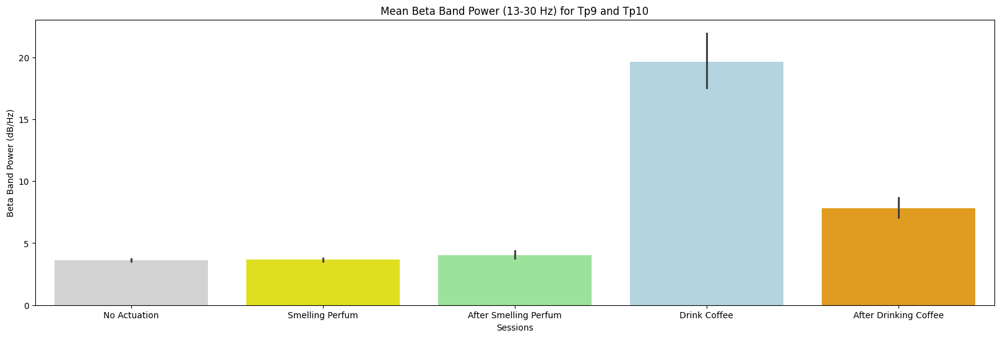

In [55]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()

# Patient B2


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [56]:
n_backr_df = pd.read_csv(file_paths['B2']['n_back_responses'])

In [57]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [52]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [53]:
df_length=len(n_backr_df)

In [54]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1624275203,3,2,Chronos,-999999,15,1848133,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [55]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [56]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [57]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [58]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [59]:
len(stimulus)

40

In [60]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [61]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [62]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,1.0,-2.0,607714.0,506.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,1.0,7.0,609727.0,506.0,NaN,0.0,0.0,PracticeSession
2,1.0,3.0,Chronos,1.0,6.0,611739.0,0.0,3.0,350.0,612089.0,PracticeSession
3,0.0,4.0,Chronos,2.0,19.0,613618.0,0.0,3.0,272.0,613890.0,PracticeSession
4,0.0,4.0,Chronos,1.0,20.0,615418.0,506.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [63]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [64]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [65]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,2.0,19.0,6122953.0,0.0,3.0,418.0,6123371.0,CoffeeSession
1099,1.0,3.0,Chronos,2.0,19.0,6124899.0,0.0,3.0,387.0,6125286.0,CoffeeSession
1100,1.0,3.0,Chronos,2.0,20.0,6126819.0,0.0,3.0,353.0,6127172.0,CoffeeSession
1101,1.0,3.0,Chronos,2.0,20.0,6128698.0,0.0,3.0,430.0,6129128.0,CoffeeSession


### Fixation

In [66]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [67]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [68]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,1.0,3.0,Chronos,2.0,6.0,608220.0,0.0,3.0,465.0,608685.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,3.0,Chronos,1.0,6.0,610233.0,0.0,3.0,450.0,610683.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,3.0,Chronos,2.0,10.0,612099.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,4.0,Chronos,2.0,8.0,613898.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,4.0,Chronos,2.0,6.0,615924.0,0.0,4.0,3.0,615927.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,1.0,9.0,6123380.0,0.0,NaN,0.0,0.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,12.0,6125299.0,0.0,NaN,0.0,0.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,6.0,6127178.0,0.0,NaN,0.0,0.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,1.0,10.0,6129138.0,0.0,NaN,0.0,0.0


#### Fixation table 100

In [69]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,1.0,3.0,Chronos,2.0,6.0,608220.0,0.0,3.0,465.0,608685.0,PracticeSession
1,1.0,3.0,Chronos,1.0,6.0,610233.0,0.0,3.0,450.0,610683.0,PracticeSession
2,0.0,3.0,Chronos,2.0,10.0,612099.0,0.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,2.0,8.0,613898.0,0.0,NaN,0.0,0.0,PracticeSession
4,1.0,4.0,Chronos,2.0,6.0,615924.0,0.0,4.0,3.0,615927.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [70]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [71]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [72]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,1.0,9.0,6123380.0,0.0,NaN,0.0,0.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,12.0,6125299.0,0.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,2.0,6.0,6127178.0,0.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,1.0,10.0,6129138.0,0.0,NaN,0.0,0.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [73]:
left_eda_df=pd.read_csv(file_paths['B2']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624276e+09,4.0
1,0.835227,1.624276e+09,4.0
2,1.182651,1.624276e+09,4.0
3,1.511943,1.624276e+09,4.0
4,1.496669,1.624276e+09,4.0
...,...,...,...
22975,0.375606,1.624276e+09,4.0
22976,0.371763,1.624276e+09,4.0
22977,0.528048,1.624276e+09,4.0
22978,0.547263,1.624276e+09,4.0


In [74]:
right_eda_df=pd.read_csv(file_paths['B2']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624276e+09,4.0
1,0.831534,1.624276e+09,4.0
2,1.177739,1.624276e+09,4.0
3,1.615997,1.624276e+09,4.0
4,1.763440,1.624276e+09,4.0
...,...,...,...
22975,2.773418,1.624276e+09,4.0
22976,2.743949,1.624276e+09,4.0
22977,2.884887,1.624276e+09,4.0
22978,2.977137,1.624276e+09,4.0


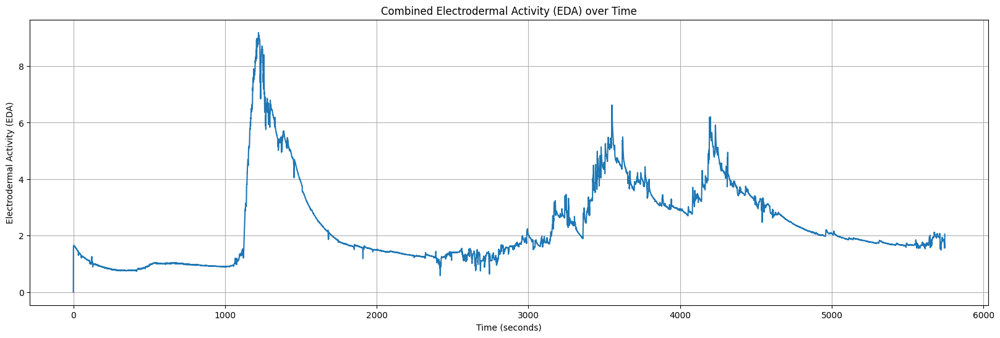

In [75]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

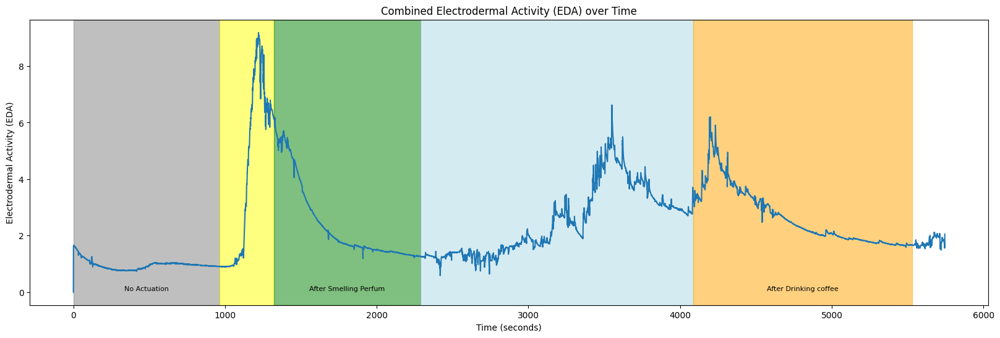

In [76]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [77]:
left_hr_df=pd.read_csv(file_paths['B2']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,49.00,1.624276e+09,1.0
1,64.50,1.624276e+09,1.0
2,69.00,1.624276e+09,1.0
3,71.25,1.624276e+09,1.0
4,74.00,1.624276e+09,1.0
...,...,...,...
5731,78.23,1.624276e+09,1.0
5732,78.07,1.624276e+09,1.0
5733,77.92,1.624276e+09,1.0
5734,77.77,1.624276e+09,1.0


In [78]:
right_hr_df=pd.read_csv(file_paths['B2']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,76.00,1.624276e+09,1.0
1,71.50,1.624276e+09,1.0
2,68.00,1.624276e+09,1.0
3,71.75,1.624276e+09,1.0
4,74.00,1.624276e+09,1.0
...,...,...,...
5731,78.03,1.624276e+09,1.0
5732,78.02,1.624276e+09,1.0
5733,78.02,1.624276e+09,1.0
5734,77.93,1.624276e+09,1.0


In [79]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624276e+09,4.0
1,0.835227,1.624276e+09,4.0
2,1.182651,1.624276e+09,4.0
3,1.511943,1.624276e+09,4.0
4,1.496669,1.624276e+09,4.0
...,...,...,...
22975,0.375606,1.624276e+09,4.0
22976,0.371763,1.624276e+09,4.0
22977,0.528048,1.624276e+09,4.0
22978,0.547263,1.624276e+09,4.0


In [80]:
main_df.index

RangeIndex(start=0, stop=22980, step=1)

In [81]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5742.5, 5742.75,  5743.0, 5743.25,  5743.5, 5743.75,  5744.0, 5744.25,
        5744.5, 5744.75],
      dtype='float64', length=22980)

In [82]:
hr_main_df

,HR,start_time_unix,sampling_rate
0,85.00,1.624877e+09,1.0
1,85.00,1.624877e+09,1.0
2,80.33,1.624877e+09,1.0
3,77.00,1.624877e+09,1.0
4,81.20,1.624877e+09,1.0
...,...,...,...
5569,100.10,1.624877e+09,1.0
5570,100.17,1.624877e+09,1.0
5571,100.28,1.624877e+09,1.0
5572,100.42,1.624877e+09,1.0


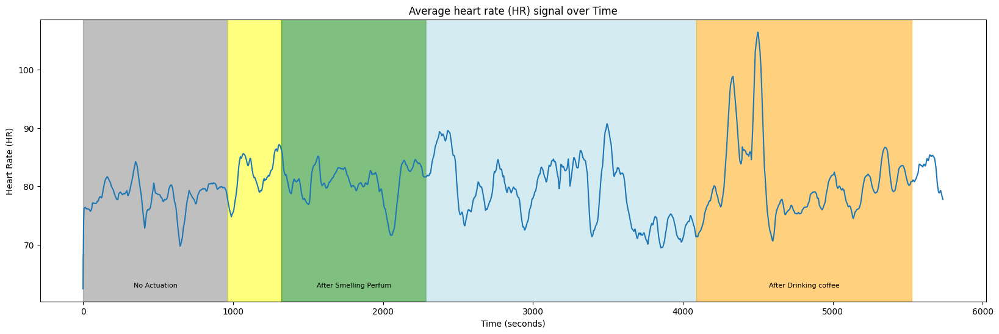

In [83]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [84]:
left_bvp_df=pd.read_csv(file_paths['B2']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624276e+09,64.0
1,-0.00,1.624276e+09,64.0
2,-0.00,1.624276e+09,64.0
3,-0.00,1.624276e+09,64.0
4,-0.00,1.624276e+09,64.0
...,...,...,...
367725,-185.63,1.624276e+09,64.0
367726,-144.59,1.624276e+09,64.0
367727,-79.21,1.624276e+09,64.0
367728,-2.01,1.624276e+09,64.0


In [85]:
right_bvp_df=pd.read_csv(file_paths['B2']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624276e+09,64.0
1,-0.00,1.624276e+09,64.0
2,-0.00,1.624276e+09,64.0
3,-0.00,1.624276e+09,64.0
4,-0.00,1.624276e+09,64.0
...,...,...,...
367714,38.75,1.624276e+09,64.0
367715,33.21,1.624276e+09,64.0
367716,28.02,1.624276e+09,64.0
367717,22.88,1.624276e+09,64.0


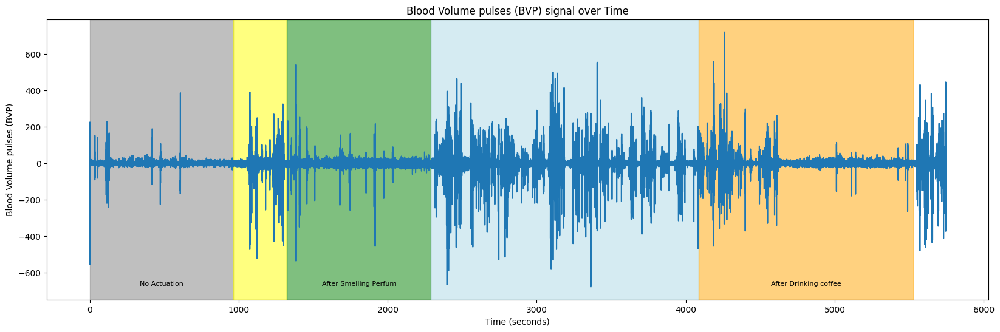

In [86]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [87]:
left_temp_df=pd.read_csv(file_paths['B2']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,33.11,1.624276e+09,4.0
1,33.11,1.624276e+09,4.0
2,33.11,1.624276e+09,4.0
3,33.11,1.624276e+09,4.0
4,33.11,1.624276e+09,4.0
...,...,...,...
23003,34.57,1.624276e+09,4.0
23004,34.59,1.624276e+09,4.0
23005,34.59,1.624276e+09,4.0
23006,34.59,1.624276e+09,4.0


In [88]:
right_temp_df=pd.read_csv(file_paths['B2']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,34.25,1.624276e+09,4.0
1,34.25,1.624276e+09,4.0
2,34.25,1.624276e+09,4.0
3,34.25,1.624276e+09,4.0
4,34.25,1.624276e+09,4.0
...,...,...,...
23003,34.16,1.624276e+09,4.0
23004,34.16,1.624276e+09,4.0
23005,34.16,1.624276e+09,4.0
23006,34.16,1.624276e+09,4.0


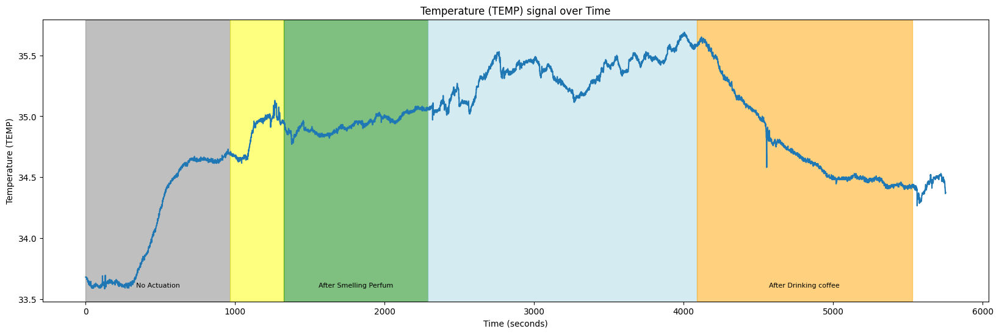

In [89]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [90]:
left_ACC_df=pd.read_csv(file_paths['B2']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-25,-1,58,1.624276e+09,32.0
1,-25,-1,59,1.624276e+09,32.0
2,-25,-1,59,1.624276e+09,32.0
3,-25,-1,58,1.624276e+09,32.0
4,-25,-1,59,1.624276e+09,32.0
...,...,...,...,...,...
183871,0,1,64,1.624276e+09,32.0
183872,0,1,64,1.624276e+09,32.0
183873,0,1,63,1.624276e+09,32.0
183874,0,1,64,1.624276e+09,32.0


In [91]:
right_ACC_df=pd.read_csv(file_paths['B2']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-24,7,59,1.624276e+09,32.0
1,-25,6,60,1.624276e+09,32.0
2,-25,6,60,1.624276e+09,32.0
3,-25,6,59,1.624276e+09,32.0
4,-23,7,59,1.624276e+09,32.0
...,...,...,...,...,...
183859,0,25,58,1.624276e+09,32.0
183860,0,25,58,1.624276e+09,32.0
183861,-1,26,58,1.624276e+09,32.0
183862,-1,26,57,1.624276e+09,32.0


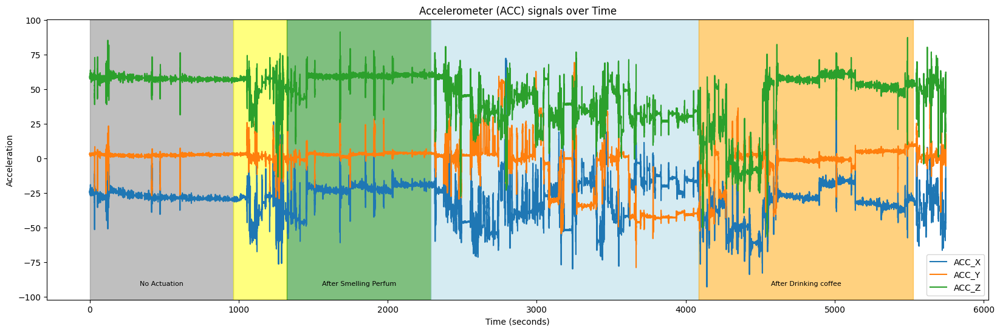

In [92]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [58]:
eeg_df=pd.read_csv(file_paths['B2']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.624276e+09,-127.441,29.297,24.414,13.184,40.527
1,1.624276e+09,-114.258,26.855,22.949,21.973,41.016
2,1.624276e+09,-120.605,22.461,25.879,32.227,-36.621
3,1.624276e+09,-150.391,20.996,27.832,27.832,-7.812
4,1.624276e+09,-166.504,27.344,25.879,25.391,9.766
...,...,...,...,...,...,...
1477891,1.624282e+09,104.492,14.648,16.602,123.047,42.969
1477892,1.624282e+09,109.863,14.648,15.625,128.906,53.223
1477893,1.624282e+09,104.980,13.672,16.602,136.230,30.762
1477894,1.624282e+09,105.957,13.184,20.020,135.742,36.621


Text(0.5, 0, 'time (s)')

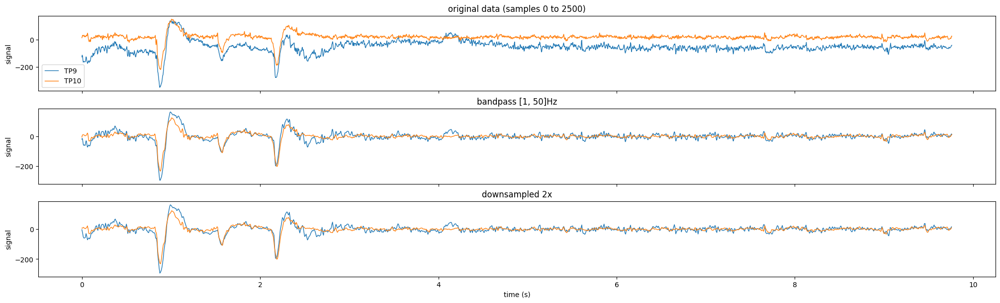

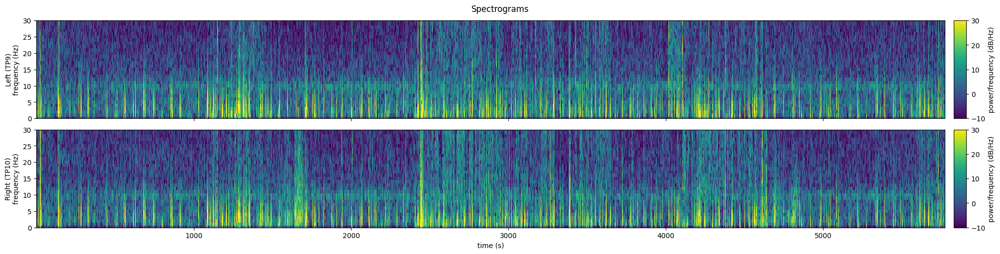

In [59]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


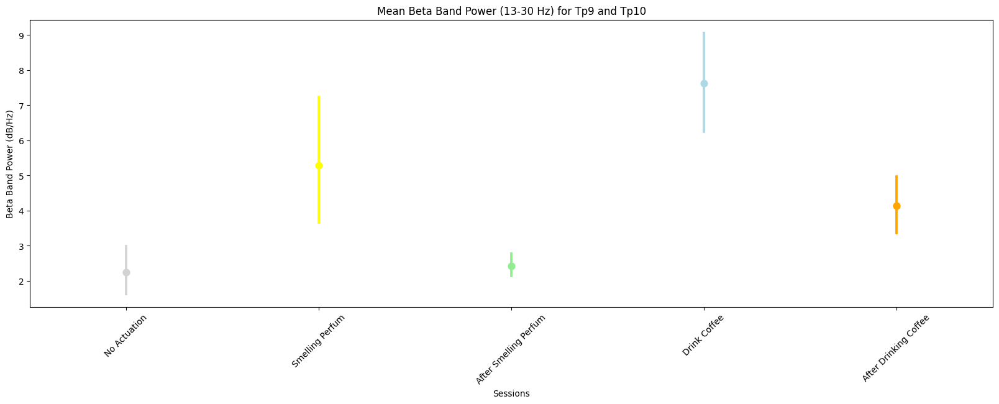

In [60]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


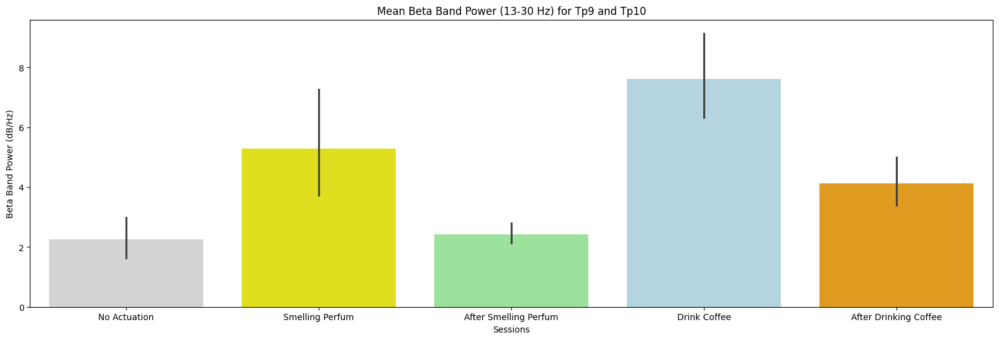

In [61]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()

# Patient B3


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [95]:
n_backr_df = pd.read_csv(file_paths['B3']['n_back_responses'])

In [96]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [98]:
df_length=len(n_backr_df)

In [99]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1624889432,5,2,Chronos,-999999,29,2547438,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [100]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [101]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [102]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [103]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [104]:
len(stimulus)

40

In [105]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [106]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [107]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,1.0,-2.0,1275324.0,506.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,1.0,20.0,1277350.0,506.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,2.0,6.0,1279362.0,507.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,1.0,6.0,1281375.0,506.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,2.0,6.0,1283387.0,507.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [108]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [109]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [110]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,1.0,6.0,6626133.0,506.0,NaN,0.0,0.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,6.0,6628145.0,507.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,1.0,6.0,6630158.0,506.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,2.0,6.0,6632170.0,507.0,NaN,0.0,0.0,CoffeeSession


### Fixation

In [111]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [112]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [113]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,0.0,3.0,Chronos,2.0,6.0,1275830.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,3.0,Chronos,2.0,6.0,1277856.0,0.0,3.0,237.0,1278093.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,3.0,Chronos,2.0,7.0,1279869.0,0.0,3.0,211.0,1280080.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,4.0,Chronos,2.0,6.0,1281881.0,0.0,4.0,275.0,1282156.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,4.0,Chronos,1.0,7.0,1283894.0,0.0,4.0,967.0,1284861.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,2.0,6.0,6626639.0,0.0,3.0,250.0,6626889.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,6628652.0,0.0,3.0,171.0,6628823.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,2.0,6.0,6630664.0,0.0,3.0,186.0,6630850.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,6632677.0,0.0,3.0,173.0,6632850.0


#### Fixation table 100

In [114]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,6.0,1275830.0,0.0,NaN,0.0,0.0,PracticeSession
1,1.0,3.0,Chronos,2.0,6.0,1277856.0,0.0,3.0,237.0,1278093.0,PracticeSession
2,1.0,3.0,Chronos,2.0,7.0,1279869.0,0.0,3.0,211.0,1280080.0,PracticeSession
3,1.0,4.0,Chronos,2.0,6.0,1281881.0,0.0,4.0,275.0,1282156.0,PracticeSession
4,1.0,4.0,Chronos,1.0,7.0,1283894.0,0.0,4.0,967.0,1284861.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [115]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [116]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [117]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,2.0,6.0,6626639.0,0.0,3.0,250.0,6626889.0,CoffeeSession
1099,1.0,3.0,Chronos,1.0,7.0,6628652.0,0.0,3.0,171.0,6628823.0,CoffeeSession
1100,1.0,3.0,Chronos,2.0,6.0,6630664.0,0.0,3.0,186.0,6630850.0,CoffeeSession
1101,1.0,3.0,Chronos,1.0,7.0,6632677.0,0.0,3.0,173.0,6632850.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [118]:
left_eda_df=pd.read_csv(file_paths['B3']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624891e+09,4.0
1,0.827840,1.624891e+09,4.0
2,1.174108,1.624891e+09,4.0
3,1.500955,1.624891e+09,4.0
4,1.484395,1.624891e+09,4.0
...,...,...,...
22819,0.799914,1.624891e+09,4.0
22820,0.865270,1.624891e+09,4.0
22821,1.172826,1.624891e+09,4.0
22822,1.611163,1.624891e+09,4.0


In [119]:
right_eda_df=pd.read_csv(file_paths['B3']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624891e+09,4.0
1,0.838918,1.624891e+09,4.0
2,0.926279,1.624891e+09,4.0
3,0.805884,1.624891e+09,4.0
4,0.767461,1.624891e+09,4.0
...,...,...,...
22819,0.951964,1.624891e+09,4.0
22820,0.985264,1.624891e+09,4.0
22821,1.340043,1.624891e+09,4.0
22822,1.477088,1.624891e+09,4.0


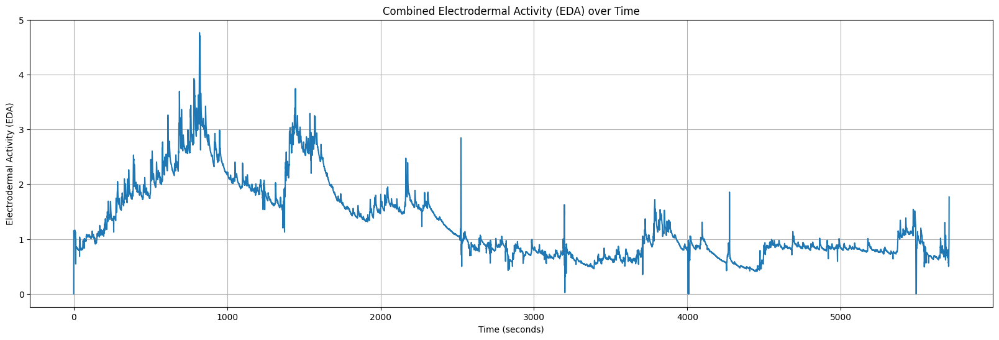

In [120]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

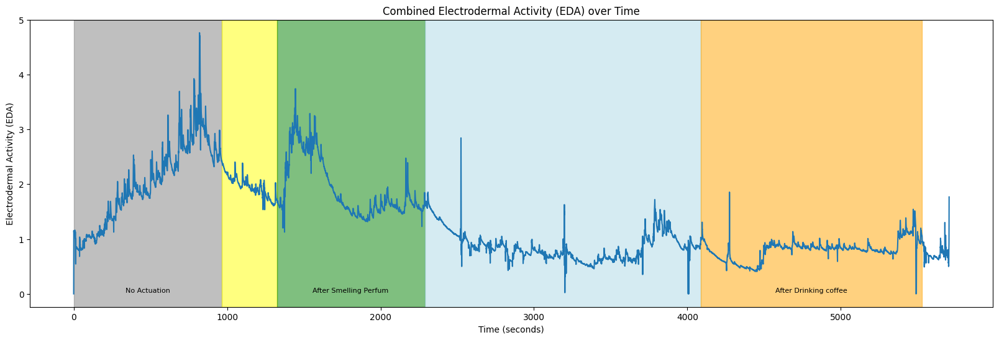

In [121]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [122]:
left_hr_df=pd.read_csv(file_paths['B3']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,101.00,1.624891e+09,1.0
1,108.00,1.624891e+09,1.0
2,129.67,1.624891e+09,1.0
3,111.75,1.624891e+09,1.0
4,101.00,1.624891e+09,1.0
...,...,...,...
5690,88.00,1.624891e+09,1.0
5691,87.72,1.624891e+09,1.0
5692,87.45,1.624891e+09,1.0
5693,87.18,1.624891e+09,1.0


In [123]:
right_hr_df=pd.read_csv(file_paths['B3']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,59.00,1.624891e+09,1.0
1,59.00,1.624891e+09,1.0
2,72.00,1.624891e+09,1.0
3,69.25,1.624891e+09,1.0
4,65.20,1.624891e+09,1.0
...,...,...,...
5690,74.50,1.624891e+09,1.0
5691,74.63,1.624891e+09,1.0
5692,74.72,1.624891e+09,1.0
5693,74.80,1.624891e+09,1.0


In [124]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624891e+09,4.0
1,0.827840,1.624891e+09,4.0
2,1.174108,1.624891e+09,4.0
3,1.500955,1.624891e+09,4.0
4,1.484395,1.624891e+09,4.0
...,...,...,...
22819,0.799914,1.624891e+09,4.0
22820,0.865270,1.624891e+09,4.0
22821,1.172826,1.624891e+09,4.0
22822,1.611163,1.624891e+09,4.0


In [125]:
main_df.index

RangeIndex(start=0, stop=22824, step=1)

In [126]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5703.5, 5703.75,  5704.0, 5704.25,  5704.5, 5704.75,  5705.0, 5705.25,
        5705.5, 5705.75],
      dtype='float64', length=22824)

In [127]:
hr_main_df

,HR,start_time_unix,sampling_rate
0,49.00,1.624276e+09,1.0
1,64.50,1.624276e+09,1.0
2,69.00,1.624276e+09,1.0
3,71.25,1.624276e+09,1.0
4,74.00,1.624276e+09,1.0
...,...,...,...
5731,78.23,1.624276e+09,1.0
5732,78.07,1.624276e+09,1.0
5733,77.92,1.624276e+09,1.0
5734,77.77,1.624276e+09,1.0


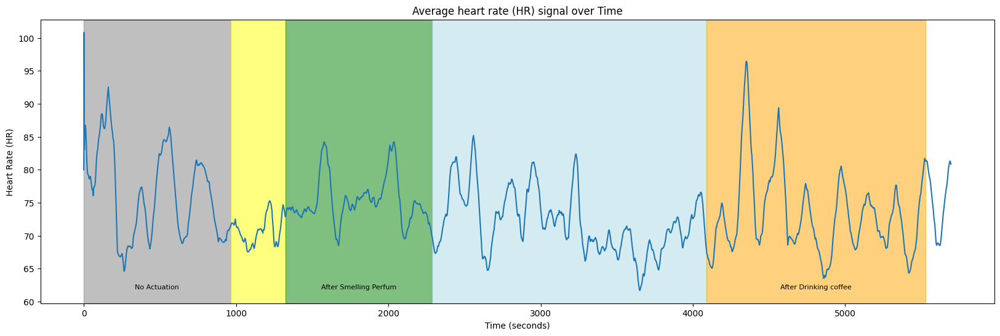

In [128]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [129]:
left_bvp_df=pd.read_csv(file_paths['B3']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624891e+09,64.0
1,-0.00,1.624891e+09,64.0
2,-0.00,1.624891e+09,64.0
3,-0.00,1.624891e+09,64.0
4,-0.00,1.624891e+09,64.0
...,...,...,...
365250,77.01,1.624891e+09,64.0
365251,99.40,1.624891e+09,64.0
365252,112.48,1.624891e+09,64.0
365253,110.65,1.624891e+09,64.0


In [130]:
right_bvp_df=pd.read_csv(file_paths['B3']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624891e+09,64.0
1,-0.00,1.624891e+09,64.0
2,-0.00,1.624891e+09,64.0
3,-0.00,1.624891e+09,64.0
4,-0.00,1.624891e+09,64.0
...,...,...,...
365239,-10.59,1.624891e+09,64.0
365240,-10.53,1.624891e+09,64.0
365241,-0.18,1.624891e+09,64.0
365242,17.87,1.624891e+09,64.0


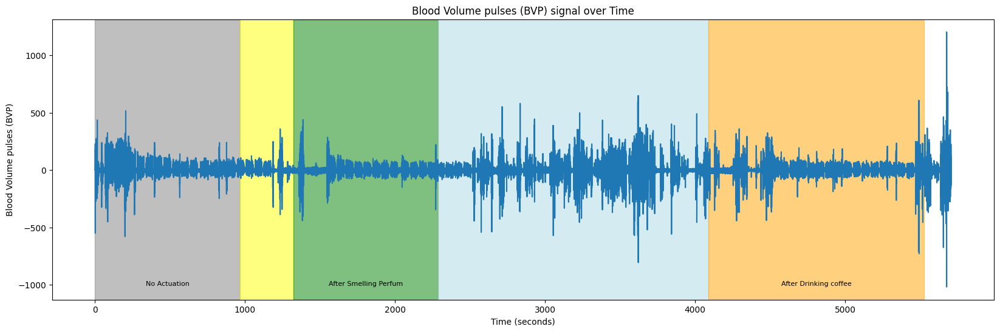

In [131]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [132]:
left_temp_df=pd.read_csv(file_paths['B3']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,31.63,1.624891e+09,4.0
1,31.63,1.624891e+09,4.0
2,31.63,1.624891e+09,4.0
3,31.63,1.624891e+09,4.0
4,31.63,1.624891e+09,4.0
...,...,...,...
22835,31.53,1.624891e+09,4.0
22836,31.51,1.624891e+09,4.0
22837,31.51,1.624891e+09,4.0
22838,31.51,1.624891e+09,4.0


In [133]:
right_temp_df=pd.read_csv(file_paths['B3']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,32.15,1.624891e+09,4.0
1,32.15,1.624891e+09,4.0
2,32.15,1.624891e+09,4.0
3,32.15,1.624891e+09,4.0
4,32.15,1.624891e+09,4.0
...,...,...,...
22835,31.91,1.624891e+09,4.0
22836,31.89,1.624891e+09,4.0
22837,31.89,1.624891e+09,4.0
22838,31.89,1.624891e+09,4.0


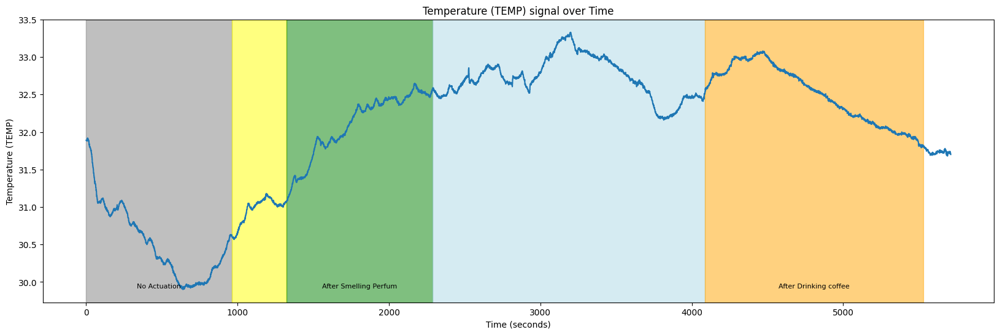

In [134]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [135]:
left_ACC_df=pd.read_csv(file_paths['B3']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-31,3,58,1.624891e+09,32.0
1,-31,4,58,1.624891e+09,32.0
2,-30,4,58,1.624891e+09,32.0
3,-31,4,58,1.624891e+09,32.0
4,-31,3,58,1.624891e+09,32.0
...,...,...,...,...,...
182545,38,7,50,1.624891e+09,32.0
182546,39,8,50,1.624891e+09,32.0
182547,39,8,50,1.624891e+09,32.0
182548,39,7,50,1.624891e+09,32.0


In [136]:
right_ACC_df=pd.read_csv(file_paths['B3']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-29,-2,56,1.624891e+09,32.0
1,-29,-2,56,1.624891e+09,32.0
2,-29,-2,56,1.624891e+09,32.0
3,-29,-2,56,1.624891e+09,32.0
4,-29,-3,56,1.624891e+09,32.0
...,...,...,...,...,...
182545,-3,18,61,1.624891e+09,32.0
182546,-3,18,61,1.624891e+09,32.0
182547,-3,19,61,1.624891e+09,32.0
182548,-3,17,61,1.624891e+09,32.0


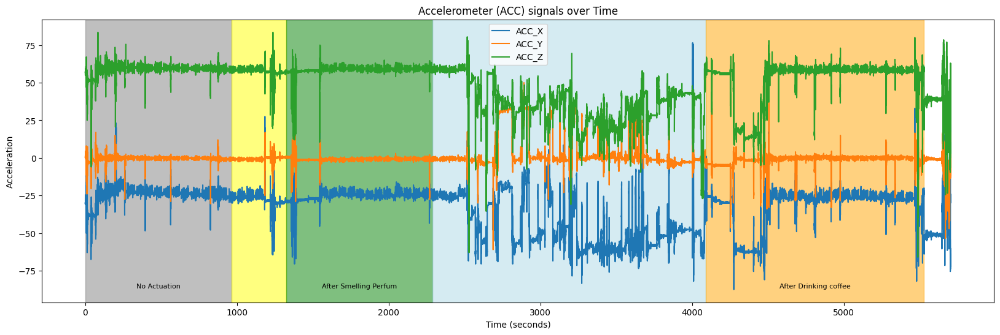

In [137]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [62]:
eeg_df=pd.read_csv(file_paths['B3']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.624891e+09,20.996,24.902,17.578,-95.215,27.832
1,1.624891e+09,24.902,34.668,16.602,-91.309,26.855
2,1.624891e+09,17.578,41.016,18.066,-96.191,52.734
3,1.624891e+09,3.418,39.062,20.020,-92.285,46.387
4,1.624891e+09,12.207,35.645,20.508,-91.309,54.688
...,...,...,...,...,...,...
1473902,1.624896e+09,-21.973,8.301,47.363,-5.371,-15.137
1473903,1.624896e+09,-16.602,11.719,51.270,-12.207,12.695
1473904,1.624896e+09,-20.020,15.137,50.781,-8.301,77.148
1473905,1.624896e+09,3.418,15.625,47.852,10.254,50.781


Text(0.5, 0, 'time (s)')

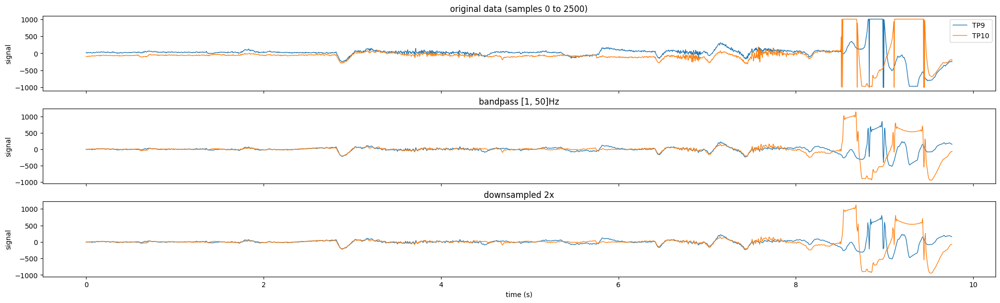

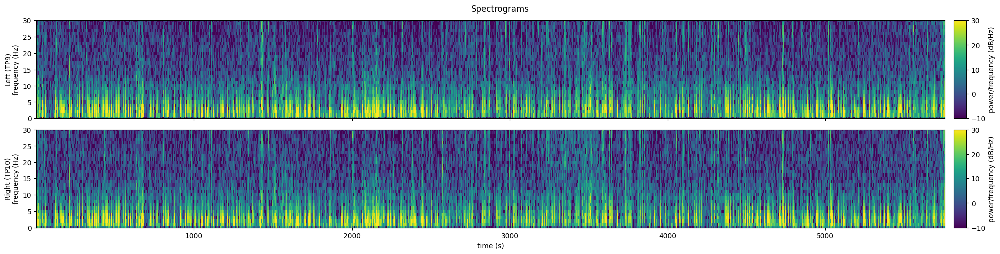

In [63]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


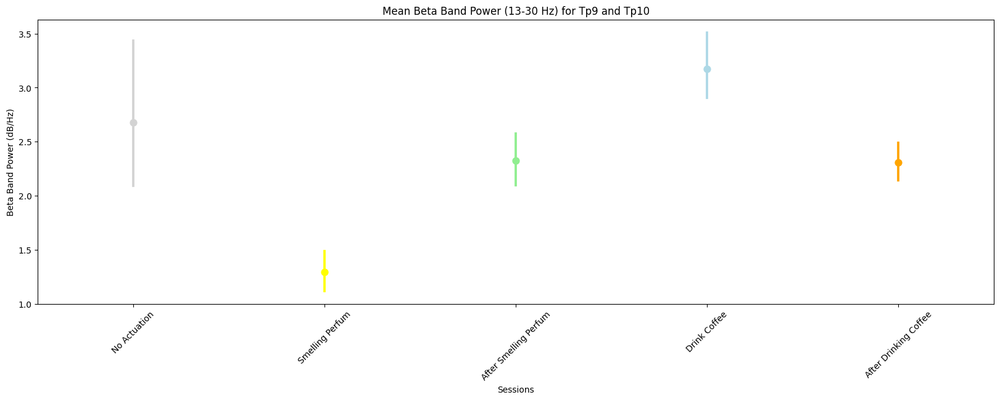

In [64]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


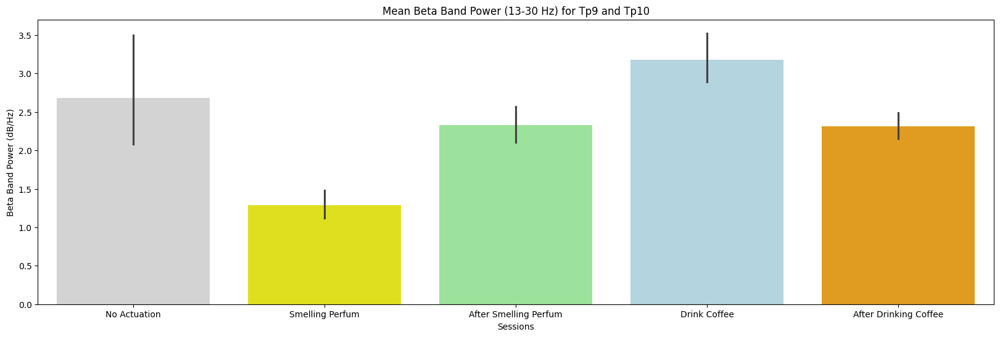

In [65]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()

# Patient B4


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [140]:
n_backr_df = pd.read_csv(file_paths['B4']['n_back_responses'])

In [141]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [142]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [143]:
df_length=len(n_backr_df)

In [144]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1625193310,6,2,Chronos,-999999,29,1377520,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [145]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [146]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [147]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [148]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [149]:
len(stimulus)

40

In [150]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [151]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [152]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,-2.0,38778.0,506.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,2.0,20.0,40804.0,506.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,2.0,6.0,42816.0,507.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,2.0,6.0,44829.0,506.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,1.0,7.0,46842.0,506.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [153]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [154]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [155]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,2.0,6.0,5496479.0,507.0,NaN,0.0,0.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,6.0,5498492.0,506.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,3.0,6.0,5500504.0,507.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,1.0,6.0,5502517.0,507.0,NaN,0.0,0.0,CoffeeSession


### Fixation

In [156]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [157]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [158]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,0.0,3.0,Chronos,2.0,6.0,39284.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,3.0,Chronos,2.0,6.0,41310.0,0.0,3.0,991.0,42301.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,3.0,Chronos,1.0,7.0,43323.0,0.0,3.0,746.0,44069.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,4.0,Chronos,2.0,6.0,45335.0,0.0,4.0,459.0,45794.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,4.0,Chronos,2.0,6.0,47348.0,0.0,4.0,445.0,47793.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,2.0,7.0,5496986.0,0.0,3.0,319.0,5497305.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,2.0,6.0,5498998.0,0.0,3.0,246.0,5499244.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,5501011.0,0.0,3.0,259.0,5501270.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,5503024.0,0.0,3.0,271.0,5503295.0


#### Fixation table 100

In [159]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,6.0,39284.0,0.0,NaN,0.0,0.0,PracticeSession
1,1.0,3.0,Chronos,2.0,6.0,41310.0,0.0,3.0,991.0,42301.0,PracticeSession
2,1.0,3.0,Chronos,1.0,7.0,43323.0,0.0,3.0,746.0,44069.0,PracticeSession
3,1.0,4.0,Chronos,2.0,6.0,45335.0,0.0,4.0,459.0,45794.0,PracticeSession
4,1.0,4.0,Chronos,2.0,6.0,47348.0,0.0,4.0,445.0,47793.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [160]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [161]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [162]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,2.0,7.0,5496986.0,0.0,3.0,319.0,5497305.0,CoffeeSession
1099,1.0,3.0,Chronos,2.0,6.0,5498998.0,0.0,3.0,246.0,5499244.0,CoffeeSession
1100,1.0,3.0,Chronos,1.0,7.0,5501011.0,0.0,3.0,259.0,5501270.0,CoffeeSession
1101,1.0,3.0,Chronos,1.0,7.0,5503024.0,0.0,3.0,271.0,5503295.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [163]:
left_eda_df=pd.read_csv(file_paths['B4']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.625193e+09,4.0
1,0.260126,1.625193e+09,4.0
2,0.320352,1.625193e+09,4.0
3,0.321633,1.625193e+09,4.0
4,0.322915,1.625193e+09,4.0
...,...,...,...
23275,0.437227,1.625193e+09,4.0
23276,0.437227,1.625193e+09,4.0
23277,0.435946,1.625193e+09,4.0
23278,0.437227,1.625193e+09,4.0


In [164]:
right_eda_df=pd.read_csv(file_paths['B4']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.625193e+09,4.0
1,0.184434,1.625193e+09,4.0
2,0.249754,1.625193e+09,4.0
3,0.243350,1.625193e+09,4.0
4,0.244631,1.625193e+09,4.0
...,...,...,...
23275,0.353765,1.625193e+09,4.0
23276,0.355046,1.625193e+09,4.0
23277,0.335834,1.625193e+09,4.0
23278,0.325588,1.625193e+09,4.0


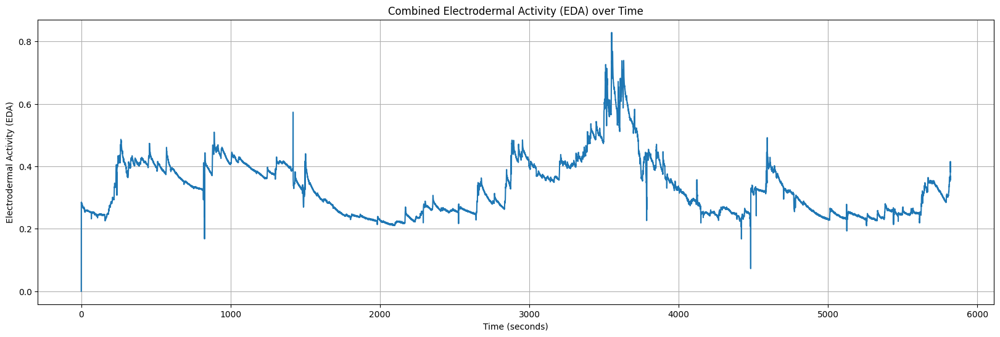

In [165]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

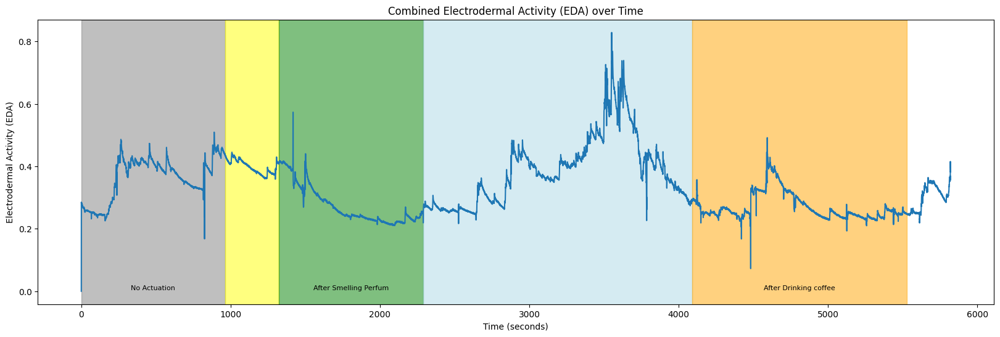

In [166]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [167]:
left_hr_df=pd.read_csv(file_paths['B4']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,83.00,1.625193e+09,1.0
1,69.00,1.625193e+09,1.0
2,104.00,1.625193e+09,1.0
3,116.75,1.625193e+09,1.0
4,109.20,1.625193e+09,1.0
...,...,...,...
5807,74.13,1.625193e+09,1.0
5808,74.22,1.625193e+09,1.0
5809,74.27,1.625193e+09,1.0
5810,74.42,1.625193e+09,1.0


In [168]:
right_hr_df=pd.read_csv(file_paths['B4']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,70.00,1.625193e+09,1.0
1,84.00,1.625193e+09,1.0
2,92.33,1.625193e+09,1.0
3,93.50,1.625193e+09,1.0
4,85.80,1.625193e+09,1.0
...,...,...,...
5807,78.37,1.625193e+09,1.0
5808,78.63,1.625193e+09,1.0
5809,78.88,1.625193e+09,1.0
5810,79.17,1.625193e+09,1.0


In [169]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.625193e+09,4.0
1,0.260126,1.625193e+09,4.0
2,0.320352,1.625193e+09,4.0
3,0.321633,1.625193e+09,4.0
4,0.322915,1.625193e+09,4.0
...,...,...,...
23275,0.437227,1.625193e+09,4.0
23276,0.437227,1.625193e+09,4.0
23277,0.435946,1.625193e+09,4.0
23278,0.437227,1.625193e+09,4.0


In [170]:
main_df.index

RangeIndex(start=0, stop=23280, step=1)

In [171]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5817.5, 5817.75,  5818.0, 5818.25,  5818.5, 5818.75,  5819.0, 5819.25,
        5819.5, 5819.75],
      dtype='float64', length=23280)

In [172]:
hr_main_df

,HR,start_time_unix,sampling_rate
0,101.00,1.624891e+09,1.0
1,108.00,1.624891e+09,1.0
2,129.67,1.624891e+09,1.0
3,111.75,1.624891e+09,1.0
4,101.00,1.624891e+09,1.0
...,...,...,...
5690,88.00,1.624891e+09,1.0
5691,87.72,1.624891e+09,1.0
5692,87.45,1.624891e+09,1.0
5693,87.18,1.624891e+09,1.0


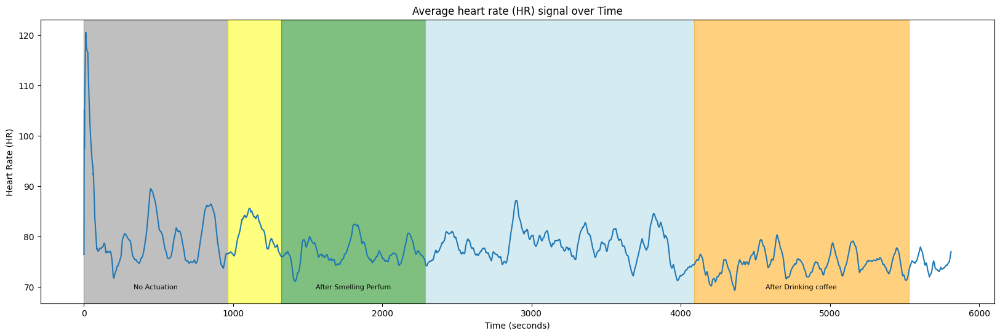

In [173]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [174]:
left_bvp_df=pd.read_csv(file_paths['B4']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.625193e+09,64.0
1,-0.00,1.625193e+09,64.0
2,-0.00,1.625193e+09,64.0
3,-0.00,1.625193e+09,64.0
4,-0.00,1.625193e+09,64.0
...,...,...,...
372719,-136.23,1.625193e+09,64.0
372720,-136.43,1.625193e+09,64.0
372721,-140.02,1.625193e+09,64.0
372722,-145.25,1.625193e+09,64.0


In [175]:
right_bvp_df=pd.read_csv(file_paths['B4']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.625193e+09,64.0
1,-0.00,1.625193e+09,64.0
2,-0.00,1.625193e+09,64.0
3,-0.00,1.625193e+09,64.0
4,-0.00,1.625193e+09,64.0
...,...,...,...
372708,-57.80,1.625193e+09,64.0
372709,-61.11,1.625193e+09,64.0
372710,-68.00,1.625193e+09,64.0
372711,-78.80,1.625193e+09,64.0


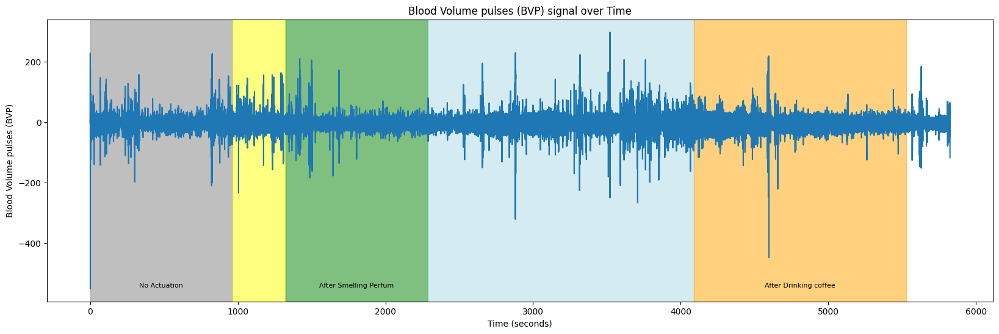

In [176]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [177]:
left_temp_df=pd.read_csv(file_paths['B4']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,31.65,1.625193e+09,4.0
1,31.65,1.625193e+09,4.0
2,31.65,1.625193e+09,4.0
3,31.65,1.625193e+09,4.0
4,31.65,1.625193e+09,4.0
...,...,...,...
23307,32.13,1.625193e+09,4.0
23308,32.13,1.625193e+09,4.0
23309,32.13,1.625193e+09,4.0
23310,32.13,1.625193e+09,4.0


In [178]:
right_temp_df=pd.read_csv(file_paths['B4']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,32.27,1.625193e+09,4.0
1,32.27,1.625193e+09,4.0
2,32.27,1.625193e+09,4.0
3,32.27,1.625193e+09,4.0
4,32.27,1.625193e+09,4.0
...,...,...,...
23307,31.59,1.625193e+09,4.0
23308,31.59,1.625193e+09,4.0
23309,31.59,1.625193e+09,4.0
23310,31.59,1.625193e+09,4.0


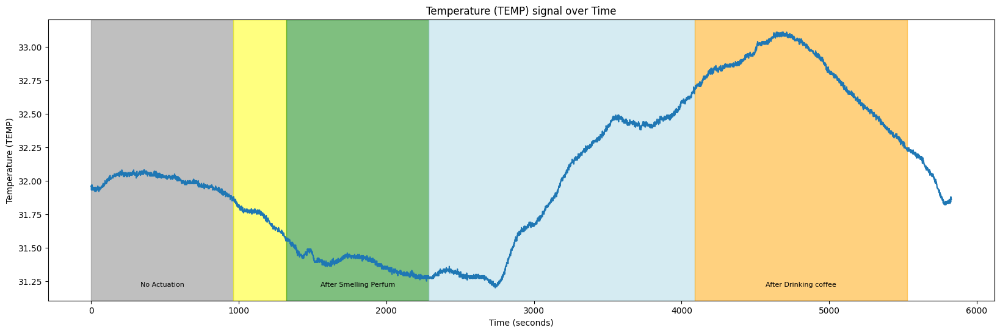

In [179]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [180]:
left_ACC_df=pd.read_csv(file_paths['B4']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-56,-4,35,1.625193e+09,32.0
1,-56,-4,35,1.625193e+09,32.0
2,-56,-4,35,1.625193e+09,32.0
3,-56,-3,35,1.625193e+09,32.0
4,-57,-4,35,1.625193e+09,32.0
...,...,...,...,...,...
186277,34,-11,54,1.625193e+09,32.0
186278,34,-11,53,1.625193e+09,32.0
186279,34,-11,53,1.625193e+09,32.0
186280,35,-12,53,1.625193e+09,32.0


In [181]:
right_ACC_df=pd.read_csv(file_paths['B4']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-43,2,46,1.625193e+09,32.0
1,-43,2,46,1.625193e+09,32.0
2,-43,2,47,1.625193e+09,32.0
3,-43,2,46,1.625193e+09,32.0
4,-43,2,46,1.625193e+09,32.0
...,...,...,...,...,...
186277,15,34,50,1.625193e+09,32.0
186278,15,35,51,1.625193e+09,32.0
186279,15,34,50,1.625193e+09,32.0
186280,15,34,51,1.625193e+09,32.0


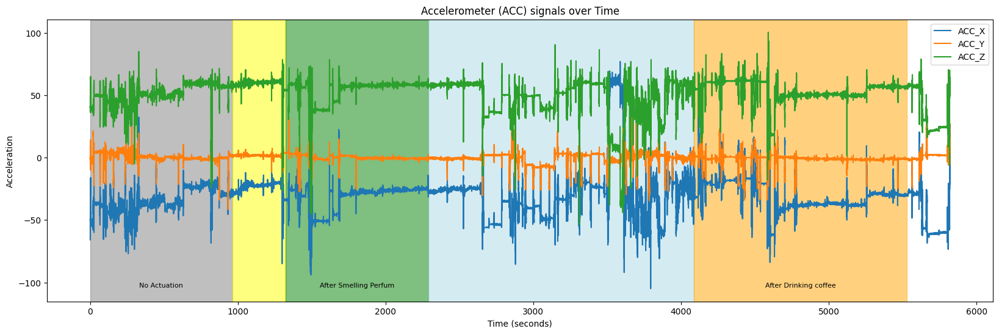

In [182]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [66]:
eeg_df=pd.read_csv(file_paths['B4']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.625193e+09,17.090,-201.172,24.902,33.203,24.902
1,1.625193e+09,17.578,-185.547,20.996,48.828,43.945
2,1.625193e+09,31.250,-199.707,28.809,41.504,37.598
3,1.625193e+09,17.090,-207.031,53.711,21.484,7.812
4,1.625193e+09,11.230,-192.383,45.410,20.996,-22.461
...,...,...,...,...,...,...
1471471,1.625199e+09,52.246,35.156,32.715,54.688,-7.812
1471472,1.625199e+09,43.945,33.203,26.367,35.156,-21.484
1471473,1.625199e+09,43.945,33.203,27.832,40.039,20.508
1471474,1.625199e+09,45.410,32.715,28.809,41.992,56.641


Text(0.5, 0, 'time (s)')

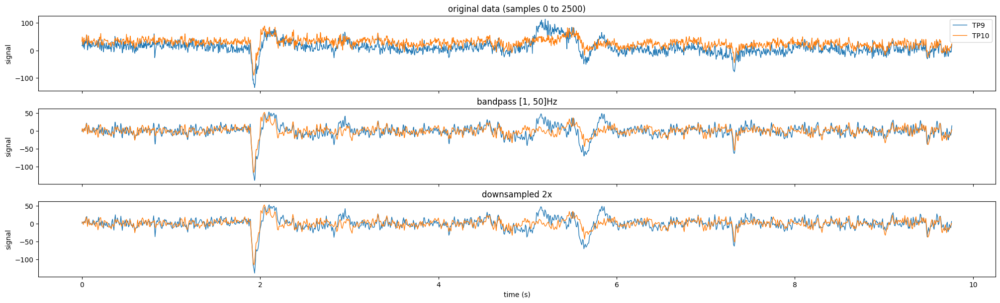

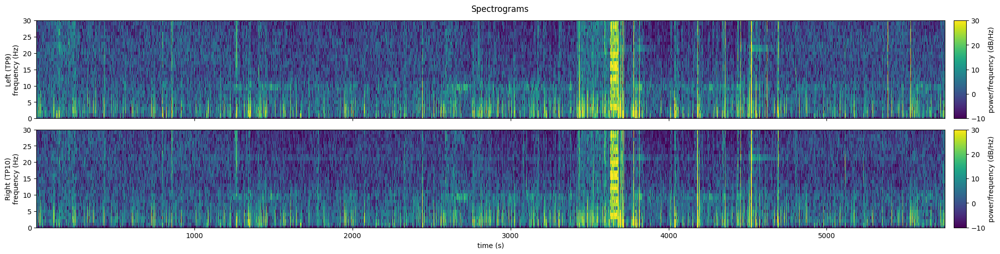

In [67]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


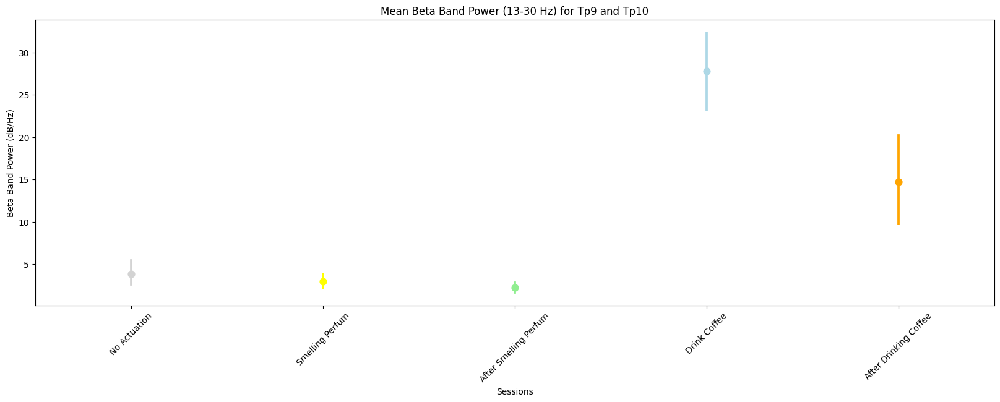

In [68]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


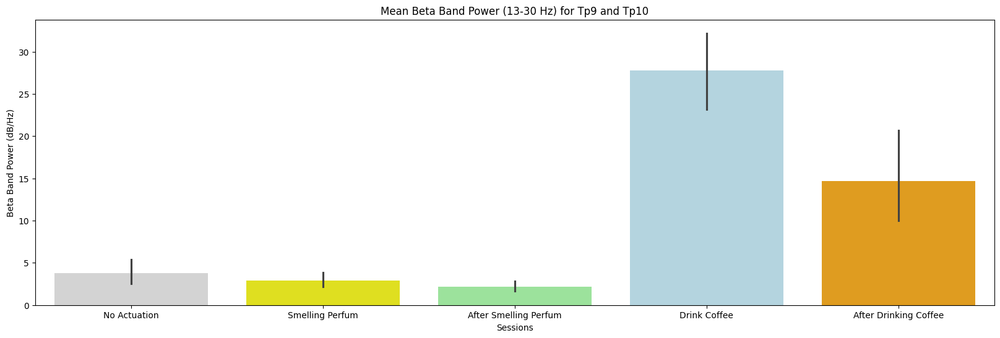

In [69]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()

# Patient B5


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [185]:
n_backr_df = pd.read_csv(file_paths['B5']['n_back_responses'])

In [186]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [187]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [188]:
df_length=len(n_backr_df)

In [189]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1624845162,7,2,Chronos,-999999,15,1578085,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [190]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [191]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [192]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [193]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [194]:
len(stimulus)

40

In [195]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [196]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [197]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,-2.0,267639.0,507.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,2.0,19.0,269665.0,507.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,1.0,19.0,271691.0,507.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,1.0,19.0,273717.0,506.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,1.0,7.0,275730.0,506.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [198]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [199]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [200]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,1.0,7.0,5720623.0,0.0,3.0,429.0,5721052.0,CoffeeSession
1099,1.0,3.0,Chronos,1.0,20.0,5722582.0,0.0,3.0,461.0,5723043.0,CoffeeSession
1100,1.0,3.0,Chronos,1.0,20.0,5724568.0,0.0,3.0,411.0,5724979.0,CoffeeSession
1101,1.0,3.0,Chronos,1.0,20.0,5726514.0,0.0,3.0,492.0,5727006.0,CoffeeSession


### Fixation

In [201]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [202]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [203]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,0.0,3.0,Chronos,1.0,7.0,268146.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,3.0,Chronos,1.0,7.0,270172.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,3.0,Chronos,1.0,7.0,272198.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,4.0,Chronos,2.0,6.0,274223.0,0.0,4.0,1368.0,275591.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,4.0,Chronos,1.0,6.0,276236.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,10.0,5721062.0,0.0,NaN,0.0,0.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,5.0,5723048.0,0.0,NaN,0.0,0.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,15.0,5724994.0,0.0,NaN,0.0,0.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,13.0,5727020.0,0.0,NaN,0.0,0.0


#### Fixation table 100

In [204]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,0.0,3.0,Chronos,1.0,7.0,268146.0,0.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,1.0,7.0,270172.0,0.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,1.0,7.0,272198.0,0.0,NaN,0.0,0.0,PracticeSession
3,1.0,4.0,Chronos,2.0,6.0,274223.0,0.0,4.0,1368.0,275591.0,PracticeSession
4,0.0,4.0,Chronos,1.0,6.0,276236.0,0.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [205]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [206]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [207]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,2.0,10.0,5721062.0,0.0,NaN,0.0,0.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,5.0,5723048.0,0.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,2.0,15.0,5724994.0,0.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,2.0,13.0,5727020.0,0.0,NaN,0.0,0.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [208]:
left_eda_df=pd.read_csv(file_paths['B5']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624845e+09,4.0
1,0.114004,1.624845e+09,4.0
2,0.160118,1.624845e+09,4.0
3,0.160118,1.624845e+09,4.0
4,0.160118,1.624845e+09,4.0
...,...,...,...
23767,0.315379,1.624845e+09,4.0
23768,0.314098,1.624845e+09,4.0
23769,0.316660,1.624845e+09,4.0
23770,0.333313,1.624845e+09,4.0


In [209]:
right_eda_df=pd.read_csv(file_paths['B5']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624845e+09,4.0
1,0.119157,1.624845e+09,4.0
2,0.165282,1.624845e+09,4.0
3,0.158875,1.624845e+09,4.0
4,0.156313,1.624845e+09,4.0
...,...,...,...
23767,0.351064,1.624845e+09,4.0
23768,0.371564,1.624845e+09,4.0
23769,0.371564,1.624845e+09,4.0
23770,0.380532,1.624845e+09,4.0


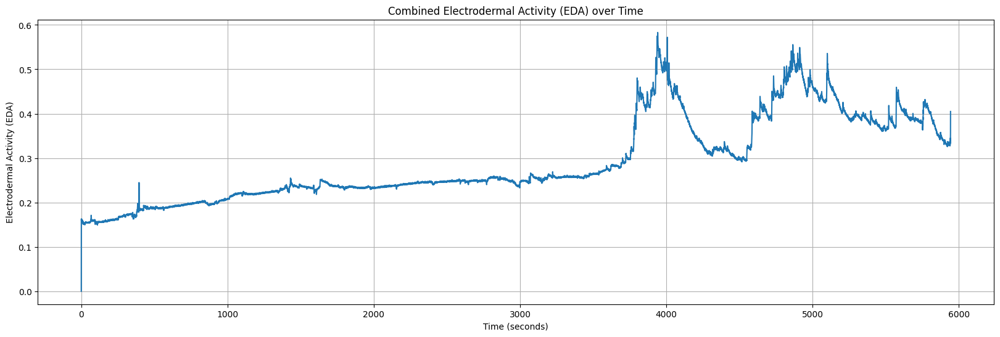

In [210]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

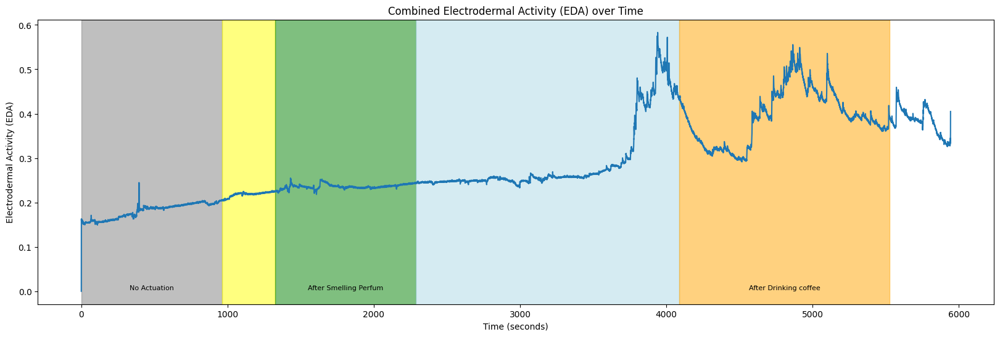

In [211]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [212]:
left_hr_df=pd.read_csv(file_paths['B5']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,70.00,1.624845e+09,1.0
1,59.00,1.624845e+09,1.0
2,63.00,1.624845e+09,1.0
3,64.00,1.624845e+09,1.0
4,67.60,1.624845e+09,1.0
...,...,...,...
5930,68.95,1.624845e+09,1.0
5931,69.00,1.624845e+09,1.0
5932,69.00,1.624845e+09,1.0
5933,68.97,1.624845e+09,1.0


In [213]:
right_hr_df=pd.read_csv(file_paths['B5']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,98.00,1.624845e+09,1.0
1,90.50,1.624845e+09,1.0
2,77.67,1.624845e+09,1.0
3,72.75,1.624845e+09,1.0
4,74.60,1.624845e+09,1.0
...,...,...,...
5930,70.47,1.624845e+09,1.0
5931,70.37,1.624845e+09,1.0
5932,70.20,1.624845e+09,1.0
5933,70.02,1.624845e+09,1.0


In [214]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.624845e+09,4.0
1,0.114004,1.624845e+09,4.0
2,0.160118,1.624845e+09,4.0
3,0.160118,1.624845e+09,4.0
4,0.160118,1.624845e+09,4.0
...,...,...,...
23767,0.315379,1.624845e+09,4.0
23768,0.314098,1.624845e+09,4.0
23769,0.316660,1.624845e+09,4.0
23770,0.333313,1.624845e+09,4.0


In [215]:
main_df.index

RangeIndex(start=0, stop=23772, step=1)

In [216]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5940.5, 5940.75,  5941.0, 5941.25,  5941.5, 5941.75,  5942.0, 5942.25,
        5942.5, 5942.75],
      dtype='float64', length=23772)

In [217]:
hr_main_df

,HR,start_time_unix,sampling_rate
0,83.00,1.625193e+09,1.0
1,69.00,1.625193e+09,1.0
2,104.00,1.625193e+09,1.0
3,116.75,1.625193e+09,1.0
4,109.20,1.625193e+09,1.0
...,...,...,...
5807,74.13,1.625193e+09,1.0
5808,74.22,1.625193e+09,1.0
5809,74.27,1.625193e+09,1.0
5810,74.42,1.625193e+09,1.0


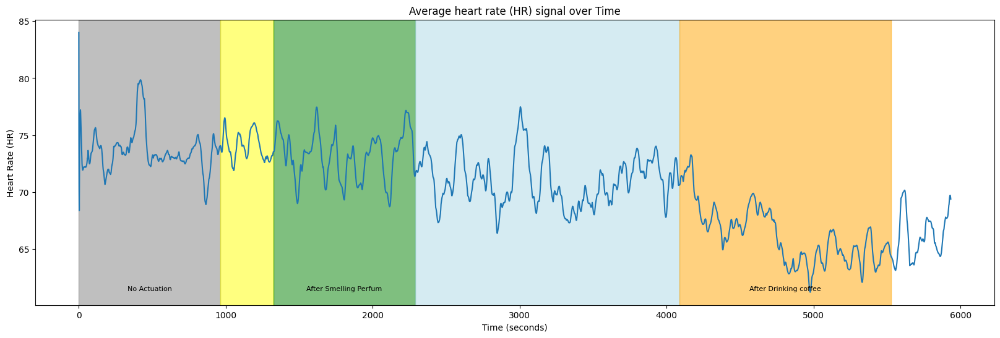

In [218]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [219]:
left_bvp_df=pd.read_csv(file_paths['B5']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624845e+09,64.0
1,-0.00,1.624845e+09,64.0
2,-0.00,1.624845e+09,64.0
3,-0.00,1.624845e+09,64.0
4,-0.00,1.624845e+09,64.0
...,...,...,...
380496,-137.94,1.624845e+09,64.0
380497,-134.15,1.624845e+09,64.0
380498,-128.88,1.624845e+09,64.0
380499,-122.53,1.624845e+09,64.0


In [220]:
right_bvp_df=pd.read_csv(file_paths['B5']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.624845e+09,64.0
1,-0.00,1.624845e+09,64.0
2,-0.00,1.624845e+09,64.0
3,-0.00,1.624845e+09,64.0
4,-0.00,1.624845e+09,64.0
...,...,...,...
380496,39.25,1.624845e+09,64.0
380497,44.79,1.624845e+09,64.0
380498,48.77,1.624845e+09,64.0
380499,51.63,1.624845e+09,64.0


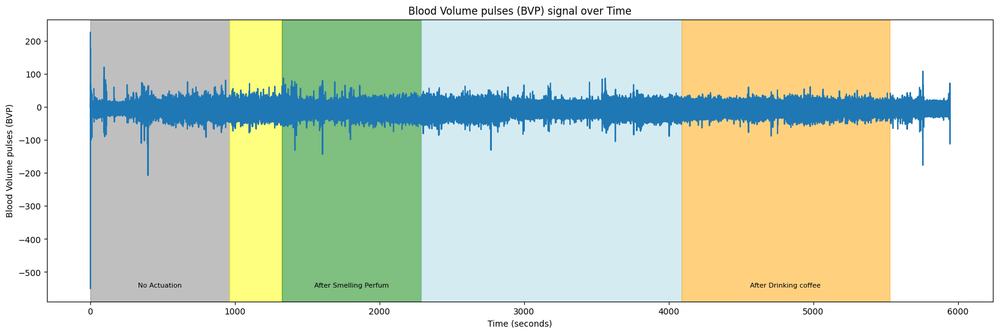

In [221]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [222]:
left_temp_df=pd.read_csv(file_paths['B5']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,32.09,1.624845e+09,4.0
1,32.09,1.624845e+09,4.0
2,32.09,1.624845e+09,4.0
3,32.09,1.624845e+09,4.0
4,32.09,1.624845e+09,4.0
...,...,...,...
23803,33.63,1.624845e+09,4.0
23804,33.65,1.624845e+09,4.0
23805,33.65,1.624845e+09,4.0
23806,33.65,1.624845e+09,4.0


In [223]:
right_temp_df=pd.read_csv(file_paths['B5']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,31.99,1.624845e+09,4.0
1,31.99,1.624845e+09,4.0
2,31.99,1.624845e+09,4.0
3,31.99,1.624845e+09,4.0
4,31.99,1.624845e+09,4.0
...,...,...,...
23803,34.31,1.624845e+09,4.0
23804,34.31,1.624845e+09,4.0
23805,34.31,1.624845e+09,4.0
23806,34.31,1.624845e+09,4.0


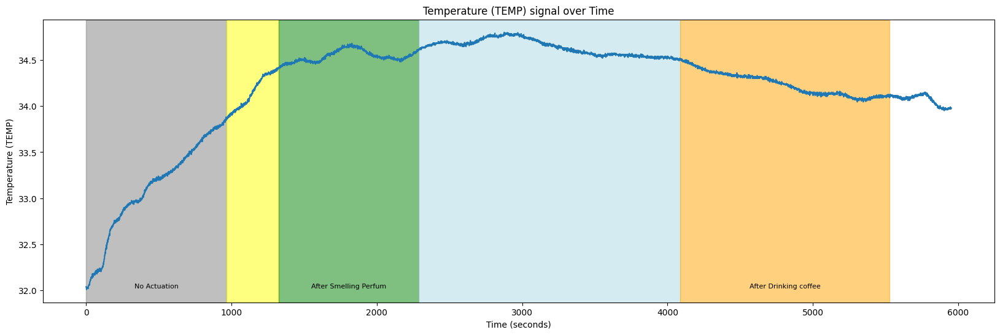

In [224]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [225]:
left_ACC_df=pd.read_csv(file_paths['B5']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-29,-9,59,1.624845e+09,32.0
1,-30,-8,55,1.624845e+09,32.0
2,-31,-8,54,1.624845e+09,32.0
3,-30,-9,53,1.624845e+09,32.0
4,-30,-10,52,1.624845e+09,32.0
...,...,...,...,...,...
190225,-8,-15,62,1.624845e+09,32.0
190226,-8,-16,60,1.624845e+09,32.0
190227,-7,-16,62,1.624845e+09,32.0
190228,-8,-15,61,1.624845e+09,32.0


In [226]:
right_ACC_df=pd.read_csv(file_paths['B5']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-35,22,47,1.624845e+09,32.0
1,-35,27,37,1.624845e+09,32.0
2,-40,27,40,1.624845e+09,32.0
3,-41,27,40,1.624845e+09,32.0
4,-28,31,40,1.624845e+09,32.0
...,...,...,...,...,...
190225,-43,44,26,1.624845e+09,32.0
190226,-42,43,25,1.624845e+09,32.0
190227,-41,43,26,1.624845e+09,32.0
190228,-42,44,26,1.624845e+09,32.0


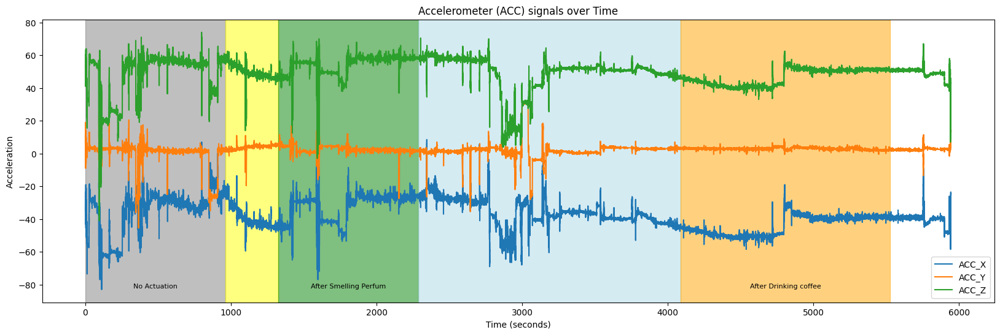

In [227]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [70]:
eeg_df=pd.read_csv(file_paths['B5']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.624845e+09,56.641,-966.797,60.547,15.625,11.719
1,1.624845e+09,87.891,-966.309,59.570,43.945,10.254
2,1.624845e+09,35.645,-966.797,53.223,68.359,35.645
3,1.624845e+09,12.207,-966.309,53.711,21.973,21.484
4,1.624845e+09,40.039,-966.309,42.480,-8.301,3.418
...,...,...,...,...,...,...
1527967,1.624851e+09,6.836,-315.918,34.180,44.434,-20.996
1527968,1.624851e+09,14.648,-199.219,30.273,31.250,21.484
1527969,1.624851e+09,29.297,98.633,25.879,20.020,100.098
1527970,1.624851e+09,25.879,-7.812,28.320,32.715,86.426


Text(0.5, 0, 'time (s)')

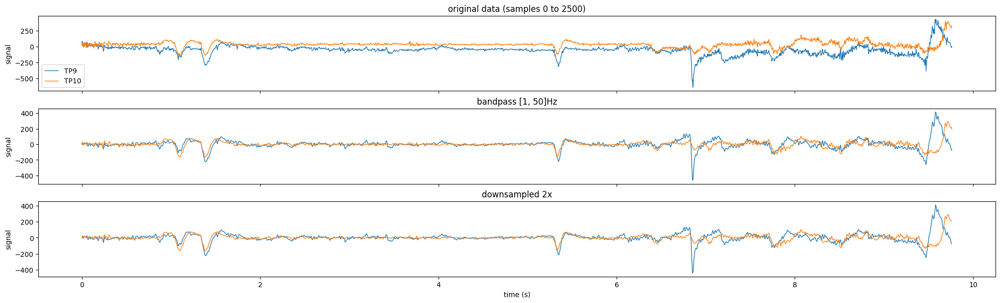

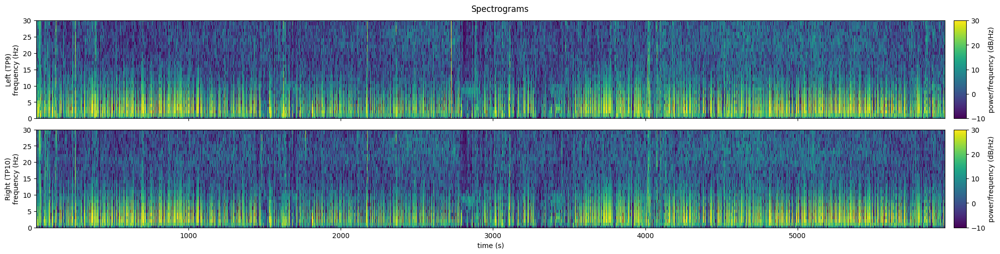

In [71]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


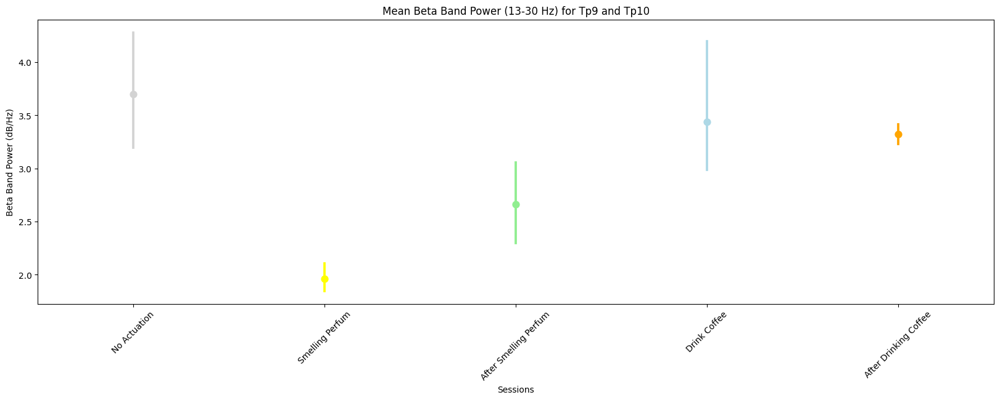

In [72]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


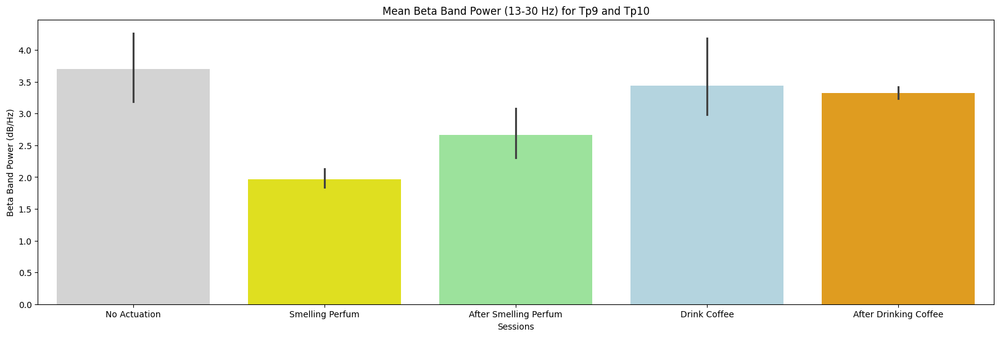

In [73]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()

# Patient B6


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [230]:
n_backr_df = pd.read_csv(file_paths['B6']['n_back_responses'])

In [231]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [232]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [233]:
df_length=len(n_backr_df)

In [234]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1625816611,8,2,Chronos,-999999,15,1320750,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [235]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [236]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [237]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [238]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [239]:
len(stimulus)

40

In [240]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [241]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [242]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,1.0,-1.0,61284.0,506.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,2.0,6.0,63296.0,507.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,1.0,6.0,65309.0,506.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,2.0,6.0,67321.0,507.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,1.0,6.0,69334.0,506.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [243]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [244]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [245]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,2.0,6.0,5419628.0,507.0,NaN,0.0,0.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,6.0,5421641.0,506.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,2.0,7.0,5423654.0,506.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,3.0,6.0,5425666.0,507.0,NaN,0.0,0.0,CoffeeSession


### Fixation

In [246]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [247]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [248]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,1.0,3.0,Chronos,1.0,6.0,61790.0,0.0,3.0,1493.0,63283.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,3.0,Chronos,1.0,7.0,63803.0,0.0,3.0,584.0,64387.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,3.0,Chronos,2.0,6.0,65815.0,0.0,3.0,385.0,66200.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,4.0,Chronos,1.0,7.0,67828.0,0.0,4.0,457.0,68285.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,4.0,Chronos,2.0,6.0,69840.0,0.0,4.0,512.0,70352.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,5420135.0,0.0,3.0,468.0,5420603.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,2.0,6.0,5422147.0,0.0,3.0,473.0,5422620.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,6.0,5424160.0,0.0,3.0,562.0,5424722.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,5426173.0,0.0,3.0,501.0,5426674.0


#### Fixation table 100

In [249]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,1.0,3.0,Chronos,1.0,6.0,61790.0,0.0,3.0,1493.0,63283.0,PracticeSession
1,1.0,3.0,Chronos,1.0,7.0,63803.0,0.0,3.0,584.0,64387.0,PracticeSession
2,1.0,3.0,Chronos,2.0,6.0,65815.0,0.0,3.0,385.0,66200.0,PracticeSession
3,1.0,4.0,Chronos,1.0,7.0,67828.0,0.0,4.0,457.0,68285.0,PracticeSession
4,1.0,4.0,Chronos,2.0,6.0,69840.0,0.0,4.0,512.0,70352.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [250]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [251]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [252]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,1.0,7.0,5420135.0,0.0,3.0,468.0,5420603.0,CoffeeSession
1099,1.0,3.0,Chronos,2.0,6.0,5422147.0,0.0,3.0,473.0,5422620.0,CoffeeSession
1100,1.0,3.0,Chronos,1.0,6.0,5424160.0,0.0,3.0,562.0,5424722.0,CoffeeSession
1101,1.0,3.0,Chronos,1.0,7.0,5426173.0,0.0,3.0,501.0,5426674.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [253]:
left_eda_df=pd.read_csv(file_paths['B6']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.625817e+09,4.0
1,0.672739,1.625817e+09,4.0
2,0.772956,1.625817e+09,4.0
3,0.652504,1.625817e+09,4.0
4,0.660192,1.625817e+09,4.0
...,...,...,...
22627,0.286021,1.625817e+09,4.0
22628,0.294991,1.625817e+09,4.0
22629,0.293709,1.625817e+09,4.0
22630,0.296272,1.625817e+09,4.0


In [254]:
right_eda_df=pd.read_csv(file_paths['B6']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.625817e+09,4.0
1,0.568671,1.625817e+09,4.0
2,0.695470,1.625817e+09,4.0
3,0.680367,1.625817e+09,4.0
4,0.513864,1.625817e+09,4.0
...,...,...,...
22627,0.307657,1.625817e+09,4.0
22628,0.312780,1.625817e+09,4.0
22629,0.317903,1.625817e+09,4.0
22630,0.323026,1.625817e+09,4.0


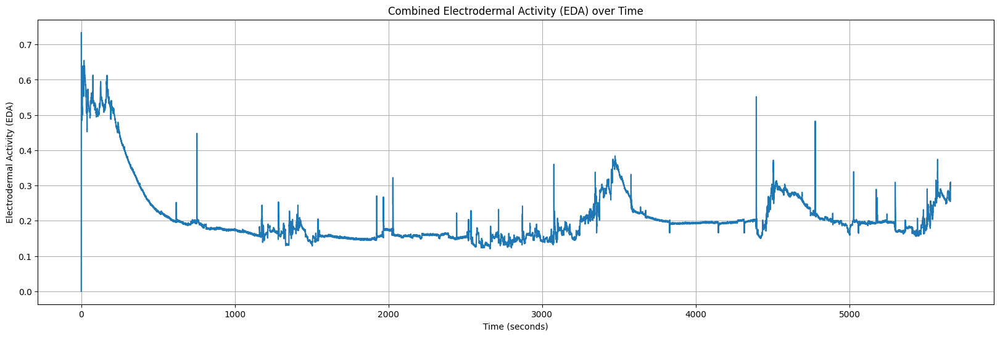

In [255]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

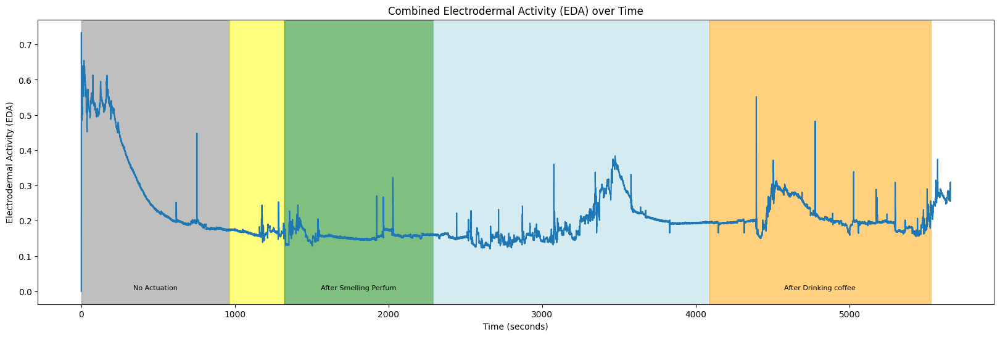

In [256]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [257]:
left_hr_df=pd.read_csv(file_paths['B6']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,67.00,1.625817e+09,1.0
1,73.50,1.625817e+09,1.0
2,73.67,1.625817e+09,1.0
3,76.00,1.625817e+09,1.0
4,73.00,1.625817e+09,1.0
...,...,...,...
5644,72.27,1.625817e+09,1.0
5645,72.30,1.625817e+09,1.0
5646,72.33,1.625817e+09,1.0
5647,72.37,1.625817e+09,1.0


In [258]:
right_hr_df=pd.read_csv(file_paths['B6']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,161.00,1.625817e+09,1.0
1,119.50,1.625817e+09,1.0
2,140.33,1.625817e+09,1.0
3,117.50,1.625817e+09,1.0
4,130.40,1.625817e+09,1.0
...,...,...,...
5644,72.53,1.625817e+09,1.0
5645,72.58,1.625817e+09,1.0
5646,72.62,1.625817e+09,1.0
5647,72.67,1.625817e+09,1.0


In [259]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.625817e+09,4.0
1,0.672739,1.625817e+09,4.0
2,0.772956,1.625817e+09,4.0
3,0.652504,1.625817e+09,4.0
4,0.660192,1.625817e+09,4.0
...,...,...,...
22627,0.286021,1.625817e+09,4.0
22628,0.294991,1.625817e+09,4.0
22629,0.293709,1.625817e+09,4.0
22630,0.296272,1.625817e+09,4.0


In [260]:
main_df.index

RangeIndex(start=0, stop=22632, step=1)

In [261]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5655.5, 5655.75,  5656.0, 5656.25,  5656.5, 5656.75,  5657.0, 5657.25,
        5657.5, 5657.75],
      dtype='float64', length=22632)

In [262]:
hr_main_df

,HR,start_time_unix,sampling_rate
0,70.00,1.624845e+09,1.0
1,59.00,1.624845e+09,1.0
2,63.00,1.624845e+09,1.0
3,64.00,1.624845e+09,1.0
4,67.60,1.624845e+09,1.0
...,...,...,...
5930,68.95,1.624845e+09,1.0
5931,69.00,1.624845e+09,1.0
5932,69.00,1.624845e+09,1.0
5933,68.97,1.624845e+09,1.0


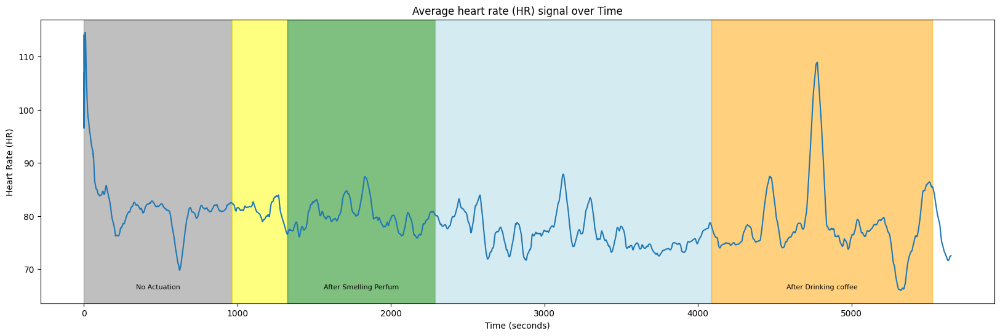

In [263]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [264]:
left_bvp_df=pd.read_csv(file_paths['B6']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.625817e+09,64.0
1,-0.00,1.625817e+09,64.0
2,-0.00,1.625817e+09,64.0
3,-0.00,1.625817e+09,64.0
4,-0.00,1.625817e+09,64.0
...,...,...,...
362126,-266.08,1.625817e+09,64.0
362127,-303.75,1.625817e+09,64.0
362128,-347.49,1.625817e+09,64.0
362129,-389.22,1.625817e+09,64.0


In [265]:
right_bvp_df=pd.read_csv(file_paths['B6']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.625817e+09,64.0
1,-0.00,1.625817e+09,64.0
2,-0.00,1.625817e+09,64.0
3,-0.00,1.625817e+09,64.0
4,-0.00,1.625817e+09,64.0
...,...,...,...
362115,-6.00,1.625817e+09,64.0
362116,-2.99,1.625817e+09,64.0
362117,-1.38,1.625817e+09,64.0
362118,-1.97,1.625817e+09,64.0


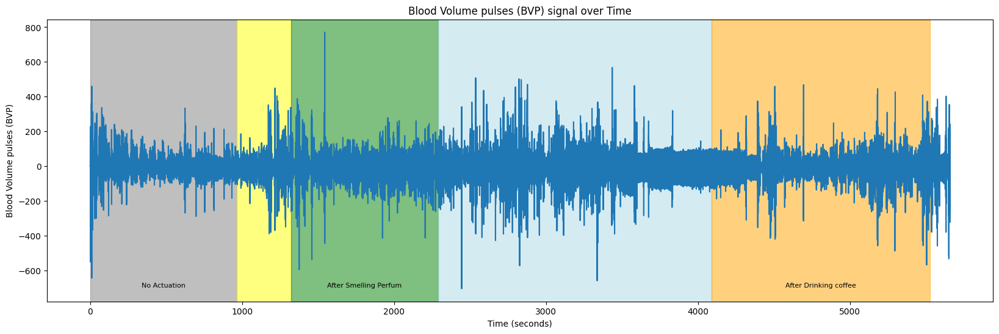

In [266]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [267]:
left_temp_df=pd.read_csv(file_paths['B6']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,33.09,1.625817e+09,4.0
1,33.09,1.625817e+09,4.0
2,33.09,1.625817e+09,4.0
3,33.09,1.625817e+09,4.0
4,33.09,1.625817e+09,4.0
...,...,...,...
22651,34.45,1.625817e+09,4.0
22652,34.43,1.625817e+09,4.0
22653,34.43,1.625817e+09,4.0
22654,34.43,1.625817e+09,4.0


In [268]:
right_temp_df=pd.read_csv(file_paths['B6']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,31.85,1.625817e+09,4.0
1,31.85,1.625817e+09,4.0
2,31.85,1.625817e+09,4.0
3,31.85,1.625817e+09,4.0
4,31.85,1.625817e+09,4.0
...,...,...,...
22651,34.07,1.625817e+09,4.0
22652,34.05,1.625817e+09,4.0
22653,34.05,1.625817e+09,4.0
22654,34.05,1.625817e+09,4.0


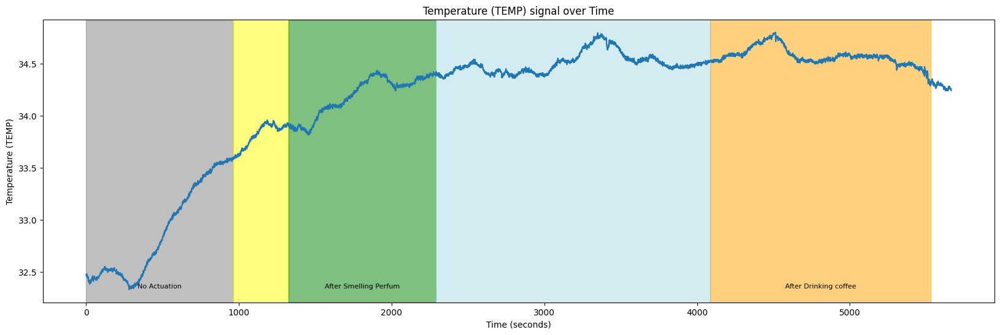

In [269]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [270]:
left_ACC_df=pd.read_csv(file_paths['B6']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-41,25,46,1.625817e+09,32.0
1,-40,27,45,1.625817e+09,32.0
2,-39,26,46,1.625817e+09,32.0
3,-43,25,45,1.625817e+09,32.0
4,-44,24,44,1.625817e+09,32.0
...,...,...,...,...,...
181093,-15,12,62,1.625817e+09,32.0
181094,-15,13,62,1.625817e+09,32.0
181095,-16,13,62,1.625817e+09,32.0
181096,-16,13,62,1.625817e+09,32.0


In [271]:
right_ACC_df=pd.read_csv(file_paths['B6']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-33,-19,49,1.625817e+09,32.0
1,-28,-17,52,1.625817e+09,32.0
2,-28,-14,58,1.625817e+09,32.0
3,-33,-18,50,1.625817e+09,32.0
4,-32,-16,52,1.625817e+09,32.0
...,...,...,...,...,...
181093,-10,-1,63,1.625817e+09,32.0
181094,-10,0,63,1.625817e+09,32.0
181095,-9,-1,62,1.625817e+09,32.0
181096,-10,-1,62,1.625817e+09,32.0


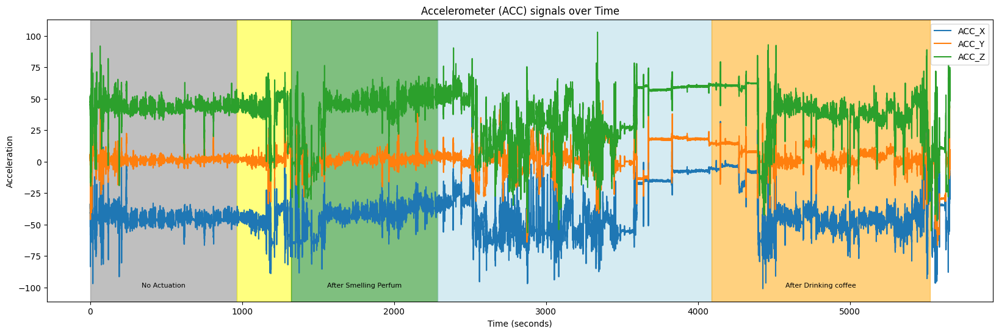

In [272]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [74]:
eeg_df=pd.read_csv(file_paths['B6']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.625817e+09,4.883,31.738,36.621,22.949,3.418
1,1.625817e+09,0.977,39.551,41.016,25.879,66.406
2,1.625817e+09,-5.371,28.809,40.527,28.809,74.219
3,1.625817e+09,2.441,19.531,44.922,24.902,16.113
4,1.625817e+09,7.324,33.203,52.246,35.156,55.664
...,...,...,...,...,...,...
1481743,1.625822e+09,999.512,-190.918,-223.145,-966.797,-90.332
1481744,1.625822e+09,999.512,-177.734,-173.340,-966.797,114.258
1481745,1.625822e+09,999.512,-193.848,-214.844,-966.797,-24.902
1481746,1.625822e+09,999.512,-215.820,-285.156,-966.797,-290.039


Text(0.5, 0, 'time (s)')

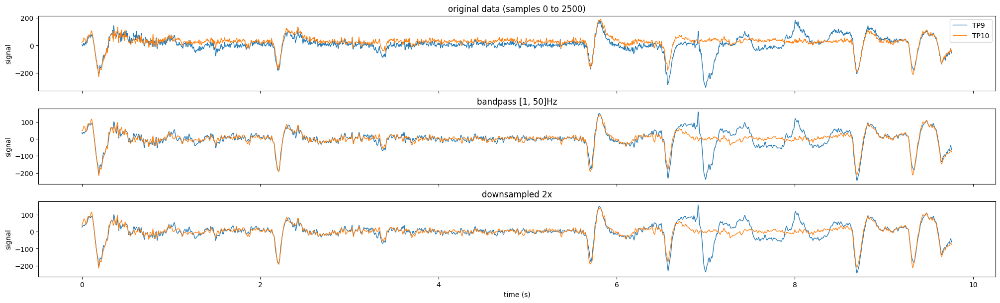

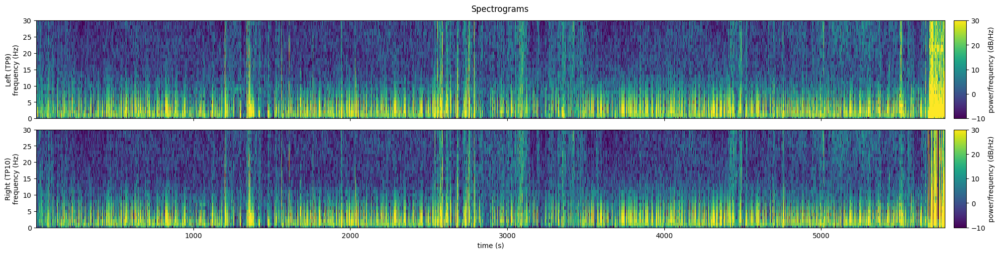

In [75]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


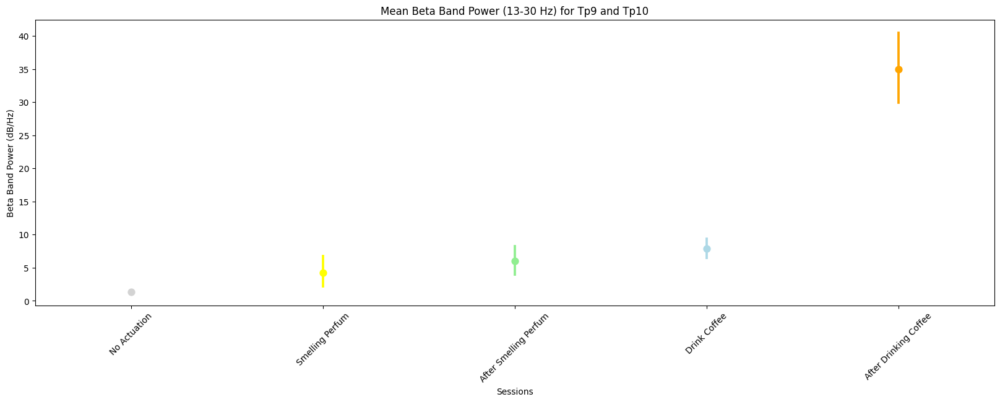

In [76]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


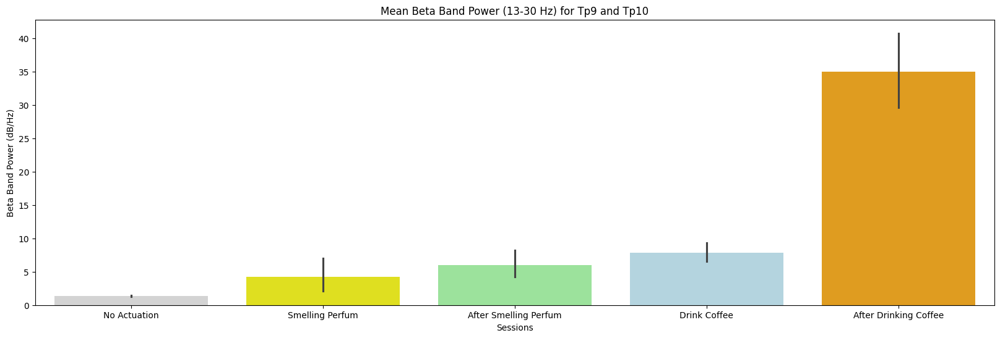

In [77]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()

# Patient B7


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [275]:
n_backr_df = pd.read_csv(file_paths['B7']['n_back_responses'])

In [276]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [277]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [278]:
df_length=len(n_backr_df)

In [279]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1629130750,12,2,Chronos,-999999,28,1319553,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [280]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [281]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [282]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [283]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [284]:
len(stimulus)

40

In [285]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [286]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [287]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,1.0,-2.0,48624.0,506.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,2.0,19.0,50649.0,507.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,2.0,19.0,52675.0,507.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,2.0,19.0,54701.0,507.0,NaN,0.0,0.0,PracticeSession
4,1.0,4.0,Chronos,2.0,19.0,56727.0,0.0,4.0,148.0,56875.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [288]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [289]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [290]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,2.0,6.0,5440571.0,507.0,NaN,0.0,0.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,19.0,5442597.0,507.0,NaN,0.0,0.0,CoffeeSession
1100,1.0,3.0,Chronos,1.0,6.0,5444610.0,0.0,3.0,407.0,5445017.0,CoffeeSession
1101,1.0,3.0,Chronos,3.0,19.0,5446542.0,0.0,3.0,392.0,5446934.0,CoffeeSession


### Fixation

In [291]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [292]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [293]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,0.0,3.0,Chronos,1.0,6.0,49130.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,3.0,Chronos,1.0,7.0,51156.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,3.0,Chronos,1.0,7.0,53182.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,4.0,Chronos,1.0,7.0,55208.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,4.0,Chronos,2.0,12.0,56887.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,7.0,5441078.0,0.0,NaN,0.0,0.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,5443104.0,0.0,3.0,58.0,5443162.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,6.0,5445023.0,0.0,NaN,0.0,0.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,8.0,5446942.0,0.0,NaN,0.0,0.0


#### Fixation table 100

In [294]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,0.0,3.0,Chronos,1.0,6.0,49130.0,0.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,1.0,7.0,51156.0,0.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,1.0,7.0,53182.0,0.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,1.0,7.0,55208.0,0.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,2.0,12.0,56887.0,0.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [295]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [296]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [297]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,2.0,7.0,5441078.0,0.0,NaN,0.0,0.0,CoffeeSession
1099,1.0,3.0,Chronos,1.0,7.0,5443104.0,0.0,3.0,58.0,5443162.0,CoffeeSession
1100,0.0,3.0,Chronos,2.0,6.0,5445023.0,0.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,2.0,8.0,5446942.0,0.0,NaN,0.0,0.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [298]:
left_eda_df=pd.read_csv(file_paths['B7']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.629131e+09,4.0
1,0.128102,1.629131e+09,4.0
2,0.195996,1.629131e+09,4.0
3,0.195996,1.629131e+09,4.0
4,0.195996,1.629131e+09,4.0
...,...,...,...
22711,0.514971,1.629131e+09,4.0
22712,0.518814,1.629131e+09,4.0
22713,0.513690,1.629131e+09,4.0
22714,0.514971,1.629131e+09,4.0


In [299]:
right_eda_df=pd.read_csv(file_paths['B7']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.629131e+09,4.0
1,0.114032,1.629131e+09,4.0
2,0.175532,1.629131e+09,4.0
3,0.167844,1.629131e+09,4.0
4,0.169126,1.629131e+09,4.0
...,...,...,...
22711,0.298532,1.629131e+09,4.0
22712,0.294688,1.629131e+09,4.0
22713,0.295970,1.629131e+09,4.0
22714,0.294688,1.629131e+09,4.0


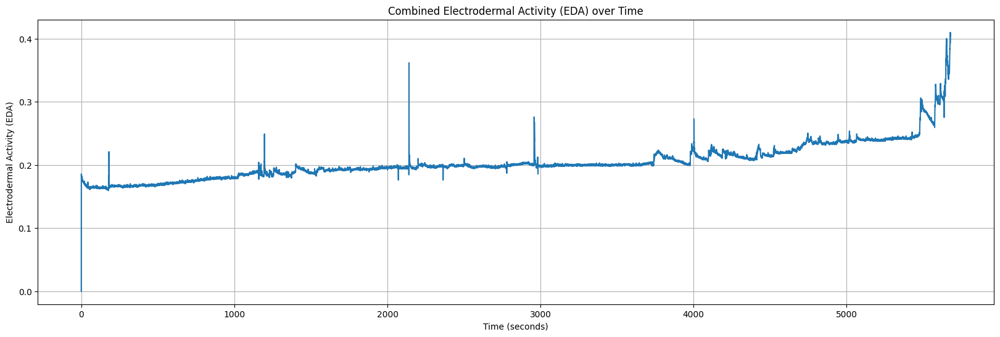

In [300]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

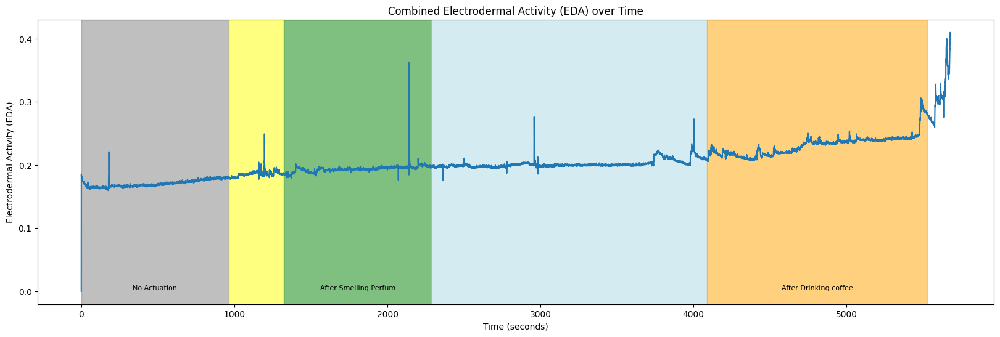

In [301]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [302]:
left_hr_df=pd.read_csv(file_paths['B7']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,49.00,1.629131e+09,1.0
1,79.00,1.629131e+09,1.0
2,80.33,1.629131e+09,1.0
3,77.00,1.629131e+09,1.0
4,73.80,1.629131e+09,1.0
...,...,...,...
5664,86.87,1.629131e+09,1.0
5665,87.13,1.629131e+09,1.0
5666,87.38,1.629131e+09,1.0
5667,87.67,1.629131e+09,1.0


In [303]:
right_hr_df=pd.read_csv(file_paths['B7']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,52.00,1.629131e+09,1.0
1,67.00,1.629131e+09,1.0
2,64.33,1.629131e+09,1.0
3,91.75,1.629131e+09,1.0
4,83.80,1.629131e+09,1.0
...,...,...,...
5664,90.88,1.629131e+09,1.0
5665,91.15,1.629131e+09,1.0
5666,91.43,1.629131e+09,1.0
5667,91.72,1.629131e+09,1.0


In [304]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.629131e+09,4.0
1,0.128102,1.629131e+09,4.0
2,0.195996,1.629131e+09,4.0
3,0.195996,1.629131e+09,4.0
4,0.195996,1.629131e+09,4.0
...,...,...,...
22711,0.514971,1.629131e+09,4.0
22712,0.518814,1.629131e+09,4.0
22713,0.513690,1.629131e+09,4.0
22714,0.514971,1.629131e+09,4.0


In [305]:
main_df.index

RangeIndex(start=0, stop=22716, step=1)

In [306]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5676.5, 5676.75,  5677.0, 5677.25,  5677.5, 5677.75,  5678.0, 5678.25,
        5678.5, 5678.75],
      dtype='float64', length=22716)

In [307]:
hr_main_df

,HR,start_time_unix,sampling_rate
0,67.00,1.625817e+09,1.0
1,73.50,1.625817e+09,1.0
2,73.67,1.625817e+09,1.0
3,76.00,1.625817e+09,1.0
4,73.00,1.625817e+09,1.0
...,...,...,...
5644,72.27,1.625817e+09,1.0
5645,72.30,1.625817e+09,1.0
5646,72.33,1.625817e+09,1.0
5647,72.37,1.625817e+09,1.0


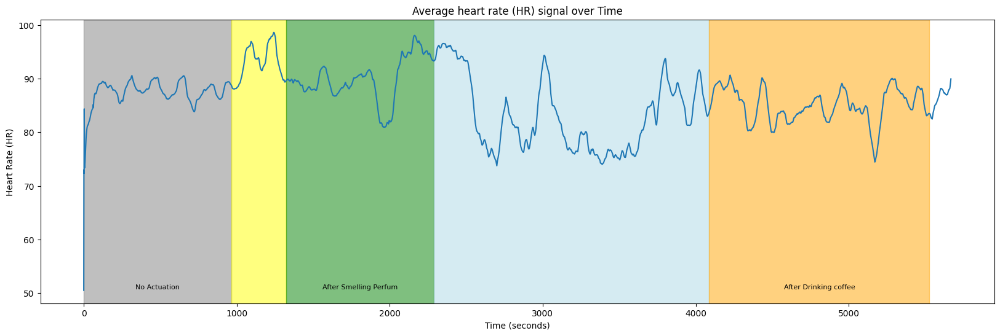

In [308]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [309]:
left_bvp_df=pd.read_csv(file_paths['B7']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.629131e+09,64.0
1,-0.00,1.629131e+09,64.0
2,-0.00,1.629131e+09,64.0
3,-0.00,1.629131e+09,64.0
4,-0.00,1.629131e+09,64.0
...,...,...,...
363556,-146.86,1.629131e+09,64.0
363557,-141.49,1.629131e+09,64.0
363558,-132.65,1.629131e+09,64.0
363559,-121.72,1.629131e+09,64.0


In [310]:
right_bvp_df=pd.read_csv(file_paths['B7']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.629131e+09,64.0
1,-0.00,1.629131e+09,64.0
2,-0.00,1.629131e+09,64.0
3,-0.00,1.629131e+09,64.0
4,-0.00,1.629131e+09,64.0
...,...,...,...
363545,-3.11,1.629131e+09,64.0
363546,-2.42,1.629131e+09,64.0
363547,2.62,1.629131e+09,64.0
363548,11.37,1.629131e+09,64.0


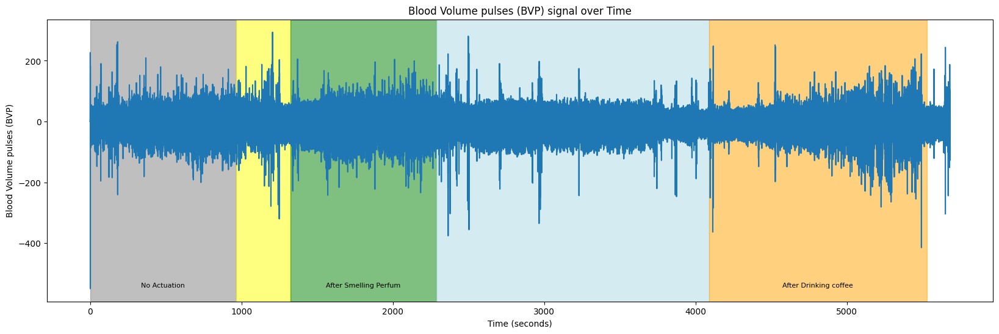

In [311]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [312]:
left_temp_df=pd.read_csv(file_paths['B7']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,31.57,1.629131e+09,4.0
1,31.57,1.629131e+09,4.0
2,31.57,1.629131e+09,4.0
3,31.57,1.629131e+09,4.0
4,31.57,1.629131e+09,4.0
...,...,...,...
22731,33.03,1.629131e+09,4.0
22732,33.00,1.629131e+09,4.0
22733,33.00,1.629131e+09,4.0
22734,33.00,1.629131e+09,4.0


In [313]:
right_temp_df=pd.read_csv(file_paths['B7']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,31.45,1.629131e+09,4.0
1,31.45,1.629131e+09,4.0
2,31.45,1.629131e+09,4.0
3,31.45,1.629131e+09,4.0
4,31.45,1.629131e+09,4.0
...,...,...,...
22731,32.50,1.629131e+09,4.0
22732,32.49,1.629131e+09,4.0
22733,32.49,1.629131e+09,4.0
22734,32.49,1.629131e+09,4.0


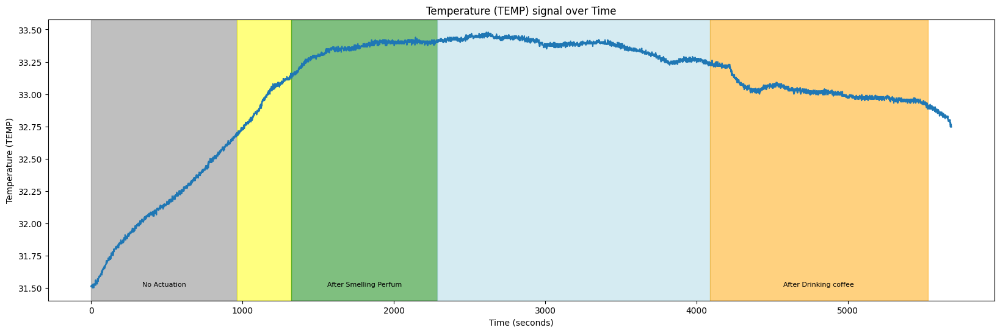

In [314]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [315]:
left_ACC_df=pd.read_csv(file_paths['B7']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-42,-2,49,1.629131e+09,32.0
1,-42,-2,49,1.629131e+09,32.0
2,-42,-2,49,1.629131e+09,32.0
3,-41,-2,49,1.629131e+09,32.0
4,-42,-2,49,1.629131e+09,32.0
...,...,...,...,...,...
181705,-5,2,63,1.629131e+09,32.0
181706,-5,2,63,1.629131e+09,32.0
181707,-5,2,63,1.629131e+09,32.0
181708,-5,2,63,1.629131e+09,32.0


In [316]:
right_ACC_df=pd.read_csv(file_paths['B7']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-50,7,43,1.629131e+09,32.0
1,-50,7,43,1.629131e+09,32.0
2,-50,7,43,1.629131e+09,32.0
3,-50,7,43,1.629131e+09,32.0
4,-50,7,43,1.629131e+09,32.0
...,...,...,...,...,...
181705,-27,7,58,1.629131e+09,32.0
181706,-28,7,58,1.629131e+09,32.0
181707,-27,7,59,1.629131e+09,32.0
181708,-27,8,58,1.629131e+09,32.0


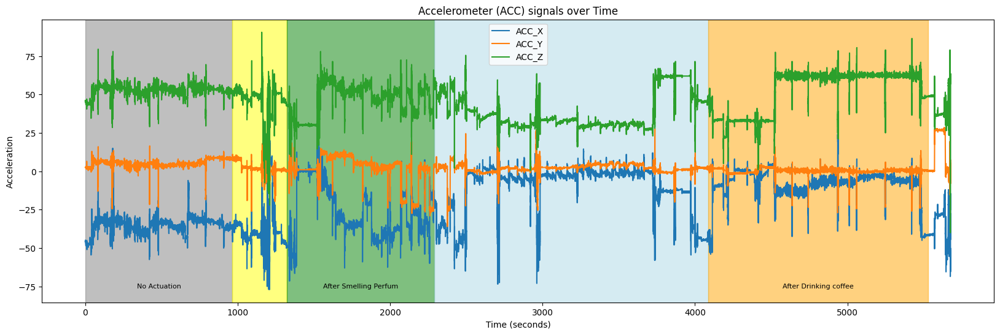

In [317]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [78]:
eeg_df=pd.read_csv(file_paths['B7']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.629131e+09,27.832,23.438,25.391,42.969,26.367
1,1.629131e+09,14.648,20.508,16.113,39.062,-7.324
2,1.629131e+09,1.465,3.906,0.000,26.367,-35.645
3,1.629131e+09,9.277,-1.953,4.395,25.879,-18.066
4,1.629131e+09,-4.883,9.766,13.672,21.484,47.852
...,...,...,...,...,...,...
1471332,1.629136e+09,8.301,-36.133,45.410,-10.254,66.406
1471333,1.629136e+09,-2.930,55.664,68.848,2.930,54.688
1471334,1.629136e+09,-30.273,9.277,41.016,-38.086,20.020
1471335,1.629136e+09,-9.766,-15.625,-35.645,-30.762,54.199


Text(0.5, 0, 'time (s)')

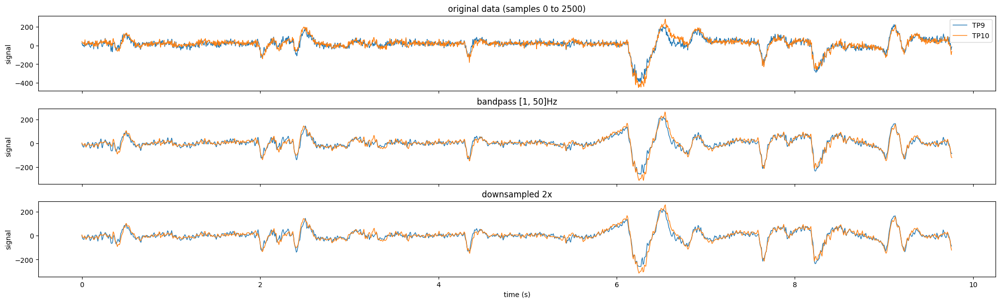

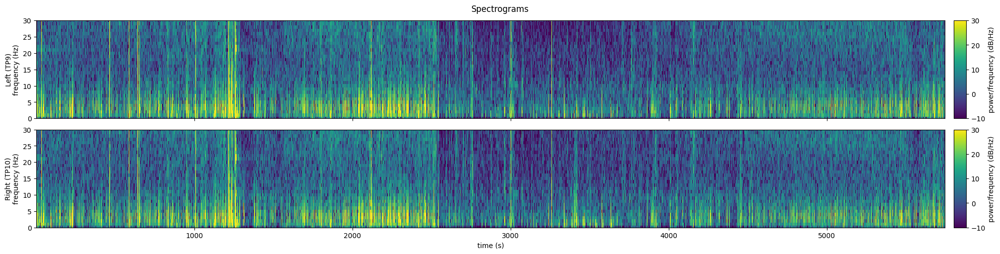

In [79]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


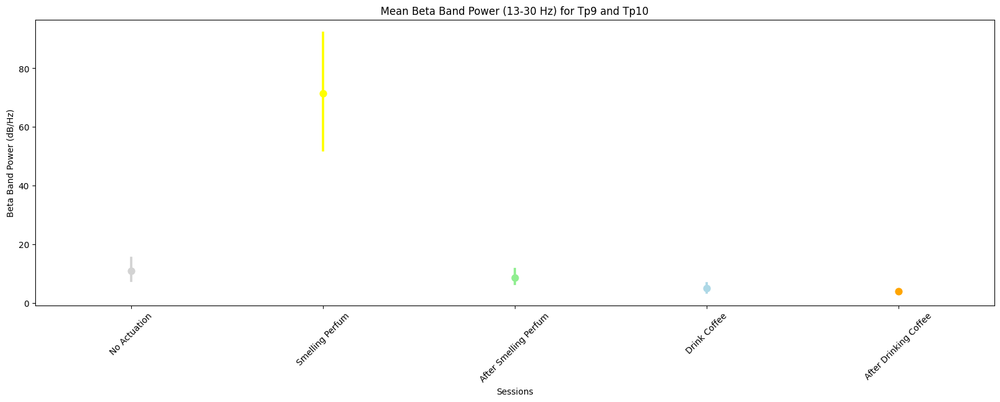

In [80]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


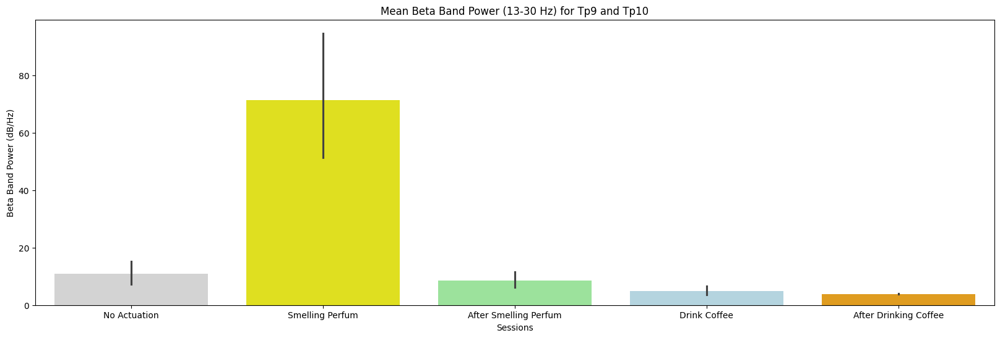

In [81]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()

# Patient B8


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [320]:
n_backr_df = pd.read_csv(file_paths['B8']['n_back_responses'])

In [321]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [322]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [323]:
df_length=len(n_backr_df)

In [324]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1630317387,13,2,Chronos,-999999,29,1327578,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [325]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [326]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [327]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [328]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [329]:
len(stimulus)

40

In [330]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [331]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [332]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,1.0,-2.0,58049.0,506.0,NaN,0.0,0.0,PracticeSession
1,1.0,3.0,Chronos,1.0,20.0,60075.0,0.0,3.0,106.0,60181.0,PracticeSession
2,0.0,3.0,Chronos,2.0,6.0,61701.0,506.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,2.0,6.0,63713.0,507.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,1.0,6.0,65726.0,506.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [333]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [334]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [335]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,1.0,6.0,5454883.0,506.0,NaN,0.0,0.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,6.0,5456895.0,507.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,1.0,6.0,5458908.0,506.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,2.0,6.0,5460920.0,507.0,NaN,0.0,0.0,CoffeeSession


### Fixation

In [336]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [337]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [338]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,0.0,3.0,Chronos,2.0,6.0,58555.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,3.0,Chronos,1.0,14.0,60195.0,0.0,3.0,946.0,61141.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,3.0,Chronos,2.0,6.0,62207.0,0.0,3.0,446.0,62653.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,4.0,Chronos,1.0,7.0,64220.0,0.0,4.0,394.0,64614.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,4.0,Chronos,2.0,6.0,66232.0,0.0,4.0,323.0,66555.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,2.0,6.0,5455389.0,0.0,3.0,548.0,5455937.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,5457402.0,0.0,3.0,428.0,5457830.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,2.0,6.0,5459414.0,0.0,3.0,356.0,5459770.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,5461427.0,0.0,3.0,416.0,5461843.0


#### Fixation table 100

In [339]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,6.0,58555.0,0.0,NaN,0.0,0.0,PracticeSession
1,1.0,3.0,Chronos,1.0,14.0,60195.0,0.0,3.0,946.0,61141.0,PracticeSession
2,1.0,3.0,Chronos,2.0,6.0,62207.0,0.0,3.0,446.0,62653.0,PracticeSession
3,1.0,4.0,Chronos,1.0,7.0,64220.0,0.0,4.0,394.0,64614.0,PracticeSession
4,1.0,4.0,Chronos,2.0,6.0,66232.0,0.0,4.0,323.0,66555.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [340]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [341]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [342]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,2.0,6.0,5455389.0,0.0,3.0,548.0,5455937.0,CoffeeSession
1099,1.0,3.0,Chronos,1.0,7.0,5457402.0,0.0,3.0,428.0,5457830.0,CoffeeSession
1100,1.0,3.0,Chronos,2.0,6.0,5459414.0,0.0,3.0,356.0,5459770.0,CoffeeSession
1101,1.0,3.0,Chronos,1.0,7.0,5461427.0,0.0,3.0,416.0,5461843.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [343]:
left_eda_df=pd.read_csv(file_paths['B8']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.630317e+09,4.0
1,0.813743,1.630317e+09,4.0
2,0.862707,1.630317e+09,4.0
3,0.658950,1.630317e+09,4.0
4,0.632039,1.630317e+09,4.0
...,...,...,...
23053,0.305260,1.630317e+09,4.0
23054,0.509017,1.630317e+09,4.0
23055,1.121567,1.630317e+09,4.0
23056,1.131888,1.630317e+09,4.0


In [344]:
right_eda_df=pd.read_csv(file_paths['B8']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.630317e+09,4.0
1,0.257439,1.630317e+09,4.0
2,0.339410,1.630317e+09,4.0
3,0.336848,1.630317e+09,4.0
4,0.336848,1.630317e+09,4.0
...,...,...,...
23053,0.388080,1.630317e+09,4.0
23054,0.577637,1.630317e+09,4.0
23055,0.659607,1.630317e+09,4.0
23056,0.662169,1.630317e+09,4.0


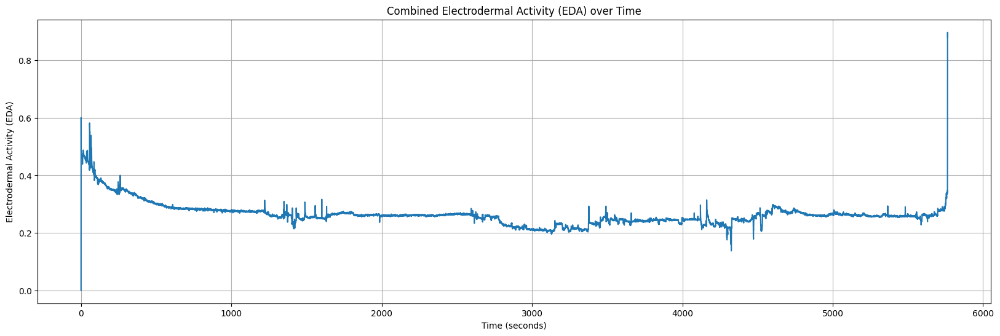

In [345]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

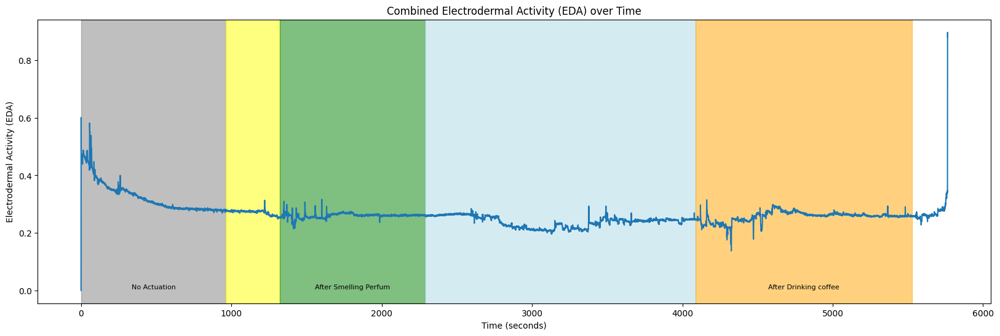

In [346]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [347]:
left_hr_df=pd.read_csv(file_paths['B8']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,72.00,1.630317e+09,1.0
1,70.00,1.630317e+09,1.0
2,74.33,1.630317e+09,1.0
3,69.75,1.630317e+09,1.0
4,69.00,1.630317e+09,1.0
...,...,...,...
5749,63.97,1.630317e+09,1.0
5750,63.70,1.630317e+09,1.0
5751,63.37,1.630317e+09,1.0
5752,62.97,1.630317e+09,1.0


In [348]:
right_hr_df=pd.read_csv(file_paths['B8']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,64.00,1.630317e+09,1.0
1,73.00,1.630317e+09,1.0
2,64.67,1.630317e+09,1.0
3,61.50,1.630317e+09,1.0
4,65.60,1.630317e+09,1.0
...,...,...,...
5749,67.95,1.630317e+09,1.0
5750,67.95,1.630317e+09,1.0
5751,67.92,1.630317e+09,1.0
5752,67.90,1.630317e+09,1.0


In [349]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.630317e+09,4.0
1,0.813743,1.630317e+09,4.0
2,0.862707,1.630317e+09,4.0
3,0.658950,1.630317e+09,4.0
4,0.632039,1.630317e+09,4.0
...,...,...,...
23053,0.305260,1.630317e+09,4.0
23054,0.509017,1.630317e+09,4.0
23055,1.121567,1.630317e+09,4.0
23056,1.131888,1.630317e+09,4.0


In [350]:
main_df.index

RangeIndex(start=0, stop=23058, step=1)

In [351]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5762.0, 5762.25,  5762.5, 5762.75,  5763.0, 5763.25,  5763.5, 5763.75,
        5764.0, 5764.25],
      dtype='float64', length=23058)

In [352]:
hr_main_df

,HR,start_time_unix,sampling_rate
0,49.00,1.629131e+09,1.0
1,79.00,1.629131e+09,1.0
2,80.33,1.629131e+09,1.0
3,77.00,1.629131e+09,1.0
4,73.80,1.629131e+09,1.0
...,...,...,...
5664,86.87,1.629131e+09,1.0
5665,87.13,1.629131e+09,1.0
5666,87.38,1.629131e+09,1.0
5667,87.67,1.629131e+09,1.0


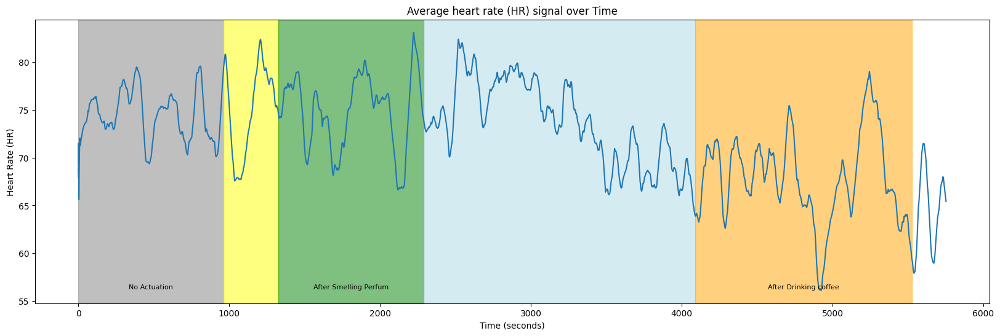

In [353]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [354]:
left_bvp_df=pd.read_csv(file_paths['B8']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.630317e+09,64.0
1,-0.00,1.630317e+09,64.0
2,-0.00,1.630317e+09,64.0
3,-0.00,1.630317e+09,64.0
4,-0.00,1.630317e+09,64.0
...,...,...,...
368935,26.72,1.630317e+09,64.0
368936,21.04,1.630317e+09,64.0
368937,19.64,1.630317e+09,64.0
368938,21.96,1.630317e+09,64.0


In [355]:
right_bvp_df=pd.read_csv(file_paths['B8']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.630317e+09,64.0
1,-0.00,1.630317e+09,64.0
2,-0.00,1.630317e+09,64.0
3,-0.00,1.630317e+09,64.0
4,-0.00,1.630317e+09,64.0
...,...,...,...
368935,61.61,1.630317e+09,64.0
368936,41.93,1.630317e+09,64.0
368937,20.82,1.630317e+09,64.0
368938,4.77,1.630317e+09,64.0


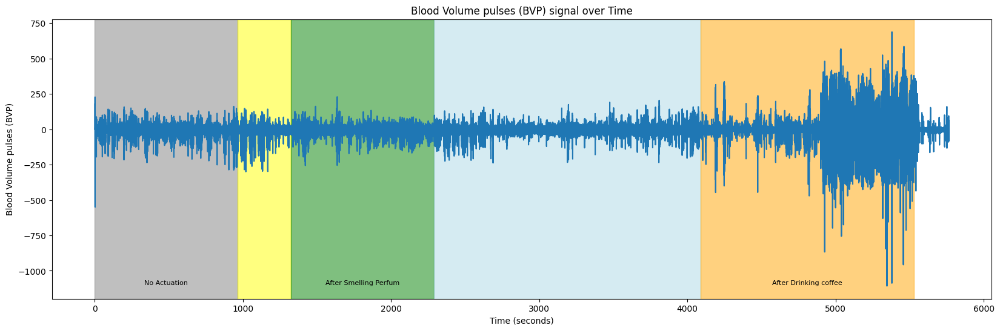

In [356]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [357]:
left_temp_df=pd.read_csv(file_paths['B8']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,32.05,1.630317e+09,4.0
1,32.05,1.630317e+09,4.0
2,32.05,1.630317e+09,4.0
3,32.05,1.630317e+09,4.0
4,32.05,1.630317e+09,4.0
...,...,...,...
23067,31.81,1.630317e+09,4.0
23068,31.79,1.630317e+09,4.0
23069,31.79,1.630317e+09,4.0
23070,31.79,1.630317e+09,4.0


In [358]:
right_temp_df=pd.read_csv(file_paths['B8']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,32.73,1.630317e+09,4.0
1,32.73,1.630317e+09,4.0
2,32.73,1.630317e+09,4.0
3,32.73,1.630317e+09,4.0
4,32.73,1.630317e+09,4.0
...,...,...,...
23067,31.55,1.630317e+09,4.0
23068,31.55,1.630317e+09,4.0
23069,31.55,1.630317e+09,4.0
23070,31.55,1.630317e+09,4.0


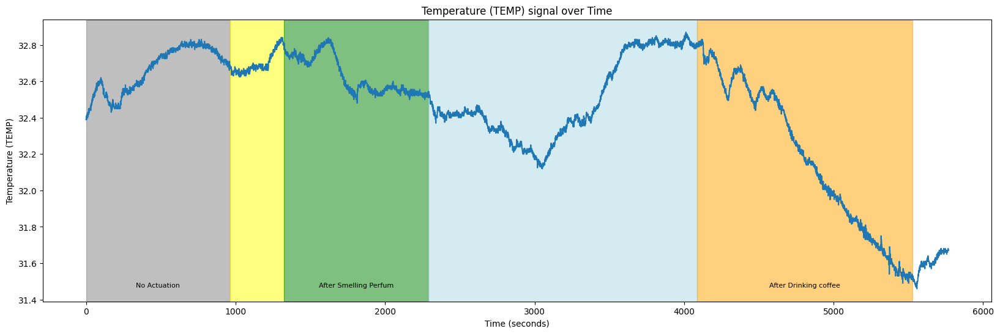

In [359]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [360]:
left_ACC_df=pd.read_csv(file_paths['B8']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-22,-19,46,1.630317e+09,32.0
1,-12,-29,37,1.630317e+09,32.0
2,-8,-33,34,1.630317e+09,32.0
3,-2,-39,32,1.630317e+09,32.0
4,-1,-39,34,1.630317e+09,32.0
...,...,...,...,...,...
184441,15,2,63,1.630317e+09,32.0
184442,14,2,64,1.630317e+09,32.0
184443,14,2,64,1.630317e+09,32.0
184444,15,1,63,1.630317e+09,32.0


In [361]:
right_ACC_df=pd.read_csv(file_paths['B8']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-41,6,48,1.630317e+09,32.0
1,-40,5,49,1.630317e+09,32.0
2,-40,5,49,1.630317e+09,32.0
3,-40,5,49,1.630317e+09,32.0
4,-39,4,49,1.630317e+09,32.0
...,...,...,...,...,...
184441,-18,27,54,1.630317e+09,32.0
184442,-18,28,54,1.630317e+09,32.0
184443,-19,27,54,1.630317e+09,32.0
184444,-19,27,55,1.630317e+09,32.0


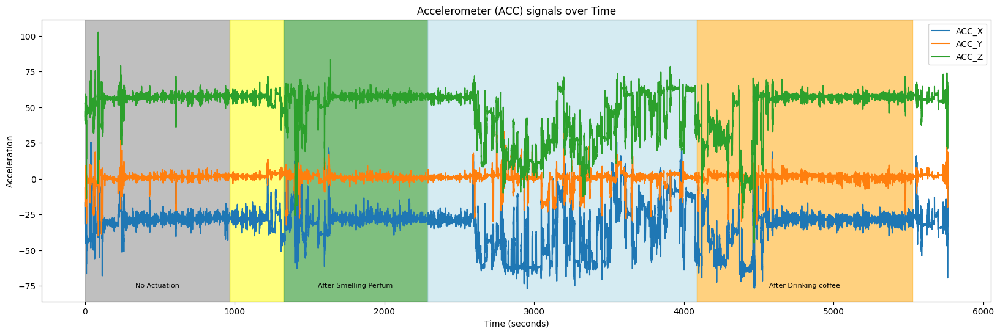

In [362]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [82]:
eeg_df=pd.read_csv(file_paths['B8']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.630317e+09,41.992,54.199,50.293,46.387,23.926
1,1.630317e+09,46.387,60.059,54.199,54.688,-11.719
2,1.630317e+09,72.266,73.242,67.871,81.055,17.090
3,1.630317e+09,56.641,34.180,43.457,65.430,26.855
4,1.630317e+09,44.922,29.785,41.992,49.805,58.594
...,...,...,...,...,...,...
1484311,1.630323e+09,-1.465,141.602,46.875,-88.867,43.945
1484312,1.630323e+09,-5.371,140.625,61.035,-67.383,18.066
1484313,1.630323e+09,2.441,125.488,34.180,-52.246,72.266
1484314,1.630323e+09,-8.301,85.938,39.062,-56.152,94.727


Text(0.5, 0, 'time (s)')

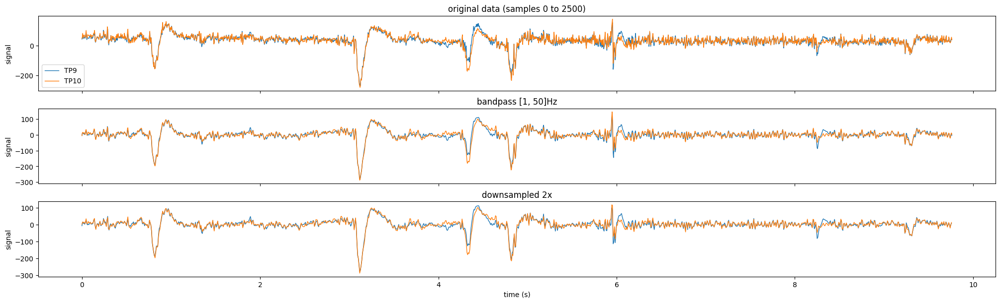

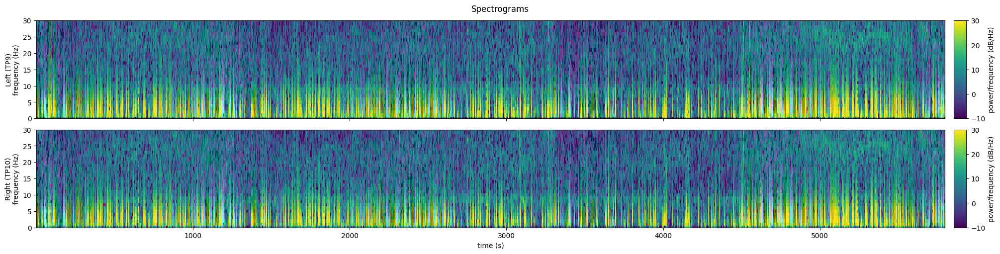

In [83]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


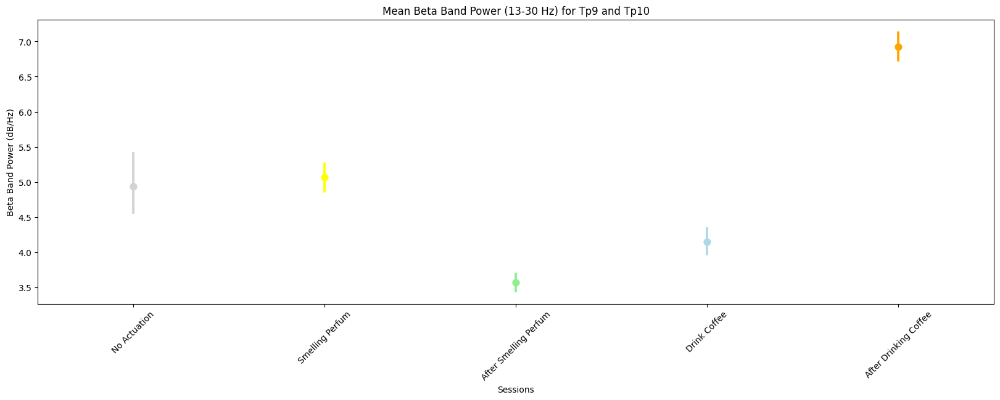

In [84]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


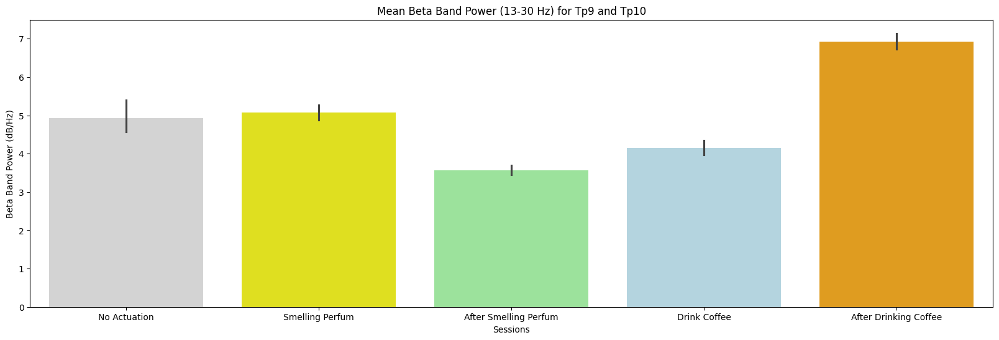

In [85]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()

# Patient B9


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [365]:
n_backr_df = pd.read_csv(file_paths['B9']['n_back_responses'])

In [366]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [367]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [368]:
df_length=len(n_backr_df)

In [369]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1630284438,15,2,Chronos,-999999,28,1708036,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [370]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [371]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [372]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [373]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [374]:
len(stimulus)

40

In [375]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [376]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [377]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,1.0,-2.0,280141.0,506.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,2.0,20.0,282167.0,506.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,1.0,20.0,284193.0,506.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,1.0,20.0,286219.0,506.0,NaN,0.0,0.0,PracticeSession
4,1.0,4.0,Chronos,2.0,19.0,288244.0,0.0,4.0,291.0,288535.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [378]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [379]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [380]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,2.0,19.0,6099533.0,507.0,NaN,0.0,0.0,CoffeeSession
1099,1.0,3.0,Chronos,1.0,6.0,6101546.0,0.0,3.0,440.0,6101986.0,CoffeeSession
1100,1.0,3.0,Chronos,1.0,20.0,6103519.0,0.0,3.0,243.0,6103762.0,CoffeeSession
1101,1.0,3.0,Chronos,2.0,19.0,6105291.0,0.0,3.0,491.0,6105782.0,CoffeeSession


### Fixation

In [381]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [382]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [383]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,0.0,3.0,Chronos,2.0,6.0,280647.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,3.0,Chronos,2.0,6.0,282673.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,3.0,Chronos,2.0,6.0,284699.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,4.0,Chronos,2.0,6.0,286725.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,4.0,Chronos,1.0,16.0,288551.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,1.0,7.0,6100040.0,0.0,3.0,30.0,6100070.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,13.0,6101999.0,0.0,NaN,0.0,0.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,1.0,10.0,6103772.0,0.0,NaN,0.0,0.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,1.0,16.0,6105798.0,0.0,NaN,0.0,0.0


#### Fixation table 100

In [384]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,6.0,280647.0,0.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,2.0,6.0,282673.0,0.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,2.0,6.0,284699.0,0.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,2.0,6.0,286725.0,0.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,1.0,16.0,288551.0,0.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [385]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [386]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [387]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,1.0,7.0,6100040.0,0.0,3.0,30.0,6100070.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,13.0,6101999.0,0.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,1.0,10.0,6103772.0,0.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,1.0,16.0,6105798.0,0.0,NaN,0.0,0.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [388]:
left_eda_df=pd.read_csv(file_paths['B9']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.630284e+09,4.0
1,0.597136,1.630284e+09,4.0
2,0.675302,1.630284e+09,4.0
3,0.689665,1.630284e+09,4.0
4,0.539740,1.630284e+09,4.0
...,...,...,...
25369,0.477965,1.630284e+09,4.0
25370,0.470277,1.630284e+09,4.0
25371,0.457463,1.630284e+09,4.0
25372,0.413895,1.630284e+09,4.0


In [389]:
right_eda_df=pd.read_csv(file_paths['B9']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.630284e+09,4.0
1,0.220296,1.630284e+09,4.0
2,0.284336,1.630284e+09,4.0
3,0.284336,1.630284e+09,4.0
4,0.283055,1.630284e+09,4.0
...,...,...,...
25369,0.175735,1.630284e+09,4.0
25370,0.174454,1.630284e+09,4.0
25371,0.174454,1.630284e+09,4.0
25372,0.173174,1.630284e+09,4.0


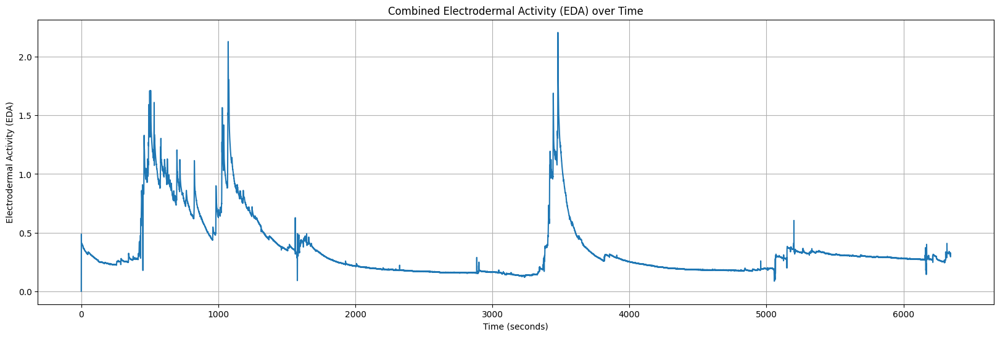

In [390]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

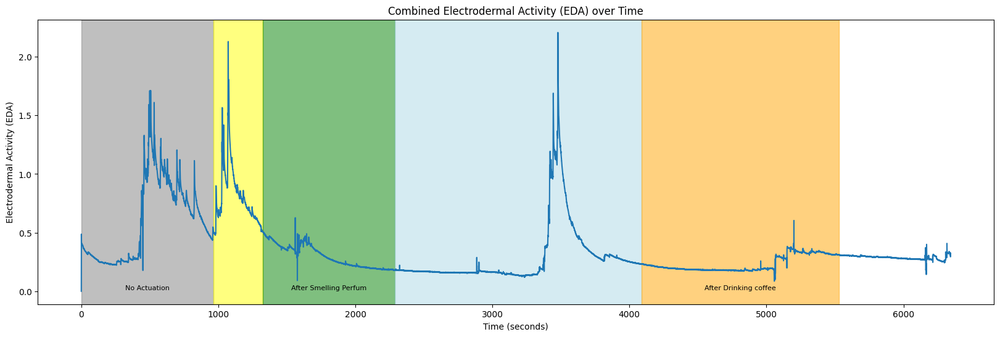

In [391]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [392]:
left_hr_df=pd.read_csv(file_paths['B9']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,49.00,1.630284e+09,1.0
1,60.00,1.630284e+09,1.0
2,64.67,1.630284e+09,1.0
3,67.50,1.630284e+09,1.0
4,64.40,1.630284e+09,1.0
...,...,...,...
6333,77.93,1.630284e+09,1.0
6334,77.70,1.630284e+09,1.0
6335,77.80,1.630284e+09,1.0
6336,77.67,1.630284e+09,1.0


In [393]:
right_hr_df=pd.read_csv(file_paths['B9']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,60.00,1.630284e+09,1.0
1,63.50,1.630284e+09,1.0
2,62.67,1.630284e+09,1.0
3,64.75,1.630284e+09,1.0
4,64.00,1.630284e+09,1.0
...,...,...,...
6333,67.95,1.630284e+09,1.0
6334,68.32,1.630284e+09,1.0
6335,68.63,1.630284e+09,1.0
6336,68.93,1.630284e+09,1.0


In [394]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.630284e+09,4.0
1,0.597136,1.630284e+09,4.0
2,0.675302,1.630284e+09,4.0
3,0.689665,1.630284e+09,4.0
4,0.539740,1.630284e+09,4.0
...,...,...,...
25369,0.477965,1.630284e+09,4.0
25370,0.470277,1.630284e+09,4.0
25371,0.457463,1.630284e+09,4.0
25372,0.413895,1.630284e+09,4.0


In [395]:
main_df.index

RangeIndex(start=0, stop=25374, step=1)

In [396]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        6341.0, 6341.25,  6341.5, 6341.75,  6342.0, 6342.25,  6342.5, 6342.75,
        6343.0, 6343.25],
      dtype='float64', length=25374)

In [397]:
hr_main_df

,HR,start_time_unix,sampling_rate
0,72.00,1.630317e+09,1.0
1,70.00,1.630317e+09,1.0
2,74.33,1.630317e+09,1.0
3,69.75,1.630317e+09,1.0
4,69.00,1.630317e+09,1.0
...,...,...,...
5749,63.97,1.630317e+09,1.0
5750,63.70,1.630317e+09,1.0
5751,63.37,1.630317e+09,1.0
5752,62.97,1.630317e+09,1.0


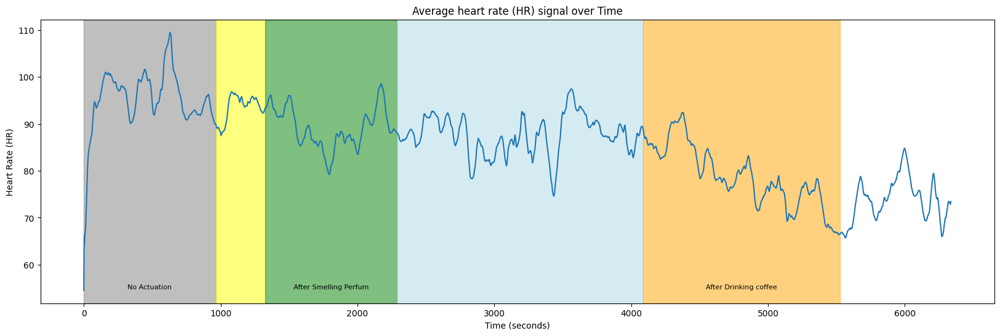

In [398]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [399]:
left_bvp_df=pd.read_csv(file_paths['B9']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.630284e+09,64.0
1,-0.00,1.630284e+09,64.0
2,-0.00,1.630284e+09,64.0
3,-0.00,1.630284e+09,64.0
4,-0.00,1.630284e+09,64.0
...,...,...,...
406335,93.38,1.630284e+09,64.0
406336,82.21,1.630284e+09,64.0
406337,71.38,1.630284e+09,64.0
406338,63.84,1.630284e+09,64.0


In [400]:
right_bvp_df=pd.read_csv(file_paths['B9']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.630284e+09,64.0
1,-0.00,1.630284e+09,64.0
2,-0.00,1.630284e+09,64.0
3,-0.00,1.630284e+09,64.0
4,-0.00,1.630284e+09,64.0
...,...,...,...
406324,-48.26,1.630284e+09,64.0
406325,-39.38,1.630284e+09,64.0
406326,-28.69,1.630284e+09,64.0
406327,-14.76,1.630284e+09,64.0


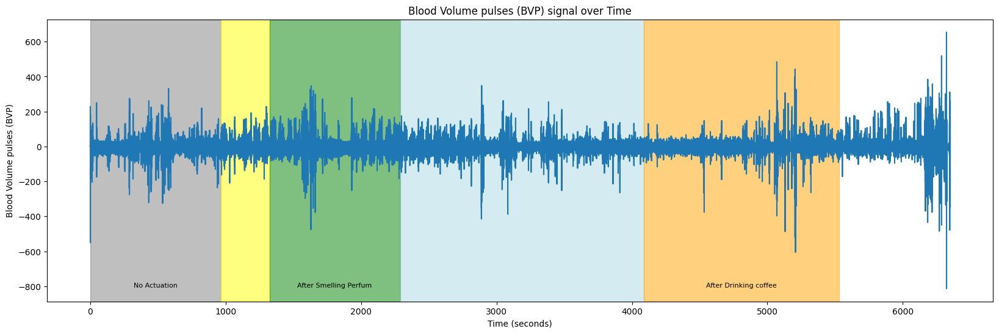

In [401]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [402]:
left_temp_df=pd.read_csv(file_paths['B9']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,33.11,1.630284e+09,4.0
1,33.11,1.630284e+09,4.0
2,33.11,1.630284e+09,4.0
3,33.11,1.630284e+09,4.0
4,33.11,1.630284e+09,4.0
...,...,...,...
25411,32.49,1.630284e+09,4.0
25412,32.55,1.630284e+09,4.0
25413,32.55,1.630284e+09,4.0
25414,32.55,1.630284e+09,4.0


In [403]:
right_temp_df=pd.read_csv(file_paths['B9']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,33.66,1.630284e+09,4.0
1,33.66,1.630284e+09,4.0
2,33.66,1.630284e+09,4.0
3,33.66,1.630284e+09,4.0
4,33.66,1.630284e+09,4.0
...,...,...,...
25411,31.97,1.630284e+09,4.0
25412,31.97,1.630284e+09,4.0
25413,31.97,1.630284e+09,4.0
25414,31.97,1.630284e+09,4.0


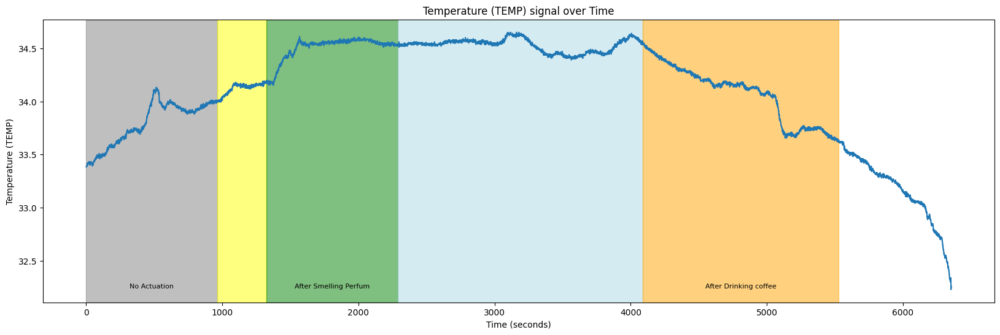

In [404]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [405]:
left_ACC_df=pd.read_csv(file_paths['B9']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-42,-6,51,1.630284e+09,32.0
1,-42,-6,50,1.630284e+09,32.0
2,-42,-6,50,1.630284e+09,32.0
3,-42,-6,51,1.630284e+09,32.0
4,-41,-6,51,1.630284e+09,32.0
...,...,...,...,...,...
203107,17,0,61,1.630284e+09,32.0
203108,17,0,61,1.630284e+09,32.0
203109,17,0,61,1.630284e+09,32.0
203110,17,0,61,1.630284e+09,32.0


In [406]:
right_ACC_df=pd.read_csv(file_paths['B9']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-54,14,29,1.630284e+09,32.0
1,-55,14,29,1.630284e+09,32.0
2,-55,15,29,1.630284e+09,32.0
3,-54,14,29,1.630284e+09,32.0
4,-54,14,29,1.630284e+09,32.0
...,...,...,...,...,...
203107,-7,18,61,1.630284e+09,32.0
203108,-7,18,61,1.630284e+09,32.0
203109,-7,19,61,1.630284e+09,32.0
203110,-7,19,60,1.630284e+09,32.0


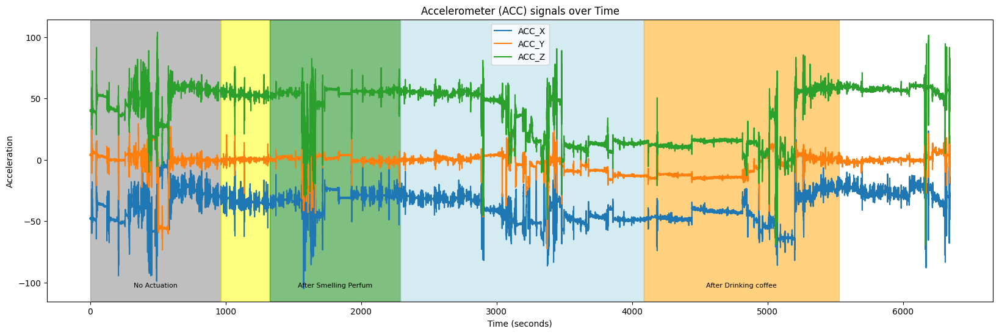

In [407]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [86]:
eeg_df=pd.read_csv(file_paths['B9']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.630284e+09,-32.227,20.996,5.859,24.414,70.312
1,1.630284e+09,-32.715,22.461,4.395,23.926,7.324
2,1.630284e+09,-33.203,17.090,2.930,28.809,9.277
3,1.630284e+09,-30.762,13.672,3.906,27.832,-32.715
4,1.630284e+09,-29.297,15.137,2.441,31.250,2.930
...,...,...,...,...,...,...
1630687,1.630291e+09,29.297,23.438,17.578,37.109,-133.301
1630688,1.630291e+09,34.668,27.344,31.250,22.949,-164.062
1630689,1.630291e+09,25.391,34.668,37.598,31.250,-153.809
1630690,1.630291e+09,28.320,26.367,23.926,37.109,-131.348


Text(0.5, 0, 'time (s)')

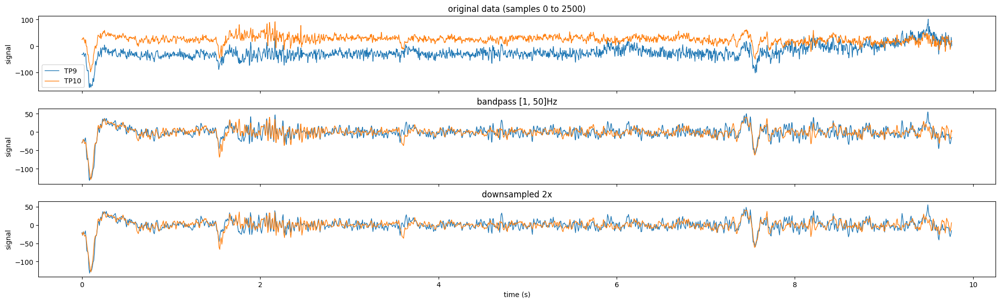

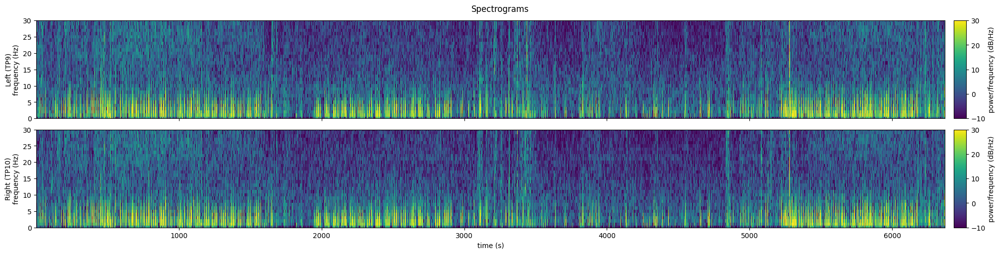

In [87]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


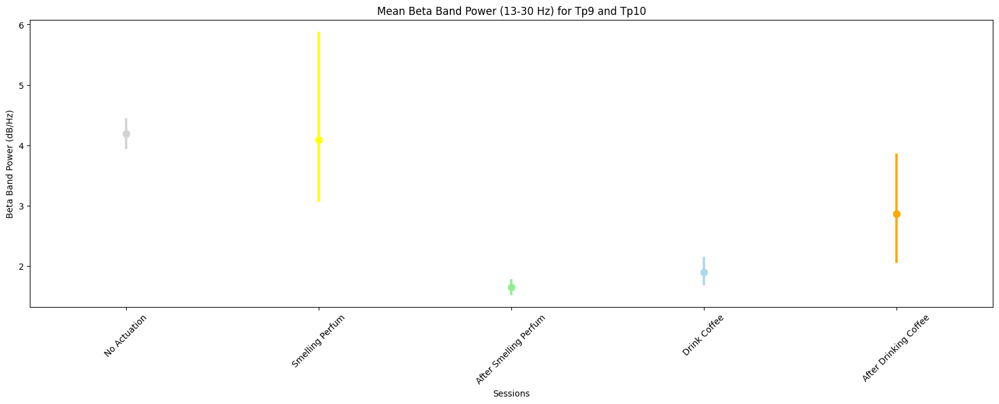

In [88]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


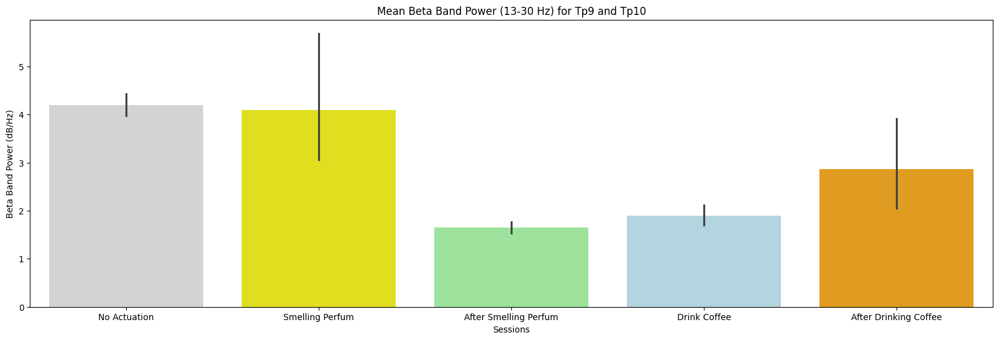

In [89]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()

# Patient B10


## n back responses
###  Load  data into a DataFrame
The experiment settings and behavioral signals can be found in the ‘n_back_responses.csv’ file. The .csv file is in the following format:
- The “ExperimentName” specifies the experiment of the study.
- The “Instruction” specifies the presented n-back task at each trial.
- The “Running [Block]” displays the applied actuator within each session.

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign (fixation cross) for their response (1500 ms). The behavioral signals including the reaction time (RT) and correct/incorrect response are stored under the “Stimulus” and “Fixation” categories.

In experiment 1, the reaction times (milliseconds) associated with session 1 to session 4 are stored within “Fixation101.RT” to “Fixation104.RT” and “Stimulus101.RT” to “Stimulus104.RT”. The binary correct/incorrect responses associated with session 1 to session 4 are stored within “Fixation101.ACC” to “Fixation104.ACC” and “Stimulus101.ACC” to “Stimulus104.ACC”.

In [410]:
n_backr_df = pd.read_csv(file_paths['B10']['n_back_responses'])

In [411]:
n_backr_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,TrialList8.Cycle,TrialList8.Sample,TSO,TSTh,TSvO,TSvTh,TSxO,TSxTh,TTO,TTTh
0,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1099,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1100,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1101,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [412]:
n_backr_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1103 entries, 0 to 1102
Data columns (total 219 columns):
 #    Column                             Non-Null Count  Dtype  
---   ------                             --------------  -----  
 0    ExperimentName                     1103 non-null   object 
 1    Start_time_unix                    1103 non-null   int64  
 2    Subject                            1103 non-null   int64  
 3    Session                            1103 non-null   int64  
 4    ApplyPerfume.DEVICE                1103 non-null   object 
 5    ApplyPerfume.DurationError         1103 non-null   int64  
 6    ApplyPerfume.OnsetDelay            1103 non-null   int64  
 7    ApplyPerfume.OnsetTime             1103 non-null   int64  
 8    ApplyPerfume.OnsetToOnsetTime      1103 non-null   int64  
 9    CoffeeInst.DEVICE                  1103 non-null   object 
 10   CoffeeInst.DurationError           1103 non-null   int64  
 11   CoffeeInst.OnsetDelay              1103 n

In [413]:
df_length=len(n_backr_df)

In [414]:
# Filter columns with length 1456
non_null_columns = [col for col in n_backr_df.columns if n_backr_df[col].notnull().all()]
# Create a new DataFrame with only columns of the same length as the DataFrame
complete_df = n_backr_df[non_null_columns]
complete_df

,ExperimentName,Start_time_unix,Subject,Session,ApplyPerfume.DEVICE,ApplyPerfume.DurationError,ApplyPerfume.OnsetDelay,ApplyPerfume.OnsetTime,ApplyPerfume.OnsetToOnsetTime,CoffeeInst.DEVICE,...,Start.DEVICE,StudioVersion,ThankYou.DEVICE,Welcome.DEVICE,Block,Instruction,ListName,Procedure[Block],Running[Block],Trigger
0,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
1,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
2,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
3,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
4,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,1,1-Back Task \n\n Press TARGET if current lette...,FFO,PracticeTrial,PracticeSession,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1099,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1100,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16
1101,Experiment_2,1630810785,16,2,Chronos,-999999,15,1334958,0,Chronos,...,Chronos,3.0.3.43,Chronos,Chronos,53,One Back Task \n\n Press TARGET if current let...,TEO,StressingProc,CoffeeSession,16


### Instruction

In [415]:
instruction = n_backr_df.columns
instruction[instruction.str.contains('Instruction')]
#.str.contains('SNOMED')]

Index(['InstructionNoAct.DEVICE', 'InstructionNoAct.DurationError',
       'InstructionNoAct.OnsetDelay', 'InstructionNoAct.OnsetTime',
       'InstructionNoAct.OnsetToOnsetTime', 'Instruction'],
      dtype='object')

In [416]:
instruction_df=n_backr_df[instruction[instruction.str.contains('Instruction')]]

### Stimulus

In [417]:
stimulus = n_backr_df.columns
stimulus=stimulus[stimulus.str.contains('Stimulus')]

In [418]:
stimulus

Index(['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE',
       'Stimulus100.DurationError', 'Stimulus100.OnsetDelay',
       'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime',
       'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime',
       'Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE',
       'Stimulus101.DurationError', 'Stimulus101.OnsetDelay',
       'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime',
       'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime',
       'Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE',
       'Stimulus102.DurationError', 'Stimulus102.OnsetDelay',
       'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime',
       'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime',
       'Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE',
       'Stimulus103.DurationError', 'Stimulus103.OnsetDelay',
       'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime',
       'Stimulus103

In [419]:
len(stimulus)

40

In [420]:
# Create a dictionary to store the mapping of columns to Running[Block] values
column_to_block = {}
running_block_values=n_backr_df['Running[Block]'].unique()
# Create a dictionary to store the mapping of stimulus columns to lists of Running[Block] values

stimulus_to_blocks = {}

# Iterate over each stimulus column
for col in stimulus:
    # Store all 4 Running[Block] values as a list for this stimulus column
    stimulus_to_blocks[col] = running_block_values

print(stimulus_to_blocks)

{'Stimulus100.ACC': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.CRESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DEVICE': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.DurationError': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetDelay': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.OnsetToOnsetTime': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RESP': array(['PracticeSession', 'NoAct', 'PerfumeSession', 'CoffeeSession'],
      dtype=object), 'Stimulus100.RT': array(['PracticeSession', 'NoAct', 'PerfumeSession'

In [421]:
# Create a new dictionary to store the suffixed keys and values
suffixed_dict = {}

# Iterate over each key in stimulus_to_blocks dictionary
for key, values in stimulus_to_blocks.items():
    # Get the prefix (e.g., 'Stimulus100') from the key
    prefix = key.split('.')[0]
    
    # Create a list to store the suffixed column names
    suffixed_columns = []
    
    # Iterate over each column name in stimulus_columns
    for col in stimulus:
        # If the column name starts with the same prefix
        if col.startswith(prefix):
            # Append the suffixed column name to the list
            suffixed_columns.append(col)
    
    # Create the suffixed key by joining the prefix with ':'
    suffixed_key = f'{prefix}:'
    
    # Add the suffixed column names list as the value for the suffixed key
    suffixed_dict[suffixed_key] = suffixed_columns

print(suffixed_dict)

{'Stimulus100:': ['Stimulus100.ACC', 'Stimulus100.CRESP', 'Stimulus100.DEVICE', 'Stimulus100.DurationError', 'Stimulus100.OnsetDelay', 'Stimulus100.OnsetTime', 'Stimulus100.OnsetToOnsetTime', 'Stimulus100.RESP', 'Stimulus100.RT', 'Stimulus100.RTTime'], 'Stimulus101:': ['Stimulus101.ACC', 'Stimulus101.CRESP', 'Stimulus101.DEVICE', 'Stimulus101.DurationError', 'Stimulus101.OnsetDelay', 'Stimulus101.OnsetTime', 'Stimulus101.OnsetToOnsetTime', 'Stimulus101.RESP', 'Stimulus101.RT', 'Stimulus101.RTTime'], 'Stimulus102:': ['Stimulus102.ACC', 'Stimulus102.CRESP', 'Stimulus102.DEVICE', 'Stimulus102.DurationError', 'Stimulus102.OnsetDelay', 'Stimulus102.OnsetTime', 'Stimulus102.OnsetToOnsetTime', 'Stimulus102.RESP', 'Stimulus102.RT', 'Stimulus102.RTTime'], 'Stimulus103:': ['Stimulus103.ACC', 'Stimulus103.CRESP', 'Stimulus103.DEVICE', 'Stimulus103.DurationError', 'Stimulus103.OnsetDelay', 'Stimulus103.OnsetTime', 'Stimulus103.OnsetToOnsetTime', 'Stimulus103.RESP', 'Stimulus103.RT', 'Stimulus103.R

#### Stimulus Table 100

In [422]:
# Filter columns that start with 'Stimulus100'
stimulus100_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
stimulus100_df=n_backr_df[stimulus100_columns]
stimulus100_df

,Stimulus100.ACC,Stimulus100.CRESP,Stimulus100.DEVICE,Stimulus100.DurationError,Stimulus100.OnsetDelay,Stimulus100.OnsetTime,Stimulus100.OnsetToOnsetTime,Stimulus100.RESP,Stimulus100.RT,Stimulus100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,-2.0,34894.0,506.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,1.0,20.0,36920.0,506.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,1.0,20.0,38946.0,506.0,NaN,0.0,0.0,PracticeSession
3,1.0,4.0,Chronos,1.0,20.0,40972.0,0.0,4.0,457.0,41429.0,PracticeSession
4,1.0,4.0,Chronos,2.0,19.0,42957.0,0.0,4.0,495.0,43452.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 101

In [423]:
# Filter columns that start with 'Stimulus100'
stimulus101_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus101')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus101_df=n_backr_df[stimulus101_columns]
stimulus101_df

,Stimulus101.ACC,Stimulus101.CRESP,Stimulus101.DEVICE,Stimulus101.DurationError,Stimulus101.OnsetDelay,Stimulus101.OnsetTime,Stimulus101.OnsetToOnsetTime,Stimulus101.RESP,Stimulus101.RT,Stimulus101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 102

In [424]:
# Filter columns that start with 'Stimulus100'
stimulus102_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus102')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus102_df=n_backr_df[stimulus102_columns]
stimulus102_df

,Stimulus102.ACC,Stimulus102.CRESP,Stimulus102.DEVICE,Stimulus102.DurationError,Stimulus102.OnsetDelay,Stimulus102.OnsetTime,Stimulus102.OnsetToOnsetTime,Stimulus102.RESP,Stimulus102.RT,Stimulus102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Stimulus Table 103

In [425]:
# Filter columns that start with 'Stimulus100'
stimulus103_columns = [col for col in n_backr_df.columns if col.startswith('Stimulus103')]+ ['Running[Block]']

# Filter the DataFrame based on the selected columns
stimulus103_df=n_backr_df[stimulus103_columns]
stimulus103_df

,Stimulus103.ACC,Stimulus103.CRESP,Stimulus103.DEVICE,Stimulus103.DurationError,Stimulus103.OnsetDelay,Stimulus103.OnsetTime,Stimulus103.OnsetToOnsetTime,Stimulus103.RESP,Stimulus103.RT,Stimulus103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,0.0,3.0,Chronos,1.0,20.0,5407164.0,506.0,NaN,0.0,0.0,CoffeeSession
1099,1.0,3.0,Chronos,2.0,6.0,5409176.0,0.0,3.0,422.0,5409598.0,CoffeeSession
1100,0.0,3.0,Chronos,2.0,19.0,5411122.0,507.0,NaN,0.0,0.0,CoffeeSession
1101,1.0,3.0,Chronos,1.0,19.0,5413148.0,0.0,3.0,406.0,5413554.0,CoffeeSession


### Fixation

In [426]:
n_back_columns = n_backr_df.columns
fixation=n_back_columns[n_back_columns.str.contains('Fixation')]

In [427]:
fixation_df=n_backr_df[n_back_columns[n_back_columns.str.contains('Fixation')]]

In [428]:
fixation_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,...,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime
0,0.0,3.0,Chronos,2.0,6.0,35400.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,3.0,Chronos,1.0,6.0,37426.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,3.0,Chronos,1.0,6.0,39452.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,4.0,Chronos,1.0,9.0,41438.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,4.0,Chronos,1.0,12.0,43464.0,0.0,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,3.0,Chronos,2.0,6.0,5407670.0,0.0,3.0,15.0,5407685.0
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,4.0,5409603.0,0.0,NaN,0.0,0.0
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,1.0,7.0,5411629.0,0.0,NaN,0.0,0.0
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,3.0,Chronos,2.0,7.0,5413561.0,0.0,NaN,0.0,0.0


#### Fixation table 100

In [429]:
# Filter columns that start with 'Fixation100'
fixation100_columns = [col for col in n_backr_df.columns if col.startswith('Fixation100')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation100_df=n_backr_df[fixation100_columns]
fixation100_df

,Fixation100.ACC,Fixation100.CRESP,Fixation100.DEVICE,Fixation100.DurationError,Fixation100.OnsetDelay,Fixation100.OnsetTime,Fixation100.OnsetToOnsetTime,Fixation100.RESP,Fixation100.RT,Fixation100.RTTime,Running[Block]
0,0.0,3.0,Chronos,2.0,6.0,35400.0,0.0,NaN,0.0,0.0,PracticeSession
1,0.0,3.0,Chronos,1.0,6.0,37426.0,0.0,NaN,0.0,0.0,PracticeSession
2,0.0,3.0,Chronos,1.0,6.0,39452.0,0.0,NaN,0.0,0.0,PracticeSession
3,0.0,4.0,Chronos,1.0,9.0,41438.0,0.0,NaN,0.0,0.0,PracticeSession
4,0.0,4.0,Chronos,1.0,12.0,43464.0,0.0,NaN,0.0,0.0,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 101

In [430]:
# Filter columns that start with 'Fixation100'
fixation101_columns = [col for col in n_backr_df.columns if col.startswith('Fixation101')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation101_df=n_backr_df[fixation101_columns]
fixation101_df

,Fixation101.ACC,Fixation101.CRESP,Fixation101.DEVICE,Fixation101.DurationError,Fixation101.OnsetDelay,Fixation101.OnsetTime,Fixation101.OnsetToOnsetTime,Fixation101.RESP,Fixation101.RT,Fixation101.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 102

In [431]:
# Filter columns that start with 'Fixation100'
fixation102_columns = [col for col in n_backr_df.columns if col.startswith('Fixation102')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation102_df=n_backr_df[fixation102_columns]
fixation102_df

,Fixation102.ACC,Fixation102.CRESP,Fixation102.DEVICE,Fixation102.DurationError,Fixation102.OnsetDelay,Fixation102.OnsetTime,Fixation102.OnsetToOnsetTime,Fixation102.RESP,Fixation102.RT,Fixation102.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession
1101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CoffeeSession


#### Fixation table 103

In [432]:
# Filter columns that start with 'Fixation100'
fixation103_columns = [col for col in n_backr_df.columns if col.startswith('Fixation103')]+ ['Running[Block]']


# Filter the DataFrame based on the selected columns
fixation103_df=n_backr_df[fixation103_columns]
fixation103_df

,Fixation103.ACC,Fixation103.CRESP,Fixation103.DEVICE,Fixation103.DurationError,Fixation103.OnsetDelay,Fixation103.OnsetTime,Fixation103.OnsetToOnsetTime,Fixation103.RESP,Fixation103.RT,Fixation103.RTTime,Running[Block]
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PracticeSession
...,...,...,...,...,...,...,...,...,...,...,...
1098,1.0,3.0,Chronos,2.0,6.0,5407670.0,0.0,3.0,15.0,5407685.0,CoffeeSession
1099,0.0,3.0,Chronos,2.0,4.0,5409603.0,0.0,NaN,0.0,0.0,CoffeeSession
1100,0.0,3.0,Chronos,1.0,7.0,5411629.0,0.0,NaN,0.0,0.0,CoffeeSession
1101,0.0,3.0,Chronos,2.0,7.0,5413561.0,0.0,NaN,0.0,0.0,CoffeeSession


## Empatica

### EDA
- EDA: Measurements from the electrodermal activity (EDA) sensor expressed as micro siemens (μS). Values in the first column (EDA) show the EDA values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [433]:
left_eda_df=pd.read_csv(file_paths['B10']['Left_EDA'])
left_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.630811e+09,4.0
1,0.835227,1.630811e+09,4.0
2,1.182651,1.630811e+09,4.0
3,1.620829,1.630811e+09,4.0
4,2.098750,1.630811e+09,4.0
...,...,...,...
23341,2.578402,1.630811e+09,4.0
23342,2.588650,1.630811e+09,4.0
23343,2.595055,1.630811e+09,4.0
23344,2.601460,1.630811e+09,4.0


In [434]:
right_eda_df=pd.read_csv(file_paths['B10']['Right_EDA'])
right_eda_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.630811e+09,4.0
1,0.831534,1.630811e+09,4.0
2,1.177739,1.630811e+09,4.0
3,1.617278,1.630811e+09,4.0
4,2.095285,1.630811e+09,4.0
...,...,...,...
23341,1.134345,1.630811e+09,4.0
23342,1.156126,1.630811e+09,4.0
23343,1.161251,1.630811e+09,4.0
23344,1.159970,1.630811e+09,4.0


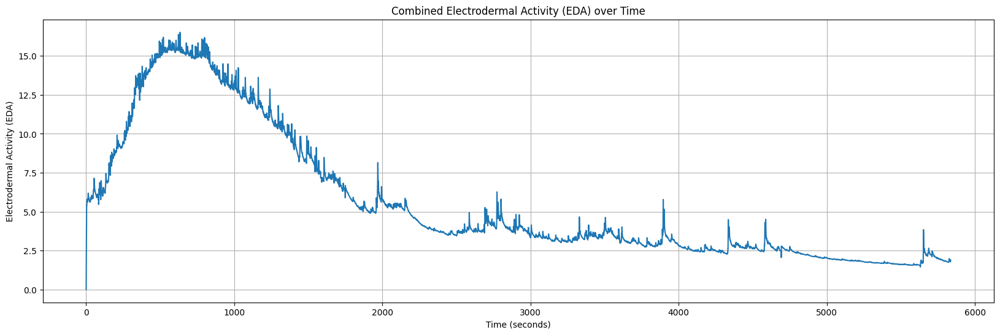

In [435]:
# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)
plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(True)
plt.show()

In the designed n-back experiments, subjects were shown trials of stimulus (500 ms) along with a plus sign 
for their response (1500 ms). Each session consisted of an instruction that lasted for 5 s and 16 trials each of 
which includes 22 stimuli. Tere were 10 s breaks in between trials and 20 s relaxation in between the 16 trials. Te total duration of each session was 964 s (i.e., 16 × [5 + (22 × 2) + 10] + 20 = 964). To specify their 
response, participants had to press the target (green) vs non-target (red) buttons on Chronos
Afer each session, they sit and relax for three minutes 
(the relaxation time afer the second session was 6 min). Te entire duration of the experiment is about 80 min.
In experiment 2, in the frst session, they perform n-back tasks with no actuation. Before the second session, they are asked to smell their choice of fragrance. Tey have 6 min to apply this actuation. Next, they are 
asked to repeat the n-back tasks. In the third session, we aimed to investigate the efects of drinking cofee as 
the actuation. Tey were provided with their regular cofee and were asked to sit down and drink their cofee 
during a 30-min break while resting. Next, they repeat performing the memory tasks. Te entire duration of the 
experiment is about 90 min

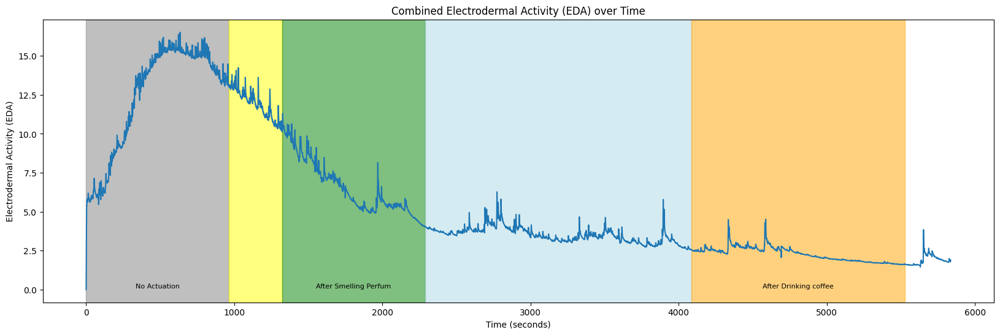

In [436]:
import matplotlib.pyplot as plt


# Combine the two EDA signals by taking the average
combined_eda = (right_eda_df['EDA'] + left_eda_df['EDA']) / 2

# Determine the data frame with the larger length
if len(right_eda_df) > len(left_eda_df):
    main_df = right_eda_df
else:
    main_df = left_eda_df

# Use the sampling rate from the main data frame to calculate the time in seconds
sampling_rate = main_df['sampling_rate'].iloc[0]
time_seconds = main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_eda)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']



# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_eda), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Combined Electrodermal Activity (EDA) over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Electrodermal Activity (EDA)')
plt.grid(False)
plt.show()

### HR
- HR: Average heart rate (HR) extracted from the BVP signal. Values in the first column (HR) show the HR values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [437]:
left_hr_df=pd.read_csv(file_paths['B10']['Left_HR'])
left_hr_df

,HR,start_time_unix,sampling_rate
0,65.00,1.630811e+09,1.0
1,65.50,1.630811e+09,1.0
2,66.00,1.630811e+09,1.0
3,66.50,1.630811e+09,1.0
4,67.00,1.630811e+09,1.0
...,...,...,...
5822,66.13,1.630811e+09,1.0
5823,66.37,1.630811e+09,1.0
5824,66.58,1.630811e+09,1.0
5825,66.78,1.630811e+09,1.0


In [438]:
right_hr_df=pd.read_csv(file_paths['B10']['Right_HR'])
right_hr_df

,HR,start_time_unix,sampling_rate
0,66.00,1.630811e+09,1.0
1,66.50,1.630811e+09,1.0
2,68.33,1.630811e+09,1.0
3,69.50,1.630811e+09,1.0
4,68.40,1.630811e+09,1.0
...,...,...,...
5822,61.48,1.630811e+09,1.0
5823,61.82,1.630811e+09,1.0
5824,62.17,1.630811e+09,1.0
5825,62.50,1.630811e+09,1.0


In [439]:
main_df

,EDA,start_time_unix,sampling_rate
0,0.000000,1.630811e+09,4.0
1,0.835227,1.630811e+09,4.0
2,1.182651,1.630811e+09,4.0
3,1.620829,1.630811e+09,4.0
4,2.098750,1.630811e+09,4.0
...,...,...,...
23341,2.578402,1.630811e+09,4.0
23342,2.588650,1.630811e+09,4.0
23343,2.595055,1.630811e+09,4.0
23344,2.601460,1.630811e+09,4.0


In [440]:
main_df.index

RangeIndex(start=0, stop=23346, step=1)

In [441]:
time_seconds

Index([    0.0,    0.25,     0.5,    0.75,     1.0,    1.25,     1.5,    1.75,
           2.0,    2.25,
       ...
        5834.0, 5834.25,  5834.5, 5834.75,  5835.0, 5835.25,  5835.5, 5835.75,
        5836.0, 5836.25],
      dtype='float64', length=23346)

In [442]:
hr_main_df

,HR,start_time_unix,sampling_rate
0,49.00,1.630284e+09,1.0
1,60.00,1.630284e+09,1.0
2,64.67,1.630284e+09,1.0
3,67.50,1.630284e+09,1.0
4,64.40,1.630284e+09,1.0
...,...,...,...
6333,77.93,1.630284e+09,1.0
6334,77.70,1.630284e+09,1.0
6335,77.80,1.630284e+09,1.0
6336,77.67,1.630284e+09,1.0


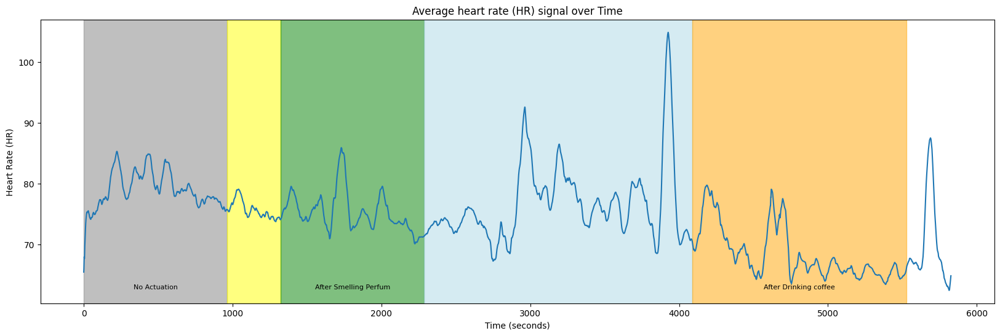

In [443]:
import matplotlib.pyplot as plt


# Combine the two hr signals by taking the average
combined_hr = (right_hr_df['HR'] + left_hr_df['HR']) / 2

# Determine the data frame with the larger length
if len(right_hr_df) > len(left_hr_df):
    hr_main_df = right_hr_df
else:
    hr_main_df = left_hr_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = hr_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = hr_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_hr)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_hr), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Average heart rate (HR) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Heart Rate (HR)')
plt.grid(False)
plt.show()

### BVP
- BVP: Blood volume pulses (BVP) measured from a photoplethysmograph. Values in the first column (BVP) show the BVP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [444]:
left_bvp_df=pd.read_csv(file_paths['B10']['Left_BVP'])
left_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.630811e+09,64.0
1,-0.00,1.630811e+09,64.0
2,-0.00,1.630811e+09,64.0
3,-0.00,1.630811e+09,64.0
4,-0.00,1.630811e+09,64.0
...,...,...,...
373654,-271.33,1.630811e+09,64.0
373655,-222.07,1.630811e+09,64.0
373656,-173.09,1.630811e+09,64.0
373657,-131.52,1.630811e+09,64.0


In [445]:
right_bvp_df=pd.read_csv(file_paths['B10']['Right_BVP'])
right_bvp_df

,BVP,start_time_unix,sampling_rate
0,-0.00,1.630811e+09,64.0
1,-0.00,1.630811e+09,64.0
2,-0.00,1.630811e+09,64.0
3,-0.00,1.630811e+09,64.0
4,-0.00,1.630811e+09,64.0
...,...,...,...
373654,-260.65,1.630811e+09,64.0
373655,-243.71,1.630811e+09,64.0
373656,-220.85,1.630811e+09,64.0
373657,-194.16,1.630811e+09,64.0


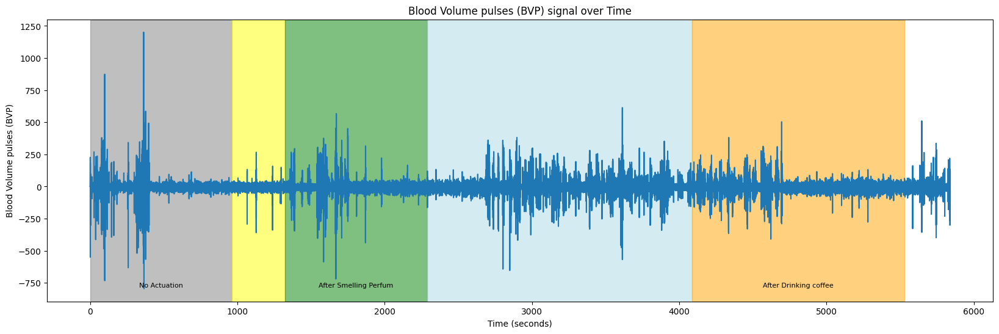

In [446]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_bvp = (right_bvp_df['BVP'] + left_bvp_df['BVP']) / 2

# Determine the data frame with the larger length
if len(right_bvp_df) > len(left_bvp_df):
    bvp_main_df = right_bvp_df
else:
    bvp_main_df = left_bvp_df


# Use the sampling rate to calculate the time in seconds
sampling_rate = bvp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = bvp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_bvp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_bvp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Blood Volume pulses (BVP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Blood Volume pulses (BVP)')
plt.grid(False)
plt.show()

### Temperature
- TEMP: Skin temperature (TEMP) measured from temperature sensor expressed degrees on the Celsius (°C) scale. Values in the first column (TEMP) show the TEMP values. The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [447]:
left_temp_df=pd.read_csv(file_paths['B10']['Left_TEMP'])
left_temp_df

,TEMP,start_time_unix,sampling_rate
0,31.53,1.630811e+09,4.0
1,31.53,1.630811e+09,4.0
2,31.53,1.630811e+09,4.0
3,31.53,1.630811e+09,4.0
4,31.53,1.630811e+09,4.0
...,...,...,...
23371,32.75,1.630811e+09,4.0
23372,32.71,1.630811e+09,4.0
23373,32.71,1.630811e+09,4.0
23374,32.71,1.630811e+09,4.0


In [448]:
right_temp_df=pd.read_csv(file_paths['B10']['Right_TEMP'])
right_temp_df

,TEMP,start_time_unix,sampling_rate
0,29.27,1.630811e+09,4.0
1,29.27,1.630811e+09,4.0
2,29.27,1.630811e+09,4.0
3,29.27,1.630811e+09,4.0
4,29.27,1.630811e+09,4.0
...,...,...,...
23371,32.15,1.630811e+09,4.0
23372,32.13,1.630811e+09,4.0
23373,32.13,1.630811e+09,4.0
23374,32.13,1.630811e+09,4.0


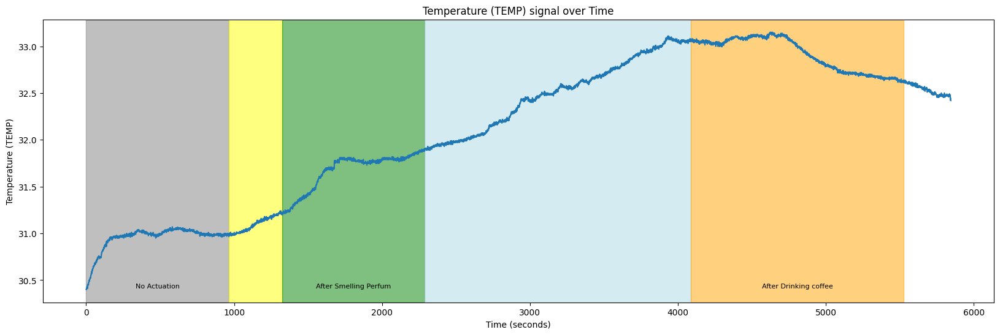

In [449]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_temp = (right_temp_df['TEMP'] + left_temp_df['TEMP']) / 2

# Determine the data frame with the larger length
if len(right_temp_df) > len(left_temp_df):
    temp_main_df = right_temp_df
else:
    temp_main_df = left_temp_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = temp_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = temp_main_df.index / sampling_rate

# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_temp)

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_temp), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Temperature (TEMP) signal over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Temperature (TEMP)')
plt.grid(False)
plt.show()

### ACC
- ACC: Data from 3-axis accelerometer sensor. The accelerometer is configured to measure acceleration in the range [-2g, 2g]. Therefore, the unit in this file is 1/64g. Data from x, y, and z axis are labeled respectively (i.e., ACC_X, ACC_Y, and ACC_Z).  The column (start_time_unix) shows the initial time of the recording expressed as UNIX timestamp in UTC. The column (sampling_rate) shows the sample rate expressed in Hz.

In [450]:
left_ACC_df=pd.read_csv(file_paths['B10']['Left_ACC'])
left_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-30,-13,55,1.630811e+09,32.0
1,-30,-13,54,1.630811e+09,32.0
2,-30,-13,54,1.630811e+09,32.0
3,-30,-13,55,1.630811e+09,32.0
4,-30,-13,54,1.630811e+09,32.0
...,...,...,...,...,...
186763,0,-13,62,1.630811e+09,32.0
186764,-1,-13,62,1.630811e+09,32.0
186765,0,-13,62,1.630811e+09,32.0
186766,-1,-14,62,1.630811e+09,32.0


In [451]:
right_ACC_df=pd.read_csv(file_paths['B10']['Right_ACC'])
right_ACC_df

,ACC_X,ACC_Y,ACC_Z,start_time_unix,sampling_rate
0,-34,15,54,1.630811e+09,32.0
1,-33,15,54,1.630811e+09,32.0
2,-34,15,53,1.630811e+09,32.0
3,-34,15,54,1.630811e+09,32.0
4,-34,16,54,1.630811e+09,32.0
...,...,...,...,...,...
186757,-10,27,57,1.630811e+09,32.0
186758,-10,27,57,1.630811e+09,32.0
186759,-11,27,57,1.630811e+09,32.0
186760,-10,27,57,1.630811e+09,32.0


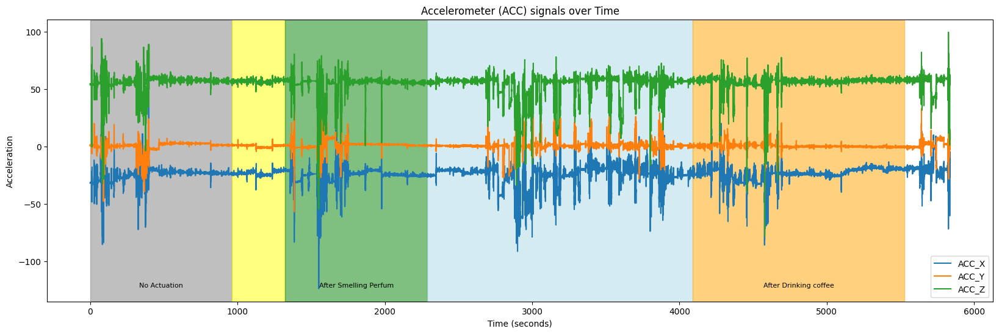

In [452]:
import matplotlib.pyplot as plt


# Combine the two bvp signals by taking the average
combined_accX = (right_ACC_df['ACC_X'] + left_ACC_df['ACC_X']) / 2
combined_accY = (right_ACC_df['ACC_Y'] + left_ACC_df['ACC_Y']) / 2
combined_accZ = (right_ACC_df['ACC_Z'] + left_ACC_df['ACC_Z']) / 2

# Determine the data frame with the larger length
if len(right_ACC_df) > len(left_ACC_df) :
    ACC_main_df = right_ACC_df
else:
    ACC_main_df = left_ACC_df

# Use the sampling rate to calculate the time in seconds
sampling_rate = ACC_main_df['sampling_rate'].iloc[0]  # Assuming the sampling rate is the same for both
time_seconds = ACC_main_df.index / sampling_rate



# Plot the combined EDA signal
plt.figure(figsize=(20, 6))
plt.plot(time_seconds, combined_accX, label='ACC_X')
plt.plot(time_seconds, combined_accY, label='ACC_Y')
plt.plot(time_seconds, combined_accZ, label='ACC_Z')

# Define the intervals and their respective colors
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]

colors = ['gray', 'yellow', 'green', 'lightblue', 'orange']

# Create a dictionary to map colors to labels
color_labels = {'gray': 'No Actuation', 'green': 'After Smelling Perfum', 'orange': 'After Drinking coffee'}


# Add background color for each interval and label
for interval, color in zip(intervals, colors):
    plt.axvspan(interval[0], interval[1], color=color, alpha=0.5)  # Adjust alpha for transparency
    if color in color_labels:
        plt.text(interval[0] + (interval[1] - interval[0]) / 2, min(combined_accX), color_labels[color],
                 ha='center', va='bottom', fontsize=8, color='black')

plt.title('Accelerometer (ACC) signals over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration')
plt.legend()
plt.grid(False)
plt.show()

## EG
The EEG signals recorded from the Muse headband are also included in the dataset as 'EEG_recording.csv'. They include EEG channels from four locations: TP9, AF7, AF8, and TP10. The 2016 model Muse (MU-02) can also output RAW EEG data at 256Hz as well as being able to output RAW EEG from the right ear USB Auxiliary connector (named Right AUX in the csv files). The column (timestamps) shows the data points in UNIX format. EEG measurements are labeled as TP9, AF7, AF8, TP10, Right AUX.

In [90]:
eeg_df=pd.read_csv(file_paths['B10']['EEG'])
eeg_df

,timestamps,TP9,AF7,AF8,TP10,Right AUX
0,1.630811e+09,418.945,-62.988,-64.941,-122.070,74.219
1,1.630811e+09,428.711,-64.453,-63.965,-131.348,49.805
2,1.630811e+09,436.035,-61.523,-60.059,-136.230,42.969
3,1.630811e+09,441.406,-62.012,-57.129,-123.535,2.441
4,1.630811e+09,444.336,-68.848,-50.293,-117.188,-15.625
...,...,...,...,...,...,...
1507312,1.630816e+09,287.598,-206.055,10.254,175.781,-16.602
1507313,1.630816e+09,310.059,-195.801,4.395,147.949,43.945
1507314,1.630816e+09,304.199,-166.504,9.766,119.629,95.215
1507315,1.630816e+09,261.719,-168.945,23.926,118.164,59.570


Text(0.5, 0, 'time (s)')

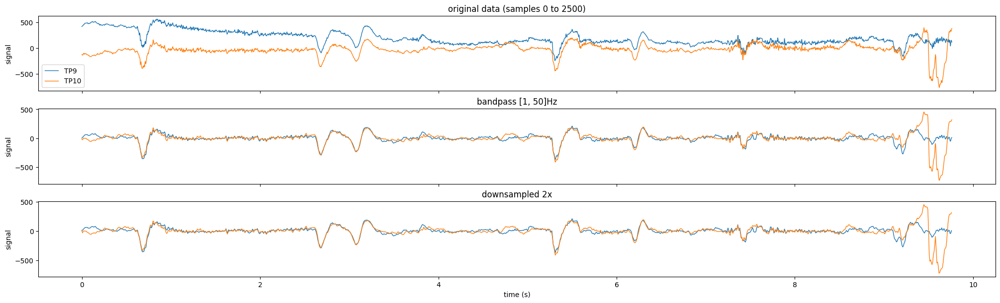

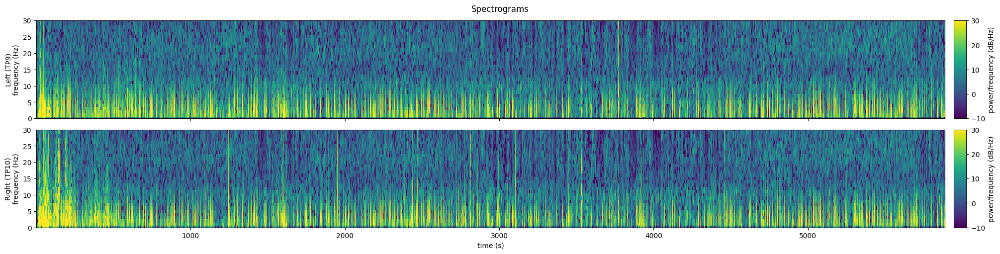

In [91]:
eeg_df['sample_number'] = range(len(eeg_df))
# Sampling rate of the EEG data in Hz
sampling_rate = 256  


# Convert the sample index to time in seconds
# This means you need to divide the sample *number* by the sampling rate
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

# Extract the desired channels (TP9 and TP10)
keep_channels = ['TP9', 'TP10']
eeg_data = eeg_df[keep_channels + ['time_seconds']].copy()

#
# Preprocess the EEG signals
#

#Define the pre-preprocessing parameters
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]
downsample_factor = 2

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in keep_channels:
    filtered_name = channel + '_bp'
    # Apply high-pass filter above 1 Hz and low-pass filter below 50 Hz
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample the signal from 256 to 128 Hz
    # Put the shorter signals in a new dataframe "eeg_downsampled"
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)
eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

#
# View the original and processed data
#
plot_height = 2
n_plots = 3
f, axs = plt.subplots(nrows=n_plots, ncols=1,
                      figsize=(20, plot_height * n_plots),
                      layout='constrained', sharex=True)

plot_slice = slice(0, 2500) #window of data to plot

#Original data
eeg_data[plot_slice].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)',
    linewidth=1, ax=axs[0],
    title=f'original data (samples {plot_slice.start} to {plot_slice.stop})'
)

#Filtered
eeg_data[plot_slice].plot(
    y=[chan + '_bp' for chan in keep_channels], x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[1], title=f'bandpass {bp_passband}Hz'
)

#Downsampled
eeg_downsampled[plot_slice.start:plot_slice.stop//downsample_factor].plot(
    y=keep_channels, x='time_seconds',
    ylabel='signal', xlabel='time (s)', legend=False,
    linewidth=1, ax=axs[2], title=f'downsampled {downsample_factor}x'
)

# Define the parameters for the spectrogram
window = 'hann'  # Windowing function
nperseg = 128    # Length of each segment
noverlap = 64    # Overlap between segments
nfft = 128       # Number of points for the FFT

# Compute the spectrogram for each channel
spectrograms = {}
for channel in keep_channels:
    frequencies, times, spectrogram = signal.spectrogram(
        eeg_downsampled[channel],
        fs=sampling_rate / downsample_factor,
        window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft
    )
    spectrograms[channel] = spectrogram

# Plot the spectrograms
f, axs = plt.subplots(nrows=2, ncols=1, figsize=(20, 5),
                      layout='constrained', sharex=True)
f.suptitle('Spectrograms')
vmin, vmax = -10, 30

for channel, ax in zip(keep_channels, axs):
    im = ax.pcolormesh(
        times, frequencies, 10 * np.log10(spectrograms[channel]),
        vmin=vmin, vmax=vmax, #comment out for auto-range
        shading='nearest', cmap='viridis'
    )
    
    ax.set_ylim(0, 30)  # Limit the y-axis to frequencies up to 30 Hz
    ax.set_ylabel(('Left' if channel=='TP9' else 'Right') + f' ({channel})\nfrequency (Hz)')
    
    cbar = f.colorbar(im, aspect=8, pad=0.01, label='power/frequency (dB/Hz)')
    
ax.set_xlabel('time (s)')

### Beta Band Frequency

C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
C:\Users\user\AppData\Local\Temp\ipykernel_20548\2311125684.py:70: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")


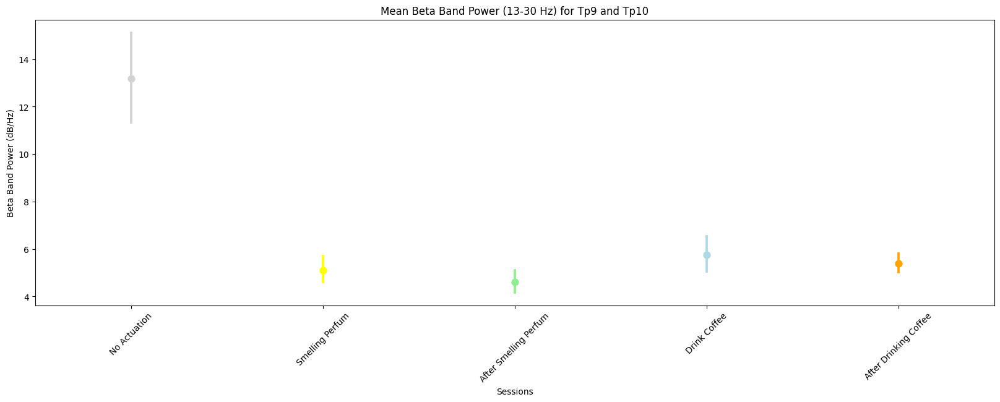

In [92]:
# Sample EEG DataFrame
# Assuming you have an EEG DataFrame named eeg_df with columns 'TP9' and 'TP10'

# Preprocessing parameters
sampling_rate = 256
downsample_factor = 2
bp_order = 4
bp_passband = [1, 50]

# Apply preprocessing and downsampling
eeg_df['sample_number'] = range(len(eeg_df))
eeg_df['time_seconds'] = eeg_df['sample_number'] / sampling_rate

eeg_data = eeg_df[['TP9', 'TP10', 'time_seconds']].copy()

eeg_downsampled = pd.DataFrame()
downsampled_length = len(eeg_data) // downsample_factor

for channel in ['TP9', 'TP10']:
    filtered_name = channel + '_bp'
    # Apply bandpass filter
    b, a = signal.butter(bp_order, bp_passband, btype='bandpass', fs=sampling_rate)
    eeg_data[filtered_name] = signal.filtfilt(b, a, eeg_data[channel])
    
    # Downsample
    eeg_downsampled[channel] = signal.resample(eeg_data[filtered_name], downsampled_length)

eeg_downsampled['time_seconds'] = np.arange(downsampled_length) / (sampling_rate / downsample_factor)

# Compute spectrogram for each channel
frequencies, times, spectrogram_tp9 = signal.spectrogram(
    eeg_downsampled['TP9'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

_, _, spectrogram_tp10 = signal.spectrogram(
    eeg_downsampled['TP10'],
    fs=sampling_rate / downsample_factor,
    window='hann', nperseg=128, noverlap=64, nfft=128
)

# Compute beta band power (13-30 Hz) for each channel
beta_band_power_tp9 = np.mean(spectrogram_tp9[(frequencies >= 13) & (frequencies <= 30)], axis=0)
beta_band_power_tp10 = np.mean(spectrogram_tp10[(frequencies >= 13) & (frequencies <= 30)], axis=0)

# Compute mean beta band power across channels
mean_beta_band_power = (beta_band_power_tp9 + beta_band_power_tp10) / 2

# Define intervals and corresponding labels
intervals = [(0, 964), (964, 964 + 360), (964 + 360, 964 + 360 + 964), (964 + 360 + 964, 964 + 360 + 964 + 1800),
             (964 + 360 + 964 + 1800,964 + 360 + 964 + 1800+1440)]
labels = ['No Actuation', 'Smelling Perfum', 'After Smelling Perfum', 'Drink Coffee', 'After Drinking Coffee']

# Assign labels to each data point based on intervals
beta_power_df = pd.DataFrame({'Time': times, 'Power': mean_beta_band_power})
beta_power_df['Sessions'] = pd.cut(beta_power_df['Time'], bins=[interval[0] for interval in intervals] + [np.inf], labels=labels)

# Define color palette dictionary
color_palette = {
    'No Actuation': 'lightgray',
    'Smelling Perfum': 'yellow',
    'After Smelling Perfum': 'lightgreen',
    'Drink Coffee': 'lightblue',
    'After Drinking Coffee': 'orange'
}

# Plot
plt.figure(figsize=(20, 6))
sns.pointplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette, join=True, estimator=np.mean, linestyle="none")
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.xticks(rotation=45)
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_20548\326147265.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)


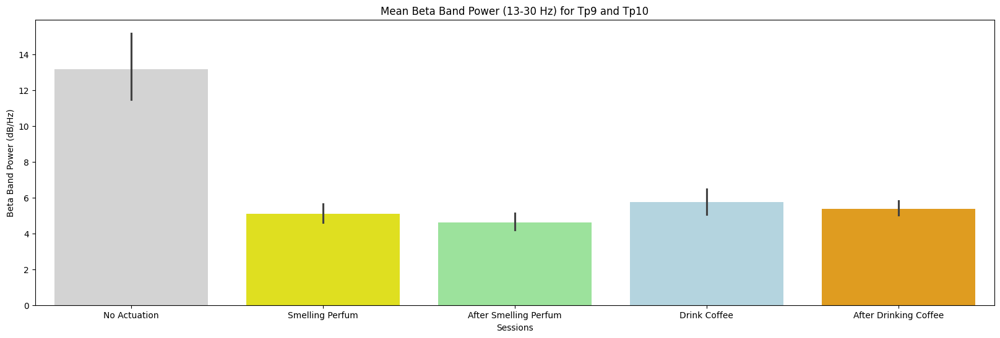

In [93]:
# Generate the bar plot
plt.figure(figsize=(20, 6))
sns.barplot(data=beta_power_df, x='Sessions', y='Power', palette=color_palette)
plt.title('Mean Beta Band Power (13-30 Hz) for Tp9 and Tp10')
plt.ylabel('Beta Band Power (dB/Hz)')
plt.xlabel('Sessions')
plt.show()